In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import random

import pandas as pd

import astropy
import astropy.table as at
import matplotlib.cm as cm


from astropy.io.votable import parse, parse_single_table

from astropy.coordinates import SkyCoord
from dustmaps.planck import PlanckQuery
from dustmaps.sfd import SFDQuery
import astropy.units as units
import sklearn

import time
from astroquery.gaia import Gaia
import os
from astropy.io import fits

from astroquery.skyview import SkyView
from astroquery.simbad import Simbad
import astropy.coordinates as coord
import lightkurve as lk
import scipy
from scipy import integrate
from gaiaxpy.plotter.multi_absolute import MultiAbsolutePlotter

import glob

In [2]:
import matplotlib

In [3]:
# import multiprocessing as mp
# mp.set_start_method(None, force=True)

from astroARIADNE.star import Star
from astropy.modeling.models import BlackBody
from astropy import units as u
from astropy.visualization import quantity_support
from astroARIADNE.star import Star
from astroARIADNE.fitter import Fitter
from astroARIADNE.plotter import SEDPlotter
import pickle as pkl
from extinction import apply
from isochrones.interp import DFInterpolator
from matplotlib.collections import LineCollection
from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec
from PyAstronomy import pyasl
from scipy.optimize import curve_fit

from astroARIADNE.phot_utils import *
from scipy import integrate

from matplotlib.lines import Line2D

Holoviews not imported. Some visualizations will not be available.
PyMultiNest not imported.  MultiNest fits will not work.
/u/g/gcontard/miniconda3/envs/numbatest/lib/python3.9/site-packages/astroARIADNE/fitter.py:43: UserWarning: (py)MultiNest installation (or libmultinest.dylib) not detected.
  warnings.warn(


In [4]:

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.neighbors import NearestNeighbors, BallTree


from gaiaxpy.plotter.multi_xp import MultiXpPlotter
from gaiaxpy import plot_spectra
from gaiaxpy.core.satellite import BANDS

from gaiaxpy import convert, calibrate

In [5]:
from astropy import units as u
from astropy.coordinates import SkyCoord
from astroquery.gaia import Gaia

import pyvo

def get_ang_sep_gaia(ra_t, dec_t):
    q_order_ang = "SELECT *, DISTANCE("
    q_order_ang += f"POINT({ra_t},{dec_t}), "
    q_order_ang += "POINT(ra, dec)) AS ang_sep "
    q_order_ang += "FROM gaiadr3.gaia_source_lite "
    q_order_ang += "WHERE 1 = CONTAINS("
    q_order_ang += f"POINT({ra_t},{dec_t}), "
    q_order_ang += "CIRCLE(ra, dec, 10./3600.)) "
    # Do we want to keep the parallax condition ?
    #q_order_ang += "AND parallax IS NOT NULL"
    q_order_ang += "ORDER BY ang_sep ASC"
    return q_order_ang
def get_ang_sep_tmass(ra_t, dec_t):
    q_order_ang = "SELECT *, DISTANCE("
    q_order_ang += f"POINT({ra_t},{dec_t}), "
    q_order_ang += "POINT(ra, dec)) AS ang_sep "
    q_order_ang += "FROM gaiadr1.tmass_original_valid "
    q_order_ang += "WHERE 1 = CONTAINS("
    q_order_ang += f"POINT({ra_t},{dec_t}), "
    q_order_ang += "CIRCLE(ra, dec, 10./3600.)) "
    # Do we want to keep the parallax condition ?
    #q_order_ang += "AND parallax IS NOT NULL"
    q_order_ang += "ORDER BY ang_sep ASC"
    return q_order_ang

def get_timeseries_wise(ra_t, dec_t):
    service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
    query = "SELECT source_id_mf,ra,dec,nb,na,cc_flags,frame_id,mjd,w1mpro_ep,w1sigmpro_ep,w1rchi2_ep,w2mpro_ep"
    query += ",w2sigmpro_ep,w2rchi2_ep,w3mpro_ep,w3sigmpro_ep,w3rchi2_ep,w4mpro_ep,w4sigmpro_ep,w4rchi2_ep,"
    query += " w1flux_ep,w1sigflux_ep,w2flux_ep,w2sigflux_ep,w3flux_ep,w3sigflux_ep,w4flux_ep,w4sigflux_ep,"
    query += "qi_fact,saa_sep,moon_masked FROM allwise_p3as_mep WHERE "
    query += f" CONTAINS(POINT('ICRS',ra, dec),CIRCLE('ICRS', {ra_t}, {dec_t}, 0.00249))=1"
    result = service.run_async(query)
    tab = result.to_table()
    return tab



def get_timeseries_neowise(ra_t, dec_t, ang=0.00249):
    
    service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
    query = "SELECT ra,dec,sigra,sigdec,sigradec,w1mpro,w1sigmpro,w1snr,w1rchi2,w2mpro,w2sigmpro,w2snr,w2rchi2,"
    query += "nb,na,cc_flags,ph_qual,qual_frame,mjd,w1flux,w1sigflux,w2flux,w2sigflux,allwise_cntr,w1mpro_allwise,"
    query += "w1sigmpro_allwise,w2mpro_allwise,w2sigmpro_allwise,w3mpro_allwise,w3sigmpro_allwise,"
    query += "w4mpro_allwise,w4sigmpro_allwise,tmass_key,j_m_2mass,j_msig_2mass,h_m_2mass,h_msig_2mass,k_m_2mass"
    query += ",k_msig_2mass FROM neowiser_p1bs_psd WHERE "
    query += f" CONTAINS(POINT('ICRS', ra, dec),CIRCLE('ICRS',{ra_t}, {dec_t}, {ang}))=1"
    result = service.run_async(query)
    tab = result.to_table()
    return tab

def get_ang_sep_unwise(ra_t, dec_t):
    service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
    query = "SELECT unwise_objid,ra,dec FROM unwise_2019 WHERE "
    query += f" CONTAINS(POINT('ICRS', ra, dec),CIRCLE('ICRS',{ra_t}, {dec_t}, 10/3600))=1"
    result = service.run_async(query)
    tab = result.to_table()
    return tab


def get_allwise_neighbscore(sc_id, allwise_id):
    q_order_ang = "SELECT * "
    q_order_ang += "FROM gaiadr3.allwise_neighbourhood WHERE "
    q_order_ang += f"source_id={sc_id} AND allwise_oid={allwise_id}"
    return q_order_ang


def get_catwise_pmSNR(ra_t,dec_t):
    
### Get SNR AND Pmra pmdec from CATWise
# SELECT source_name,source_id,ra,dec,sigra,sigdec,w1snr,w2snr,w3snr,w4snr, w1mpro,w1sigmpro,w2mpro,w2sigmpro,rchi2,nb,
#        w1nm,w1m,w2nm,w2m,meanobsmjd,pmra,pmdec,sigpmra,sigpmdec,rchi2_pm,cc_flags,ab_flags 
# FROM catwise_2020 
# WHERE CONTAINS(POINT('ICRS', ra, dec),CIRCLE('ICRS', 89.860361, -9.3650726, 0.002777777777777778))=1
    service = pyvo.dal.TAPService('https://irsa.ipac.caltech.edu/TAP')
    query = "SELECT source_name,source_id,ra,dec,sigra,sigdec,w1snr,w2snr,w1mpro,w1sigmpro,"
    query += "w2mpro,w2sigmpro,rchi2,nb, w1nm,w1m,w2nm,w2m,meanobsmjd,pmra,pmdec,sigpmra,sigpmdec,rchi2_pm,"
    query += "cc_flags,ab_flags FROM catwise_2020 "
    query += f"WHERE CONTAINS(POINT('ICRS', ra, dec),CIRCLE('ICRS', {ra_t}, {dec_t}, 0.0001))=1"
    #print(query)

    result = service.run_async(query)
    tab = result.to_table()
    
    return tab

In [6]:

def scatter_hist(x, y, ax, ax_histx, ax_histy, s=3, alpha=.4, c='k'):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.scatter(x, y, s=s, alpha=alpha, c=c, rasterized=True)

    # now determine nice limits by hand:
    #binwidth = 0.25
    #xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    #lim = (int(xymax/binwidth) + 1) * binwidth

    #bins = np.arange(-lim, lim + binwidth, binwidth)
    ax_histx.hist(x, bins=20, histtype='step', color=c)
    ax_histy.hist(y, bins=20, histtype='step', orientation='horizontal', color=c)
    ax_histx.set_yscale('log')
    ax_histy.set_xscale('log')

In [7]:
folder_figs = '/scratch/gcontard/infrared/fig_paper_clean/'

In [8]:

plt.rcParams['font.size'] = '16'

In [9]:


df_unwise_merge = pd.read_csv('/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_unWise_cutsMSdust_8foldsMasks.csv')


<ipython-input-9-757039dd62a6>:1: DtypeWarning: Columns (168,388) have mixed types. Specify dtype option on import or set low_memory=False.
  df_unwise_merge = pd.read_csv('/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_unWise_cutsMSdust_8foldsMasks.csv')


In [10]:
## error and error/MAD are already computed within df_unwise_merge
## Integrate codes from this computation ! with the RF etc



# REMOVE COLUMNS FROM DF_UNWISE_MERGE THAT ARE NOT USED ANYMORE (mask_MADLINE etc )


# PUT CODE TO COMPUTE err/MAD and such?!

### The mean(error/MAD) etc also already computed as follow: 


In [11]:
## Grab the mean errors (color / mag) and scatter, the mean MAD (color/mag) and scatter 


## Add the code that built error/MAD etc?

column_error_mag = [[],[]]
column_error_color = [[], []]

# 
col_MADcolor = [[], []]
col_MADmag = [[], []]

col_errMAD_col, col_errMAD_mag = [[],[]], [[], []]

for w_ in range(1,3):
    for label in range(8):
        column_error_mag[w_-1].append(f'error_magW{w_}_{label}')
        column_error_color[w_-1].append(f'error_colorW{w_}_{label}')
        col_MADcolor[w_-1].append(f"MAD_neighb_k_w{w_}_{label}")
        col_MADmag[w_-1].append(f"MAD_neighb_W{w_}_{label}")
        col_errMAD_col[w_-1].append(f"error/MAD_colorW{w_}_{label}")
        col_errMAD_mag[w_-1].append(f'error/MAD_magW{w_}_{label}')

for i in range(1,3):
    df_unwise_merge[f'mean_error_W{i}_mag'] = df_unwise_merge[column_error_mag[i-1]].mean(axis=1)
    df_unwise_merge[f'std_error_W{i}_mag'] = df_unwise_merge[column_error_mag[i-1]].std(axis=1)
    
    df_unwise_merge[f'mean_error_W{i}_color'] = df_unwise_merge[column_error_color[i-1]].mean(axis=1)
    df_unwise_merge[f'std_error_W{i}_color'] = df_unwise_merge[column_error_color[i-1]].std(axis=1)
    
    df_unwise_merge[f'mean_MAD_W{i}_color'] = df_unwise_merge[col_MADcolor[i-1]].mean(axis=1)
    df_unwise_merge[f'std_MAD_W{i}_color'] = df_unwise_merge[col_MADcolor[i-1]].std(axis=1)
    
    df_unwise_merge[f'mean_MAD_W{i}_mag'] = df_unwise_merge[col_MADmag[i-1]].mean(axis=1)
    df_unwise_merge[f'std_MAD_W{i}_mag'] = df_unwise_merge[col_MADmag[i-1]].std(axis=1)
    
    df_unwise_merge[f"mean_error/MAD_W{i}_mag"] = df_unwise_merge[col_errMAD_mag[i-1]].mean(axis=1)
    df_unwise_merge[f"std_error/MAD_W{i}_mag"] = df_unwise_merge[col_errMAD_mag[i-1]].std(axis=1)
    
    df_unwise_merge[f"mean_error/MAD_W{i}_color"] = df_unwise_merge[col_errMAD_col[i-1]].mean(axis=1)
    df_unwise_merge[f"std_error/MAD_W{i}_color"] = df_unwise_merge[col_errMAD_col[i-1]].std(axis=1)
    
col_neigbdist = [f"median_dists_KNN_{label}" for label in range(8)]

df_unwise_merge['mean_meddistneighb'] = df_unwise_merge[col_neigbdist].mean(axis=1)
df_unwise_merge['std_meddistneighb'] = df_unwise_merge[col_neigbdist].std(axis=1)




In [12]:
# df_unwise_merge['']

### Computing $\widehat{W}$ 

In [13]:
colnam_w1_pred = [f"W1unw_pred_{i}" for i in range(8)]
colnam_w2_pred = [f"W2unw_pred_{i}" for i in range(8)]

df_unwise_merge['hatW1_pred'] = np.nanmedian(df_unwise_merge[colnam_w1_pred].values, axis=1)
df_unwise_merge['hatW2_pred'] = np.nanmedian(df_unwise_merge[colnam_w2_pred].values, axis=1)


In [14]:
print(np.nanmean( (df_unwise_merge['mag_w1_vg'] - df_unwise_merge['hatW1_pred'])**2),
      np.nanmean( (df_unwise_merge['mag_w2_vg'] - df_unwise_merge['hatW2_pred'])**2))

0.0004744347229258739 0.0010238276046063849


In [15]:
print(np.nanmean(np.abs(df_unwise_merge['mag_w1_vg'] - df_unwise_merge['hatW1_pred'])),
      np.nanmean(np.abs(df_unwise_merge['mag_w2_vg'] - df_unwise_merge['hatW2_pred'])))

0.01630252171647943 0.02349933582762921


### Computing the masks

Make this into function for future injection tests?

In [16]:
## Mask using the error between True W and Median(Prediction) (\widehat{W})
x_ = df_unwise_merge['mag_w1_vg'] - df_unwise_merge['hatW1_pred']
y_ = df_unwise_merge['mag_w2_vg'] - df_unwise_merge['hatW2_pred']
slope = -1
sig_ =  np.percentile(x_+y_, 0.008)
print(f"Sigma for err hat {sig_}")

mask_errhat = (x_*slope + sig_) > y_
mask_errhat = mask_errhat & (x_ < -0.1) & (y_ < -0.1)
df_unwise_merge['mask_errhat'] = mask_errhat


## Mask using the mean error between True W and the Prediction, over the folds (\tilde{W})
slope = -1
x_,y_ = df_unwise_merge['mean_error_W1_mag'], df_unwise_merge['mean_error_W2_mag']
sig_ =  np.percentile(x_+y_, 0.008)
print(f"Sigma for err tild {sig_}")
mask_errtild = (x_*slope + sig_) > y_
mask_errtild = mask_errtild & (x_ < -0.1) & (y_ < -0.1)
df_unwise_merge['mask_errtild'] = mask_errtild


## Mask using mean(error/k-MAD) over the folds 
x_,y_ = df_unwise_merge['mean_error/MAD_W1_mag'], df_unwise_merge['mean_error/MAD_W2_mag']
slope = -1
sig_ =  np.percentile(x_+y_, 0.007)
print(f"Sigma for error/kMAD mask {sig_}")
mask_errKMAD = (x_*slope + sig_) > y_
mask_errKMAD = mask_errKMAD & (x_ < - 5) & (y_ < -5)
df_unwise_merge['mask_errKMAD'] = mask_errKMAD


## Mask for fold-MAD
df_unwise_merge['MAD_fold_W1'] = np.nanmedian(np.abs(
                            df_unwise_merge[colnam_w1_pred].values - df_unwise_merge['hatW1_pred'].values.reshape(-1,1)),
                            axis=1)
df_unwise_merge['MAD_fold_W2'] = np.nanmedian(np.abs(
                        df_unwise_merge[colnam_w2_pred].values - df_unwise_merge['hatW2_pred'].values.reshape(-1,1)),
                            axis=1)
df_unwise_merge['mask_MADFold'] = (df_unwise_merge['MAD_fold_W2'] < .01) & (df_unwise_merge['MAD_fold_W1'] < 0.01)


Sigma for err hat -0.4206238987848004
Sigma for err tild -0.41866508753577003
Sigma for error/kMAD mask -23.59998914273005


### Plots of preliminary set of candidates in error space

In [17]:

plt.rcParams['font.size'] = '20'

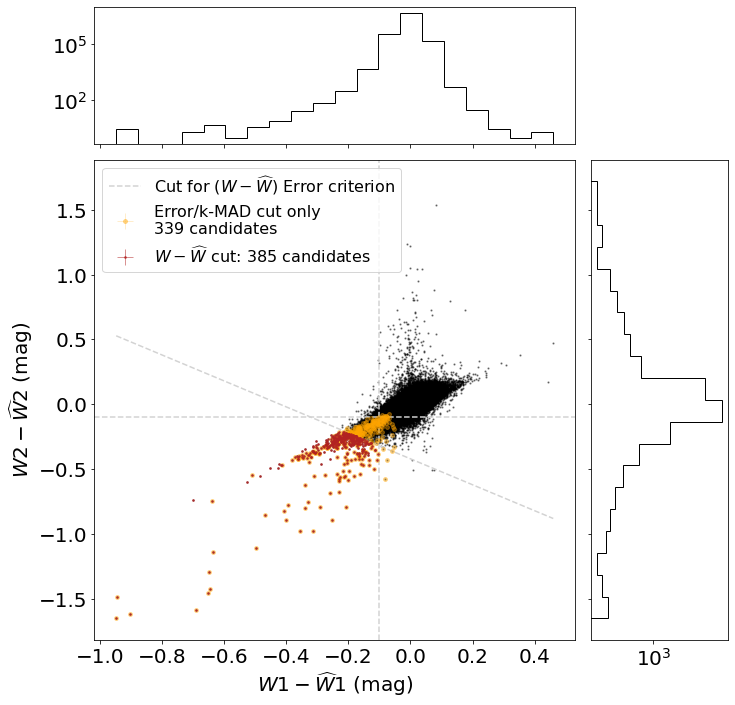

In [35]:
fig = plt.figure(figsize=(11, 11))
gs = fig.add_gridspec(2, 2,  width_ratios=(7, 2), height_ratios=(2, 7),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)


x_ = df_unwise_merge['mag_w1_vg'] - df_unwise_merge['hatW1_pred']
y_ = df_unwise_merge['mag_w2_vg'] - df_unwise_merge['hatW2_pred']


scatter_hist(x_, 
             y_,
             ax, ax_histx, ax_histy, s=1.5,alpha=.4, c='k')

ax.set_xlabel(r"$W1 - \widehat{W}1$ (mag)")
ax.set_ylabel(r"$W2 - \widehat{W}2$ (mag)")

mask_ = df_unwise_merge['mask_errKMAD']  

ax.errorbar(x_[mask_], y_[mask_], xerr= 0, #df_unwise_merge['std_error_W1_mag'][mask_],
             yerr=0, #df_unwise_merge['std_error_W2_mag'][mask_],
            linestyle='none',
           color='orange', elinewidth=.5, markersize=3.9, alpha=.4, marker='o',
            label=f"Error/k-MAD cut only \n{np.sum(mask_)} candidates")

## Mask Error

mask_ = df_unwise_merge['mask_errhat'] 

ax.errorbar(x_[mask_], y_[mask_], xerr= 0 , #df_unwise_merge['std_error_W1_mag'][mask_],
             yerr=0, #df_unwise_merge['std_error_W2_mag'][mask_], 
            linestyle='none',
           color='firebrick', elinewidth=.7, markersize=1.7, alpha=.7, marker='o',
            label=r"$W - \widehat{W}$ cut: "+ "{} candidates".format(np.sum(mask_)))


ax.axhline(-.1, c='lightgrey', ls='--')
ax.axvline(-.1, c='lightgrey', ls='--', label=r"Cut for ($W - \widehat{W}$) Error criterion")

ax.legend( loc="upper left", fontsize=16) #bbox_to_anchor=(-.1, 1.),

xs = np.linspace(np.min(x_), np.max(x_),10)

sig_ =  np.percentile(x_+y_, 0.008)
ys = -1 * xs + sig_
ax.plot(xs,ys,color='lightgrey', ls='--')


plt.savefig(folder_figs+'hatW_error_plot.pdf' , bbox_inches="tight", dpi=50)

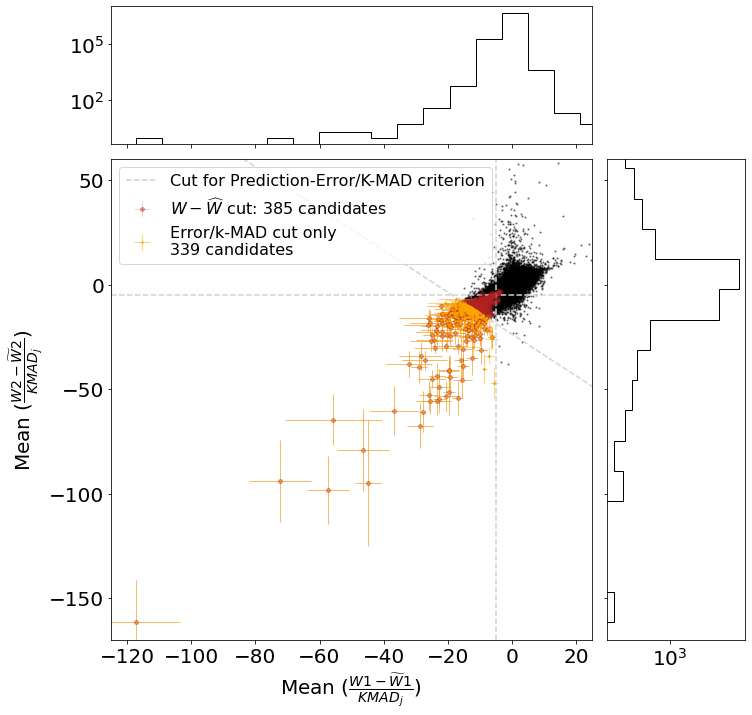

In [36]:
fig = plt.figure(figsize=(11, 11))
gs = fig.add_gridspec(2, 2,  width_ratios=(7, 2), height_ratios=(2, 7),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)


x_ = df_unwise_merge['mean_error/MAD_W1_mag']
y_ = df_unwise_merge['mean_error/MAD_W2_mag']


scatter_hist(x_, 
             y_,
             ax, ax_histx, ax_histy, s=1.5,alpha=.4, c='k')

ax.set_xlabel(r"Mean $(\frac{W1 - \widetilde{W}1}{KMAD_j})$ ")
ax.set_ylabel(r"Mean $(\frac{W2 - \widetilde{W}2}{KMAD_j})$")


mask_ = df_unwise_merge['mask_errhat'] 

ax.errorbar(x_[mask_], y_[mask_], xerr= df_unwise_merge['std_error/MAD_W1_mag'][mask_],
             yerr= df_unwise_merge['std_error/MAD_W2_mag'][mask_],
            linestyle='none',
           color='firebrick', elinewidth=.5, markersize=3.9, alpha=.4, marker='o',
            label=r"$W - \widehat{W}$ cut: "+ "{} candidates".format(np.sum(mask_)))


mask_ = df_unwise_merge['mask_errKMAD']  

ax.errorbar(x_[mask_], y_[mask_], xerr= df_unwise_merge['std_error/MAD_W1_mag'][mask_],
             yerr= df_unwise_merge['std_error/MAD_W2_mag'][mask_],
            linestyle='none',
           color='orange', elinewidth=.7, markersize=1.7, alpha=.7, marker='o',
            label=f"Error/k-MAD cut only \n{np.sum(mask_)} candidates")



ax.axhline(-5, c='lightgrey', ls='--')
ax.axvline(-5, c='lightgrey', ls='--', label="Cut for Prediction-Error/K-MAD criterion")

ax.legend( loc="upper left", fontsize=16) #bbox_to_anchor=(-.1, 1.),

xs = np.linspace(np.min(x_), np.max(x_),10)

sig_ =  np.percentile(x_+y_, 0.007)
ys = -1 * xs + sig_
ax.plot(xs,ys,color='lightgrey', ls='--')

ax.set_ylim(-170,60)
ax.set_xlim(-125, 25)

plt.savefig(folder_figs+'meanKMAD_errorplot.pdf' , bbox_inches="tight", dpi=50)

/scratch/gcontard/infrared/fig_paper_clean/


### Grabbing additional data for the subsection of candidates for further cuts

The necessary data should be included in df_unwise_merge and the code is left as indicative

In [18]:
mask_hatall =(df_unwise_merge['mask_errhat']& df_unwise_merge['mask_errKMAD']& df_unwise_merge['mask_MADFold'])

idc_candidates_prelim = np.where(mask_hatall)[0]
print(len(idc_candidates_prelim))


127


In [19]:
# This could be more elegant.... (all expect df_un)


#  run the following to get data for ang sep crowding cut 



def get_ang_sep_crowding(idc_candidates, df_un, ang_sep_thresh_gaia = 0.0025):


    for i in idc_candidates: #addit_candi_hat: #idc_candidates:

        print("------------------")
        print(f"Gaia DR3 {df_un['source_id'].iloc[i]}")
        ra_t, dec_t = df_un['ra_2'].iloc[i], df_un['dec_2'].iloc[i]
        print(f"ra: {ra_t}   dec: {dec_t}")
        print(f"https://www.legacysurvey.org/viewer-dev?ra={ra_t}&dec={dec_t}&layer=unwise-neo7&zoom=15")
        print(f"https://www.legacysurvey.org/viewer-dev?ra={ra_t}&dec={dec_t}&layer=unwise-w3w4&zoom=15")


        query_ = get_ang_sep_gaia(ra_t, dec_t)
        print(query_)
        job = Gaia.launch_job_async(query_)

        r = job.get_results().to_pandas()
        print(len(r))
        if len(r) > 1:
            #dits_angulradec.append(np.min(r['ang_sep'].values[1:]))
            # There is more than one in the query:
            #if r['ang_sep'].values[1] > ang_sep_thresh_gaia
            df_un.loc[i, 'angsep_crowding_gaia'] = r['ang_sep'].values[1]
            print("more than 1 in search for Gaia")
            print(df_un['angsep_crowding_gaia'].iloc[i])
    #     else:
    #         dits_angulradec.append(10000)

        print(r[['source_id', 'parallax', 'phot_g_mean_mag','ang_sep']])


        query_ = get_ang_sep_tmass(ra_t, dec_t)
        print(query_)
        job = Gaia.launch_job_async(query_)

        r = job.get_results().to_pandas()
        print(len(r))
        if len(r) > 1:
            #dits_angulradec.append(np.min(r['ang_sep'].values[1:]))
            # There is more than one in the query:
            #if r['ang_sep'].values[1] > ang_sep_thresh_gaia
            df_un.loc[i, 'angsep_crowding_tmass'] = r['ang_sep'].values[1]
            print("more than 1 in search for 2MASS")
            print(df_un['angsep_crowding_tmass'].iloc[i])
    #     else:
    #         dits_angulradec.append(10000)

        print(r[['DESIGNATION', 'ra','dec','ang_sep']])



        r = get_ang_sep_unwise(ra_t, dec_t)
        c1 = SkyCoord(ra=ra_t*u.degree, dec=dec_t*u.degree, frame='icrs')
    #     c2 = SkyCoord(ra=11*u.degree, dec=10*u.degree, frame='fk5')
    #     c1.separation(c2)
        print(len(r))
        if len(r) > 1:
            #dits_angulradec.append(np.min(r['ang_sep'].values[1:]))
            # There is more than one in the query:
            #if r['ang_sep'].values[1] > ang_sep_thresh_gaia
            ang_dist = []
            for j in range(len(r)):
                c2 = SkyCoord(ra=r['ra'][j]*u.degree, dec=r['dec'][j]*u.degree, frame='icrs')
                ang_dist.append(c1.separation(c2).value)
            second_min_sep = np.sort(np.array(ang_dist))[1]
            df_un.loc[i, 'angsep_crowding_unwise'] = second_min_sep
            print("Ang dist in unwise when more than 1 candidate")
            print(ang_dist)
            print("more than 1 in search for UnWise")
            print(df_un['angsep_crowding_unwise'].iloc[i])
    #     else:
    #         dits_angulradec.append(10000)

        #print(r[['source_id', 'parallax', 'phot_g_mean_mag','ang_sep']])
        print(r['unwise_objid','ra','dec'])

        del ra_t, dec_t



        print("---")


#run the following to grab the data for the FoM Score, and PMRA-PMDEC from CatWise


def get_FOM_and_catwise(idc_candidates, df_un):

    for i in idc_candidates: #addit_candi_hat :#idc_candidates:

        print("------------------")
        print(f"Gaia DR3 {df_un['source_id'].iloc[i]}")
        ra_t, dec_t = df_un['ra_2'].iloc[i], df_un['dec_2'].iloc[i]


        sc_id = df_un['source_id'].iloc[i]
        allwise_id = df_un['allwise_oid'].iloc[i]

        query_ = get_allwise_neighbscore(sc_id, allwise_id)
        #print(query_)
        #print(query_)
        job = Gaia.launch_job_async(query_)

        r = job.get_results().to_pandas()
        df_un.loc[i, 'score_FOM'] =r['score'][0]
        #

        r = get_catwise_pmSNR(ra_t, dec_t)
        #print(f"Lenght of query {len(r)}")

        if (len(r)>1) | (len(r)==0):
            print("!!! Some issues there / remove this outlier? More than 1 match within radius")
    #         snrw1.append(0)
    #         snrw2.append(0)
    #         pmracat.append(0)
    #         pmdeccat.append(0)
    #         mask_issue.append(False)
        else:
            df_un.loc[i,'snrw1'] = r['w1snr']
            df_un.loc[i, 'snrw2'] = r['w2snr']
            df_un.loc[i,'pmracat'] = r['pmra']
            df_un.loc[i,'pmdeccat'] = r['pmdec']
        #mask_issue.append(True)
        del r
        
        
## Compute Simbad properties 

def get_simbad(idcs_maskplot, df_un):
    customSimbad = Simbad()
    customSimbad.add_votable_fields('morphtype', 'mt', 'otype', 'otypes', 'rot', 
                                    'sp', 'sp_nature', 'sptype', 'diameter', 'dim')



    results_simbad = []
    two_res_simbad = []
    for i in range(len(idcs_maskplot)):
        result_table = customSimbad.query_region(coord.SkyCoord(ra=df_un['ra_2'].iloc[idcs_maskplot[i]],
                                                      dec=df_un['dec_2'].iloc[idcs_maskplot[i]],
                                       unit=(u.deg, u.deg), frame='icrs'),
                                       radius=0.001 * u.deg)
        results_simbad.append(result_table)

        print("------------")
        print(f"Gaia {df_un['source_id'].iloc[idcs_maskplot[i]]}")
        if result_table is None:
            print("No match in Simbad")
        else:
            print(len(result_table))
            if len(result_table)>1:
                two_res_simbad.append(idcs_maskplot[i])
                result_table = result_table[0]
                df_un.loc[idcs_maskplot[i], 'simbad_other_objects'] = 'More than 1'
                print("DEAL WITH THIS")
            else:
                print(result_table['OTYPE'])
                print(result_table['OTYPES'])
                print(result_table['SP_TYPE'])
                print(result_table['SP_TYPE_2'])

                ## Check the actual angular sep with target
                c1 = coord.SkyCoord(ra=df_un['ra_2'].iloc[idcs_maskplot[i]],
                                   dec=df_un['dec_2'].iloc[idcs_maskplot[i]],
                                           unit=(u.deg, u.deg), frame='icrs')
                c2 = SkyCoord(ra=result_table['RA'][0], dec=result_table['DEC'][0],unit=(u.hourangle, u.deg), 
                              frame='icrs')
                dist = c1.separation(c2).value
                print(f"Distance {dist}")
                print(df_un['ra_2'].iloc[idcs_maskplot[i]],
                    df_un['dec_2'].iloc[idcs_maskplot[i]])

                #if dist < 0.001:
                #    print("Distance is close enough")
                if ((result_table['OTYPE'] == 'EclBin') | (result_table['OTYPE'] == 'EclBin_Candidate')).data[0]:
                    df_un.loc[idcs_maskplot[i], 'eclip_bin_simbad'] = True

                df_un.loc[idcs_maskplot[i], 'simbad_other_objects'] = result_table['OTYPE']

    #         else:
    #             print("Check distance on simbad")


## Apply all masks 

In [20]:

mask_cur = df_unwise_merge['mask_errhat'] & df_unwise_merge['mask_errKMAD']

print(f"Error Prediction W - hat(W) AND error/k-mad & {np.sum(mask_cur)}")

mask_fold =  df_unwise_merge['mask_MADFold']
mask_cur = mask_cur & mask_fold 
print(f"Uncertainty in prediction < 0.01 mag & {np.sum(mask_cur)}")

# errmag_line now includs W1 and W2 cuts # & df_unwise_merge['mask_err_W1.2'])

ang_sep_tresh = 0.0014
less_strong_crowd = (df_unwise_merge['angsep_crowding_unwise']==0) | ((df_unwise_merge['angsep_crowding_unwise'] > ang_sep_tresh) )
less_strong_crowd = less_strong_crowd & (df_unwise_merge['angsep_crowding_tmass']==0) | ((df_unwise_merge['angsep_crowding_tmass'] > ang_sep_tresh) )
less_strong_crowd = less_strong_crowd & (df_unwise_merge['angsep_crowding_gaia']==0) | ((df_unwise_merge['angsep_crowding_gaia'] > ang_sep_tresh) )

mask_cur = mask_cur & less_strong_crowd
print("Crowding cut at 5 arcsecond & {}".format(np.sum(mask_cur)))

#mask_SNR = df_unwise_merge['snrw1'] > 10
mask_FOM = df_unwise_merge['score_FOM'] > 4

# The correct mask corresponding to word to the wise would be to remove (FOM < 4 & SNR <10)
# i.e. mask_snr_fom = ~((df_unwise_merge['snrw1'] < 10) & (df_unwise_merge['score_FOM']<4))
# BUT I'm not sure we have the right SNR?!?! I think by all standard we have high SNR 
# so let's just do a FOM cut
# mask_snr_fom = ~((df_unwise_merge['snrw1'] < 10) & (df_unwise_merge['score_FOM']<4))


mask_cur = mask_cur & mask_FOM #
print("FoM > 4 cut & {}".format(np.sum(mask_cur)))

## Mask propermotion
x0,x1 = 11, 15.5
y0,y1 = 10, 30.
slope = (y1-y0)/(x1-x0)
b = y0 - slope*x0

mask_pmracat = (df_unwise_merge['phot_g_mean_mag'] * slope + b) > np.abs(df_unwise_merge['pmra']-df_unwise_merge['pmracat'] * 1000)
mask_pmdeccat = (df_unwise_merge['phot_g_mean_mag'] * slope + b) > np.abs(df_unwise_merge['pmdec']-df_unwise_merge['pmdeccat'] * 1000)


mask_propermotion = mask_pmracat & mask_pmdeccat
mask_cur = mask_cur & mask_propermotion

print("Proper-Motion disagreement cut & {}".format(np.sum(mask_cur)))


mask_allwise_disagree = np.abs(df_unwise_merge['w1mpro'] - (df_unwise_merge['mag_w1_vg_8folds']-0.004)) < 0.15
mask_allwise_disagree = mask_allwise_disagree & (np.abs(df_unwise_merge['w2mpro'] - (df_unwise_merge['mag_w2_vg_8folds']-0.032)) < 0.15)
mask_cur = mask_cur & mask_allwise_disagree

print(r"Disagreement AllWISE/unWISE cut & {}".format(np.sum(mask_cur)))


mask_meandistknn = df_unwise_merge['mean_meddistneighb'] < .1
mask_cur = mask_cur & mask_meandistknn

print(r"Mean Distance k-NN < .1 & {}".format(np.sum(mask_cur)))

mask_b =  (np.abs( df_unwise_merge['b']) > 10.)
print(r"abs(b) > 10 & {}".format(np.sum(mask_cur & mask_b)))

#print("ADD BINARIES AND DUPLICATED SOURCES")
mask_cur = mask_cur & mask_b


mask_gaia_single_star = (df_unwise_merge['non_single_star']==0)
mask_gaia_nonsingle_star = (df_unwise_merge['non_single_star']!=0)


mask_non_binaries = ~((mask_gaia_nonsingle_star) | (df_unwise_merge['eclip_bin_simbad']))

mask_cur = mask_cur & mask_non_binaries
print(r"Removing binaries (Gaia, Simbad) & {}".format(np.sum(mask_cur)))

mask_cur = mask_cur & ~(df_unwise_merge['duplicated_source'])
print(r"Removing duplicated sources & {}".format(np.sum(mask_cur)))


Error Prediction W - hat(W) AND error/k-mad & 170
Uncertainty in prediction < 0.01 mag & 127
Crowding cut at 5 arcsecond & 87
FoM > 4 cut & 87
Proper-Motion disagreement cut & 78
Disagreement AllWISE/unWISE cut & 76
Mean Distance k-NN < .1 & 66
abs(b) > 10 & 59
Removing binaries (Gaia, Simbad) & 55
Removing duplicated sources & 53


In [21]:
idc_candidates = np.where(mask_cur)[0]

In [29]:
#df_unwise_merge[['source_id','designation', 'DESIGNATION']][mask_cur]
print()
for i in idc_candidates:
    str_ = f"Gaia DR3 {df_unwise_merge['source_id'].iloc[i]} &"
    str_ += f" 2MASS J{df_unwise_merge['designation'].iloc[i]} &"
    str_ += f" {df_unwise_merge['ra_2'].iloc[i]} &"
    str_ += f" {df_unwise_merge['dec_2'].iloc[i]} \\\\"
    print(str_)


Gaia DR3 5085509597958589184 & 2MASS J03345037-2431354 & 53.7098217 & -24.5264832 \\
Gaia DR3 3462639162734302464 & 2MASS J12043381-3503489 & 181.1408489 & -35.0635607 \\
Gaia DR3 6502798709139275136 & 2MASS J23164722-5003200 & 349.1968656 & -50.0556181 \\
Gaia DR3 6836154657401562112 & 2MASS J21251584-1530166 & 321.3160272 & -15.5046488 \\
Gaia DR3 2886776063720502144 & 2MASS J06113860-3318218 & 92.9108762 & -33.3060102 \\
Gaia DR3 6705842630930258816 & 2MASS J18454108-4531283 & 281.4211754 & -45.5245191 \\
Gaia DR3 387557473467906432 & 2MASS J00425960+4332219 & 10.7483126 & 43.5394213 \\
Gaia DR3 3889059420143391744 & 2MASS J10333938+1548335 & 158.4141141 & 15.8092862 \\
Gaia DR3 2144442781092733952 & 2MASS J18513605+5059043 & 282.9001982 & 50.9845258 \\
Gaia DR3 1406113335695903872 & 2MASS J16421924+4510508 & 250.580136 & 45.1807974 \\
Gaia DR3 1815157499757887488 & 2MASS J20301140+1819156 & 307.5475052 & 18.3209679 \\
Gaia DR3 1704765570250298496 & 2MASS J17090439+7625499 & 257.26

# Hosts Characterization

In [41]:
def plot_hist_ft(ax, ft_, ft_name, legend=False):
    
    ax.hist(df_unwise_merge[ft_], bins=20, density=True, alpha=.3, color='darkblue', label='Full Sample');
    ax.hist(df_unwise_merge[ft_][mask_cur], bins=20, density=True, color='darkred',
             lw=2, histtype='step', label='Candidates');
    if legend:
        ax.legend()
    ax.set_xlabel(ft_name)
    
    #ax.set_ylabel("")

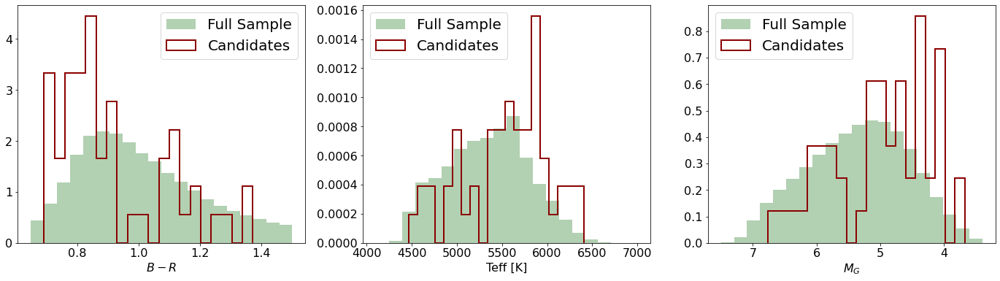

In [361]:
fig, axs = plt.subplots(1,3,figsize=(8*3,6))

plt.rcParams['font.size'] = '20'
ft_ = 'bp_rp'
ft_name = r"$B-R$"


plot_hist_ft(axs[0], ft_, ft_name, legend=True)



ft_ = 'teff_gspphot'
ft_name = "Teff [K]"
#fig,ax = plt.subplots(1,1,figsize=(8,6))
plot_hist_ft(axs[1], ft_, ft_name, legend=True)
#plt.show()



ft_= 'M_G'
ft_name = r"$M_G$"
#fig,ax = plt.subplots(1,1,figsize=(8,6))
plot_hist_ft(axs[2], ft_, ft_name, legend=True)
axs[2].invert_xaxis()
#plt.show()


#plt.savefig(folder_figs+'candidates_hist.pdf' , bbox_inches="tight", dpi=50)

plt.rcParams['font.size'] = '16'

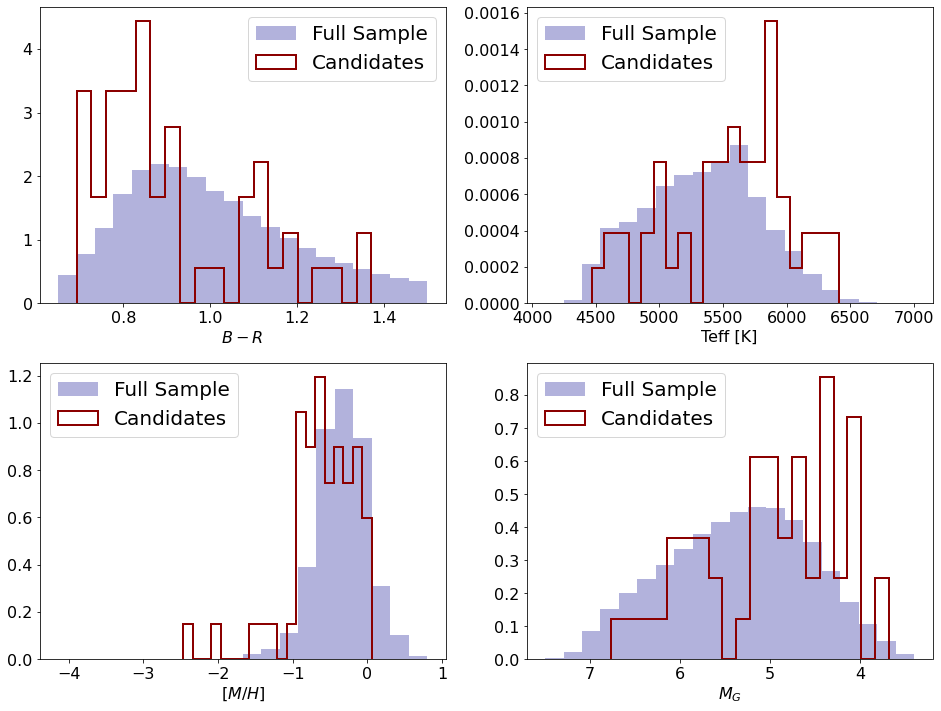

In [94]:
fig, axs = plt.subplots(2,2,figsize=(8*2,6*2))

plt.rcParams['font.size'] = '20'
ft_ = 'bp_rp'
ft_name = r"$B-R$"


plot_hist_ft(axs[0,0], ft_, ft_name, legend=True)



ft_ = 'teff_gspphot'
ft_name = "Teff [K]"
#fig,ax = plt.subplots(1,1,figsize=(8,6))
plot_hist_ft(axs[0,1], ft_, ft_name, legend=True)
#plt.show()


ft_= 'mh_gspphot'
ft_name = r"$[M/H]$"
#fig,ax = plt.subplots(1,1,figsize=(8,6))
plot_hist_ft(axs[1,0], ft_, ft_name, legend=True)
#axs[1,0].invert_xaxis()
#plt.show()

ft_= 'M_G'
ft_name = r"$M_G$"
#fig,ax = plt.subplots(1,1,figsize=(8,6))
plot_hist_ft(axs[1,1], ft_, ft_name, legend=True)
axs[1,1].invert_xaxis()
#plt.show()


plt.savefig(folder_figs+'candidates_hist_mh.pdf' , bbox_inches="tight", dpi=50)


plt.rcParams['font.size'] = '16'

# H$\alpha$ emission

We need to grab Gaia astrophysical parameters :

ew_espels_halpha : Halpha pseudo-equivalent width from ESP-ELS (float, Length & Distance[nm])

Pseudo-equivalent width of the Hα line measured on the RP spectra (Section 11.3.7). The value is expected to be negative when emission is present. To try to compensate for the existence of blends with species other than hydrogen in the cooler stars and assuming that no photospheric Hα absorption is expected for K and M stars, we subtracted at Teff< 5 000 K the pseudo-equivalent width measured on a synthetic spectrum with astrophysical parameters close to those derived by GSP-Phot for the target. The value that was subtracted (i.e. when Teff< 5 000 K) is stored in ew_espels_halpha_model. ESP-ELS was only applied on targets brighter than magnitude G=17.65. More information on the module can be found in Section 11.3.7 and Section 11.4.4.


---

ew_espels_halpha_flag : Quality flag of the Halpha pseudo-equivalent width from ESP-ELS (string)

Quality flag of the Hα pseudo-equivalent width. It takes the following values:

• 0: if the value stored in ew_espels_halpha_model was not subtracted (Teff≥ 5 000 K).
• 1: if the value stored in ew_espels_halpha_model was subtracted (Teff< 5 000 K).
ESP-ELS was only applied on targets brighter than magnitude G=17.65. More information on the module can be found in Section 11.3.7 and Section 11.4.4.

---

classlabel_espels : Adopted ELS class label from ESP-ELS (string)

The emission-line star class is based on the analysis of the BP/RP spectrum. Two random forest algorithms were used to classify the ELS targets. The first classifier is aimed to identify Wolf-Rayet stars and planetary nebulæ, and was trained on a subset of Gaia spectra chosen to be representative of each class. The second classifier is applied once significant Hα emission was detected in order to identify Be, Herbig Ae/Be, T Tauri, and active M dwarf stars. It was trained on Gaia BP/RP spectra and on the astrophysical parameters. The astrophysical parameters adopted during the training and the processing are those obtained by GSP-Phot (best library value, taken before any post-processing filter or calibration was applied) for the target. The class label corresponds to the one having the highest probability and can take the following values:

• beStar (Be star)
• HerbigStar (Herbig Ae/Be star)
• PlanetaryNebula (Planetary Nebula)
• RedDwarfEmStar (active M dwarf star)
• TTauri (T Tauri star)
• wC (Wolf-Rayet star of type WC)
• wN (Wolf-Rayet star of type WN)
When no emission was found or when the spectrum could not be classified, the field is empty. ESP-ELS was only applied on targets brighter than magnitude G=17.65. More information on the module can be found in Section 11.3.7 and Section 11.4.4.



In [45]:
query_ = "SELECT * FROM gaiadr3.gaia_source  AS dr3  JOIN gaiadr3.astrophysical_parameters \
 AS astropara USING (source_id) JOIN gaiadr3.astrophysical_parameters_supp \
 AS astropara_supp USING (source_id) WHERE (dr3.source_id IN ("



for i in range(len(idc_candidates)-1):
    query_+= f"{df_unwise_merge['source_id'].iloc[idc_candidates[i]]},"
    
query_ += f"{df_unwise_merge['source_id'].iloc[idc_candidates[i+1]]}))"

#print(query_)
job = Gaia.launch_job_async(query_)

r_candi = job.get_results().to_pandas()
print(len(r_candi))

INFO: Query finished. [astroquery.utils.tap.core]
53


### !! the ordering of the returned tables is NOT the same as the query

In [44]:
sourceid_candi = df_unwise_merge['source_id'].iloc[idc_candidates].values

28


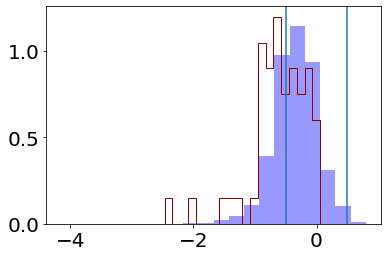

In [64]:
plt.hist(df_unwise_merge['mh_gspphot'].values, bins=20, density=True, color='b', alpha=.4);
plt.hist( df_unwise_merge['mh_gspphot'].iloc[idc_candidates], bins=20, density=True, histtype='step',
         color='darkred');
plt.axvline(0.5)
plt.axvline(-0.5)
print(np.sum(df_unwise_merge['mh_gspphot'].iloc[idc_candidates]<-.5))

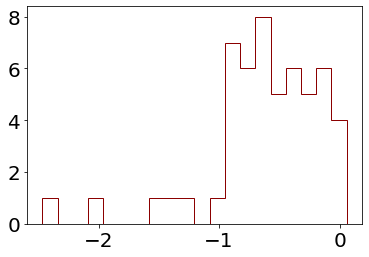

In [66]:
plt.hist( df_unwise_merge['mh_gspphot'].iloc[idc_candidates], bins=20, histtype='step',
         color='darkred');

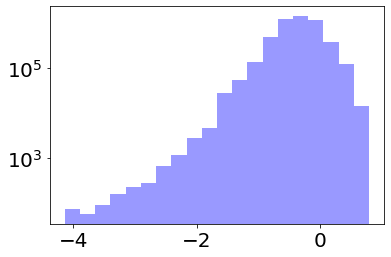

In [65]:
plt.hist(df_unwise_merge['mh_gspphot'].values, bins=20,  color='b', alpha=.4);
plt.yscale('log')

In [52]:
 df_unwise_merge['mh_gspphot'].iloc[idc_candidates]

219864    -0.8975
368011    -0.7233
368708    -0.7874
503270    -0.1507
619181    -0.3092
651479    -0.1604
789805    -0.8027
790296    -0.0487
804637    -0.6807
810552    -0.3732
810763    -0.4858
838263    -0.4309
933534    -2.4662
1052400   -0.5860
1074135   -0.8175
1091760   -0.3413
1236418   -0.1184
1359383   -0.5263
1408714   -1.0302
1421075   -0.9444
1672694   -0.6299
1877708   -0.6887
1943110   -1.3971
1989404    0.0042
2133114   -0.3712
2213120   -1.4844
2251144   -0.3414
2268006   -0.6619
2346301   -0.2118
2414089   -0.0729
2448035   -1.3283
2739731   -0.4693
2777417   -0.2666
3002866   -0.8622
3065203   -0.4760
3424623   -0.6500
3515122   -0.2589
3555168   -0.5777
3688258   -0.2245
3764076   -0.7861
3841620   -0.3573
3862440   -0.5923
3880628   -0.4995
3945643   -0.8953
4100894   -0.8230
4133853    0.0576
4281707   -0.0816
4451297   -0.8625
4472208   -0.8779
4483284   -0.0902
4712086   -2.0570
4782484   -0.8898
4850508    0.0193
Name: mh_gspphot, dtype: float64

In [53]:
r_candi[['ew_espels_halpha', 'classlabel_espels', 'ew_espels_halpha_flag', 'spectraltype_esphs',
  'activityindex_espcs', 'age_flame', 'flags_flame']]


,ew_espels_halpha,classlabel_espels,ew_espels_halpha_flag,spectraltype_esphs,activityindex_espcs,age_flame,flags_flame
0,0.024254,,1,K,NaN,4.352967,00
1,0.111246,,0,F,NaN,4.838193,00
2,0.139586,,0,F,NaN,11.845701,00
3,0.176461,,0,F,NaN,1.329416,00
4,0.019797,,0,G,NaN,3.905794,00
5,0.293870,,0,G,NaN,11.907492,00
6,0.236810,,0,G,NaN,5.708545,00
7,0.156763,,0,G,NaN,6.429120,00
8,0.070154,,0,G,NaN,1.367547,00
9,0.080134,,0,G,NaN,4.127759,00


### Grab data for a control (random) sample, and the neighbors sample:


In [54]:
## Nearest neighbours 

feature_regression = ['phot_g_mean_mag', 
                 'j_m', 'h_m', 'ks_m', 'j_h', 'j_k', 'h_k', 'g_j',
                 'phot_bp_mean_mag',
                 'phot_rp_mean_mag','ruwe',
                 'bp_rp', 'bp_g',
                 'g_rp','M_G','ebpminrp_gspphot', 'parallax'
                 ]

feature_neighbors = ['h_k', 'g_rp', 'ebpminrp_gspphot', 'j_k', 'parallax',
                        'g_j', 'M_G', 'ruwe', 'bp_g']



scaler = MinMaxScaler()
scaler.fit(df_unwise_merge[feature_neighbors])
ft_neighbors_resc = scaler.transform(df_unwise_merge[feature_neighbors])

K_neig_valid = 31
nbrs_valid = NearestNeighbors(n_neighbors=K_neig_valid, algorithm='ball_tree', 
                              leaf_size=100,n_jobs=10).fit(ft_neighbors_resc)




In [55]:
feature_neighbors_notcolor = ['M_G','ebpminrp_gspphot', 'parallax','ruwe','phot_g_mean_mag', 
                 'j_m', 'h_m', 'ks_m','phot_bp_mean_mag',
                 'phot_rp_mean_mag']

scaler_notcolor = MinMaxScaler()
scaler_notcolor.fit(df_unwise_merge[feature_neighbors_notcolor])
ft_neighbors_resc_notcol = scaler_notcolor.transform(df_unwise_merge[feature_neighbors_notcolor])

K_neig_valid = 31
nbrs_valid_notcol = NearestNeighbors(n_neighbors=K_neig_valid, algorithm='ball_tree', 
                              leaf_size=100,n_jobs=10).fit(ft_neighbors_resc_notcol)


In [56]:
sourceid_neighb_notcol, idc_neighb_notcol  = [], []

for id_ in idc_candidates:
    d_,neighb_ = nbrs_valid_notcol.kneighbors(ft_neighbors_resc_notcol[id_].reshape(1,-1)) 
    d_ = d_[0][1:]
    neighb_ = neighb_[0][1:]
    for i in neighb_:
        sourceid_neighb_notcol.append(df_unwise_merge['source_id'].iloc[i])
        idc_neighb_notcol.append(i)

query_ = "SELECT * FROM gaiadr3.gaia_source  AS dr3  JOIN gaiadr3.astrophysical_parameters \
 AS astropara USING (source_id) JOIN gaiadr3.astrophysical_parameters_supp \
 AS astropara_supp USING (source_id) WHERE (dr3.source_id IN ("

for i in range(len(sourceid_neighb_notcol)-1):
    query_+= f"{sourceid_neighb_notcol[i]},"
    
query_ += f"{sourceid_neighb_notcol[i+1]}))"

#print(query_)
job = Gaia.launch_job_async(query_)
r_neighb_notcol = job.get_results().to_pandas()
print(len(sourceid_neighb_notcol), len(r_neighb_notcol))

INFO: Query finished. [astroquery.utils.tap.core]
1590 1590


In [57]:
## Grab a random control sample
N_control = 1600
idc_control = random.sample(set(np.arange(len(df_unwise_merge))),N_control)
sourceid_control = df_unwise_merge['source_id'].iloc[idc_control].values

query_ = "SELECT * FROM gaiadr3.gaia_source  AS dr3  JOIN gaiadr3.astrophysical_parameters \
 AS astropara USING (source_id) JOIN gaiadr3.astrophysical_parameters_supp \
 AS astropara_supp USING (source_id) WHERE (dr3.source_id IN ("

for i in range(len(sourceid_control)-1):
    query_+= f"{sourceid_control[i]},"
    
query_ += f"{sourceid_control[i+1]}))"

#print(query_)
job = Gaia.launch_job_async(query_)
r_control = job.get_results().to_pandas()
print(len(sourceid_control), len(r_control))


<ipython-input-57-2465ae3764f7>:3: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  idc_control = random.sample(set(np.arange(len(df_unwise_merge))),N_control)


INFO: Query finished. [astroquery.utils.tap.core]
1600 1600


In [59]:
r_candi['so']

,solution_id,DESIGNATION,random_index,ref_epoch,ra,ra_error,dec,dec_error,parallax,parallax_error,...,age_flame_spec,age_flame_spec_lower,age_flame_spec_upper,flags_flame_spec,evolstage_flame_spec,gravredshift_flame_spec,gravredshift_flame_spec_lower,gravredshift_flame_spec_upper,bc_flame_spec,SOURCE_ID
0,1636148068921376768,Gaia DR3 302802517288053632,1706733833,2016.0,26.226637,0.040557,30.514457,0.037198,1.335146,0.046911,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,302802517288053632
1,1636148068921376768,Gaia DR3 344897216879901312,519174132,2016.0,29.812018,0.026346,40.183060,0.029255,0.621911,0.031113,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,344897216879901312
2,1636148068921376768,Gaia DR3 352632796577124992,863795169,2016.0,31.988669,0.029667,45.045765,0.025152,0.734043,0.031107,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,352632796577124992
3,1636148068921376768,Gaia DR3 387557473467906432,1624093449,2016.0,10.748315,0.023179,43.539395,0.018277,0.602866,0.028563,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,387557473467906432
4,1636148068921376768,Gaia DR3 619195165798222208,132228072,2016.0,143.063404,0.037683,16.340615,0.026950,1.107588,0.045422,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,619195165798222208
5,1636148068921376768,Gaia DR3 709086185604311552,774068704,2016.0,126.413851,0.035144,31.425169,0.026809,0.562967,0.040013,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,709086185604311552
6,1636148068921376768,Gaia DR3 907249585730646016,658329634,2016.0,120.549447,0.020864,37.167588,0.019122,0.807639,0.028011,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,907249585730646016
7,1636148068921376768,Gaia DR3 1052596673505827840,1658812803,2016.0,157.562809,0.022615,63.802530,0.024235,0.627396,0.030788,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,1052596673505827840
8,1636148068921376768,Gaia DR3 1245496161713883904,1102635413,2016.0,211.579457,0.025284,18.328065,0.023698,0.769438,0.037887,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,1245496161713883904
9,1636148068921376768,Gaia DR3 1406113335695903872,894859608,2016.0,250.580153,0.022718,45.180805,0.024609,1.027317,0.026203,...,NaN,NaN,NaN,,<NA>,NaN,NaN,NaN,NaN,1406113335695903872


In [60]:
reorder_r_candi = [np.where(r_candi['SOURCE_ID']==sourceid_candi[i])[0][0] for i in range(len(sourceid_candi))]
r_candi = r_candi.iloc[reorder_r_candi].reset_index(drop=True)

reorder_r_control = [np.where(r_control['SOURCE_ID']==sourceid_control[i])[0][0] for i in range(len(sourceid_control))]
r_control = r_control.iloc[reorder_r_control].reset_index(drop=True)

# reorder_r_neigh = [np.where(r_neighb['source_id']==sourceid_neighb[i])[0][0] for i in range(len(sourceid_neighb))]
# r_neighb = r_neighb.iloc[reorder_r_neigh]


In [61]:

reorder_r_neigh_notcol = [np.where(r_neighb_notcol['SOURCE_ID']==sourceid_neighb_notcol[i])[0][0] for i in range(len(sourceid_neighb_notcol))]
r_neighb_notcol = r_neighb_notcol.iloc[reorder_r_neigh_notcol].reset_index(drop=True)


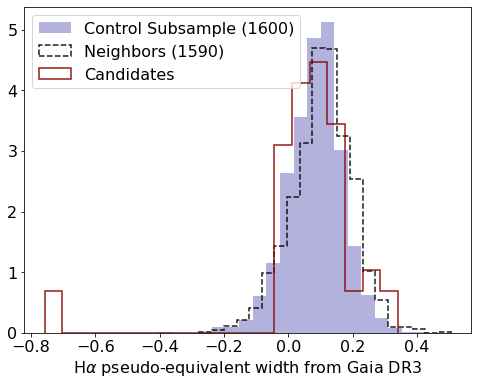

In [146]:
plt.figure(figsize=(8,6))

#ew_espels_halpha : negative if emission

plt.hist(r_control['ew_espels_halpha'], bins=20, density=True, color='darkblue', alpha=.3, 
        label=f'Control Subsample ({N_control})')
plt.hist(r_neighb_notcol['ew_espels_halpha'], bins=20, density=True, color='k', alpha=.9, histtype='step',
         ls='--', lw=1.5,
        label=f'Neighbors ({len(sourceid_neighb_notcol)})')
plt.hist(r_candi['ew_espels_halpha'], bins=20, density=True, color='darkred', alpha=.9, histtype='step', lw=1.5,
        # ls='--',
        label=f'Candidates')

plt.xlabel(r"H$\alpha$ pseudo-equivalent width from Gaia DR3")
plt.legend()


plt.savefig(folder_figs+'ew_halpha_controlNeighCandi_hist.pdf' , bbox_inches="tight", dpi=50)

In [147]:
r_candi['source_id'].iloc[np.where(r_candi['ew_espels_halpha'] < -.4)[0]]

25    5260430146906778624
32    3004530769758177280
Name: source_id, dtype: int64

In [148]:
r_candi['source_id'].iloc[np.where(r_candi['ew_espels_halpha'] > .25)[0]]

26     709086185604311552
50    4635203064613724288
Name: source_id, dtype: int64

## Compute H$\alpha$ difference with neighbors using directly XP spectra 

In [44]:

def get_halpha(spec,sampling):
    halphaem = 656.46
    ## kinda assume stuff about the sampling
    
    id0 = np.where(sampling==int(halphaem))[0][0]
    return spec[id0]


                                                         0/1 [00:00<?, ?spec/s]

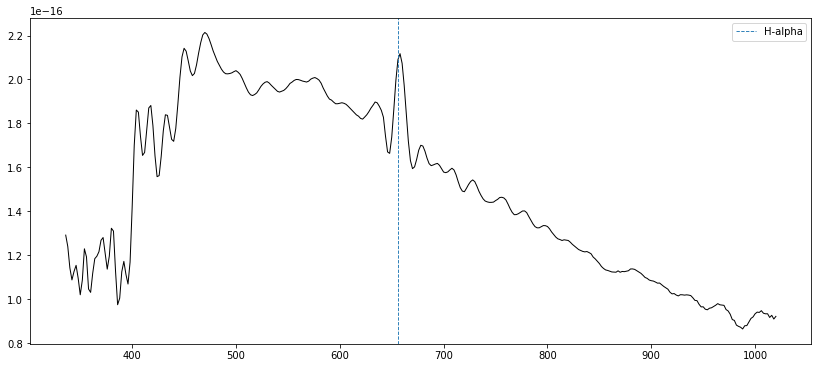

In [45]:
## Example of plot  and data we can get : This candidate is pretty clear 

calibrated_spectra, sampling = calibrate([3004530769758177280])#, sampling=sampling)

plt.figure(figsize=(14,6))
plt.plot(sampling, calibrated_spectra['flux'][0], lw=1, c='k')

#https://classic.sdss.org/dr7/products/spectra/vacwavelength.php
emission_lines_name = ['H-alpha'] #, 'H-beta', 'OIII', 'OIII', 'NII', 'SII','SII']
emiss_wave = [656.46] #, 486.27, 496.02, 500.82, 658.52, 671.82, 673.27]
cmap = plt.get_cmap('tab10', 10)

for i in range(len(emission_lines_name)):
    plt.axvline(emiss_wave[i], label=emission_lines_name[i], color=cmap(i), ls='--', lw=.9)

plt.legend()

In [133]:
## For each target, get H-alpha of neighbours, and compute H-alpha target - median(H-alpha) neighb 
halpha_candi = []
halpha_diff_neigh_candi = []
halpha_neighb_candi = []

for j in range(len(idc_candidates)):
    id_ = idc_candidates[j]
    d_,neighb_ = nbrs_valid_notcol.kneighbors(ft_neighbors_resc_notcol[id_].reshape(1,-1)) #dsits_[k], items_[k]

    d_ = d_[0][1:]
    neighb_ = neighb_[0][1:]    
    converted_spectra, sampling = calibrate(list(df_unwise_merge['source_id'].iloc[neighb_].values))
    
    halpha_neighb = []
    for i in range(len(converted_spectra)):
        halpha_neighb.append(get_halpha(converted_spectra.iloc[i]['flux'], sampling))
        
    halpha_neighb_candi.append(np.array(halpha_neighb))
    medhalpha = np.median(np.array(halpha_neighb))
    
    
    try:
        calibrated_spectra, sampling = calibrate([sourceid_candi[j]])#, sampling=sampling)
        halpha_candi.append(get_halpha(calibrated_spectra.iloc[0]['flux'], sampling))
        halpha_diff_neigh_candi.append(get_halpha(calibrated_spectra.iloc[0]['flux'], sampling) - medhalpha)
    except Exception as e:
        print(e)
        print("something happened...")
        halpha_candi.append(np.nan)
        halpha_diff_neigh_candi.append(np.nan)

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /22 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

### !! Warning : this takes a bit of time (30mn?) to download for the control & neighb 
(1600*31 spectra to get each time, maybe not done in the optimal way)

In [ ]:
## For each target, get H-alpha of neighbours, and compute H-alpha target - median(H-alpha) neighb 
halpha_control = []
halpha_diff_neigh_control = []
halpha_neighb_control = []
#list_control_idx = [] 
counter = 0

for j in range(N_control):
    
    _spectra = True 
    try:
        calibrated_spectra, sampling = calibrate([df_unwise_merge['source_id'].iloc[idc_control[j]]])#, sampling=sampling)
        halpha_control.append(get_halpha(calibrated_spectra.iloc[0]['flux'], sampling))
    except Exception as e:
        print(e)
        print("something happened...")
        #halpha_control.append(np.nan)
        #halpha_diff_neigh_control.append(np.nan)
        halpha_neighb_control.append([])
        halpha_diff_neigh_control.append(np.nan)
        _spectra = False
    
    if _spectra:
        id_ = idc_control[j]
        d_,neighb_ = nbrs_valid_notcol.kneighbors(ft_neighbors_resc_notcol[id_].reshape(1,-1)) #dsits_[k], items_[k]

        d_ = d_[0][1:]
        neighb_ = neighb_[0][1:]
        converted_spectra, sampling = calibrate(list(df_unwise_merge['source_id'].iloc[neighb_].values))

        halpha_neighb = []
        for i in range(len(converted_spectra)):
            halpha_neighb.append(get_halpha(converted_spectra.iloc[i]['flux'], sampling))

        halpha_neighb_control.append(np.array(halpha_neighb))
        medhalpha = np.median(np.array(halpha_neighb))
        halpha_diff_neigh_control.append(halpha_control[counter] - medhalpha)
        counter += 1




                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /22 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...
No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...
No continuous raw data found for the given sources.
something happened...
No continuous raw data found for the given sources.
something happened...


                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /25 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...
No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /24 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /24 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /30 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /25 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...
No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                         0/1 [00:00<?, ?spec/s]

                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /23 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /29 [00:00<?, ?spec/s]

No continuous raw data found for the given sources.
something happened...


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /29 [00:00<?, ?spec/s]

                                                          /27 [00:00<?, ?spec/s]

                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

In [ ]:
## For each target, get H-alpha of neighbours, and compute H-alpha target - median(H-alpha) neighb 
halpha_neigh = []
halpha_diff_neigh_neigh = []
halpha_neighb_neigh = []
#list_neigh_idx = [] 
counter = 0

for j in range(len(idc_neighb)):
    
    _spectra = True 
    try:
        calibrated_spectra, sampling = calibrate([df_unwise_merge['source_id'].iloc[idc_neighb[j]]])#, sampling=sampling)
        halpha_neigh.append(get_halpha(calibrated_spectra.iloc[0]['flux'], sampling))
    except Exception as e:
        print(e)
        print("something happened...")
        #halpha_neigh.append(np.nan)
        halpha_neighb_neigh.append([])
        halpha_diff_neigh_neigh.append(np.nan)
        _spectra = False
    
    if _spectra:
        id_ = idc_neighb[j]
        d_,neighb_ = nbrs_valid_notcol.kneighbors(ft_neighbors_resc_notcol[id_].reshape(1,-1)) #dsits_[k], items_[k]

        d_ = d_[0][1:]
        neighb_ = neighb_[0][1:]
        converted_spectra, sampling = calibrate(list(df_unwise_merge['source_id'].iloc[neighb_].values))

        halpha_neighb = []
        for i in range(len(converted_spectra)):
            halpha_neighb.append(get_halpha(converted_spectra.iloc[i]['flux'], sampling))

        halpha_neighb_neigh.append(np.array(halpha_neighb))
        medhalpha = np.median(np.array(halpha_neighb))
        halpha_diff_neigh_neigh.append(halpha_neigh[counter] - medhalpha)
        counter += 1




In [155]:
# reorder_r_candi = [np.where(r_candi['source_id']==sourceid_candi[i])[0][0] for i in range(len(sourceid_candi))]
# r_candi = r_candi.iloc[reorder_r_candi]

# reorder_r_control = [np.where(r_control['source_id']==sourceid_control[i])[0][0] for i in range(len(sourceid_control))]
# r_control = r_control.iloc[reorder_r_control]

# reorder_r_neigh = [np.where(r_neighb['source_id']==sourceid_neighb[i])[0][0] for i in range(len(sourceid_neighb))]
# r_neighb = r_neighb.iloc[reorder_r_neigh]


In [137]:

halpha_neighb_candi = np.array(halpha_neighb_candi)
medhalpha_neighb = np.array([np.median(halpha_neighb_candi[i]) for i in range(halpha_neighb_candi.shape[0])])
halpha_diff_neigh_candi = np.array(halpha_diff_neigh_candi)
halpha_diff_neigh_candi_norm = halpha_diff_neigh_candi / medhalpha_neighb

halpha_neighb_control = np.array(halpha_neighb_control)
medhalpha_neighb_control = np.array(
    [np.median(halpha_neighb_control[i]) for i in range(halpha_neighb_control.shape[0])])
halpha_diff_neigh_control = np.array(halpha_diff_neigh_control)
halpha_diff_neigh_control_norm = halpha_diff_neigh_control / medhalpha_neighb_control

halpha_neighb_neigh = np.array(halpha_neighb_neigh)
medhalpha_neighb_neigh = np.array(
    [np.median(halpha_neighb_neigh[i]) for i in range(halpha_neighb_neigh.shape[0])])
halpha_diff_neigh_neigh = np.array(halpha_diff_neigh_neigh)
halpha_diff_neigh_neigh_norm = halpha_diff_neigh_neigh / medhalpha_neighb_neigh

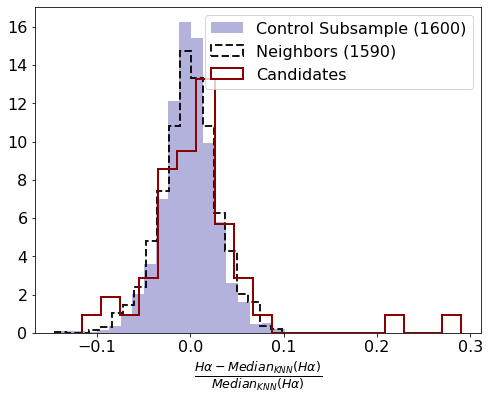

In [138]:
plt.figure(figsize=(8,6))

#ew_espels_halpha : negative if emission

plt.hist(halpha_diff_neigh_control_norm, bins=20, density=True, color='darkblue', alpha=.3, 
        label=f'Control Subsample ({N_control})')
plt.hist(halpha_diff_neigh_neigh_norm, bins=20, density=True, color='k', alpha=.9, histtype='step',
         ls='--', lw=2,
        label=f'Neighbors ({len(sourceid_neighb)})')
plt.hist(halpha_diff_neigh_candi_norm, bins=20, density=True, color='darkred', 
         alpha=1, histtype='step', lw=2,
        # ls='--',
        label=f'Candidates')

plt.xlabel(r"$\frac{H\alpha - Median_{KNN} (H\alpha)}{Median_{KNN} (H\alpha)}$", fontsize=18)
plt.legend()


plt.savefig(folder_figs+'hAlpha_med_neighb_hist.pdf' , bbox_inches="tight", dpi=50)

In [158]:
## Scatter ew vs Halpha median diff

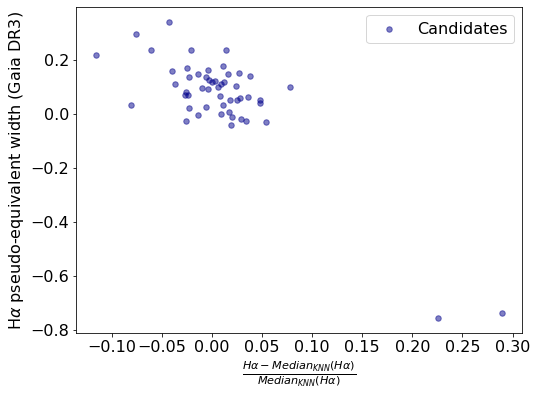

In [149]:
plt.figure(figsize=(8,6))

# plt.scatter(halpha_diff_neigh_control_norm , 
#            r_control['ew_espels_halpha'], c='darkblue', s=2, alpha=.4, 
#         label=f'Control Subsample ({N_control})')

# plt.scatter(halpha_diff_neigh_neigh_norm , 
#            r_neighb['ew_espels_halpha'], c='k', s=2, alpha=.4, 
#          label=f'Neighbors ({len(sourceid_neighb)})')

plt.scatter(halpha_diff_neigh_candi_norm , 
           r_candi['ew_espels_halpha'], c='darkblue', s=30, alpha=.5, 
        label=f'Candidates')
plt.xlabel(r"$\frac{H\alpha - Median_{KNN} (H\alpha)}{Median_{KNN} (H\alpha)}$")
plt.ylabel(r"H$\alpha$ pseudo-equivalent width (Gaia DR3)")
plt.legend()

plt.savefig(folder_figs+'ew_halpha_vs_medKNN.pdf' , bbox_inches="tight", dpi=50)

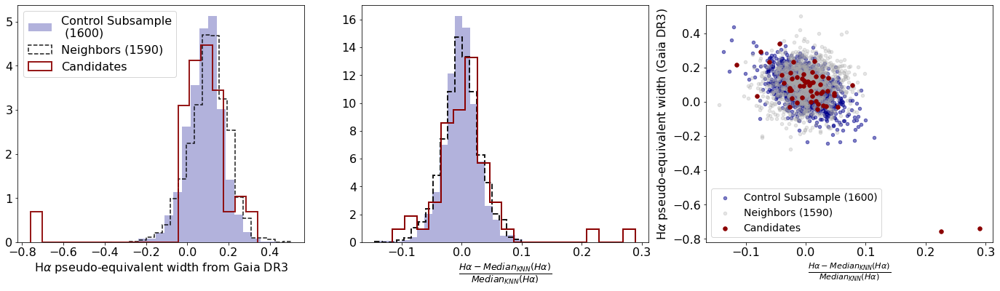

In [150]:
fig, axs = plt.subplots(1,3,figsize=(8*3,6))

ax= axs[0]

axs[0].hist(r_control['ew_espels_halpha'], bins=20, density=True, color='darkblue', alpha=.3, 
        label=f'Control Subsample\n ({N_control})')
axs[0].hist(r_neighb_notcol['ew_espels_halpha'], bins=20, density=True, color='k', alpha=.9, histtype='step',
         ls='--', lw=1.5,
        label=f'Neighbors ({len(sourceid_neighb)})')
axs[0].hist(r_candi['ew_espels_halpha'], bins=20, density=True, color='darkred', alpha=.9, histtype='step', 
            lw=2,
        # ls='--',
        label=f'Candidates')

axs[0].set_xlabel(r"H$\alpha$ pseudo-equivalent width from Gaia DR3")
axs[0].legend()


ax = axs[1]
ax.hist(halpha_diff_neigh_control_norm, bins=20, density=True, color='darkblue', alpha=.3, 
        label=f'Control Subsample ({N_control})')
ax.hist(halpha_diff_neigh_neigh_norm, bins=20, density=True, color='k', alpha=.9, histtype='step',
         ls='--', lw=2,
        label=f'Neighbors ({len(sourceid_neighb)})')
ax.hist(halpha_diff_neigh_candi_norm, bins=20, density=True, color='darkred', 
         alpha=1, histtype='step', lw=2,
        # ls='--',
        label=f'Candidates')

ax.set_xlabel(r"$\frac{H\alpha - Median_{KNN} (H\alpha)}{Median_{KNN} (H\alpha)}$", fontsize=18)
#ax.legend()


ax =  axs[2]

ax.scatter(halpha_diff_neigh_control_norm, r_control['ew_espels_halpha'], s=20, alpha=.5,
          c='darkblue', label=f'Control Subsample ({N_control})', rasterized=True)

ax.scatter(halpha_diff_neigh_neigh_norm, r_neighb_notcol['ew_espels_halpha'], s=20, alpha=.3,
          c='darkgrey',  label=f'Neighbors ({len(sourceid_neighb)})', rasterized=True)

ax.scatter(halpha_diff_neigh_candi_norm , 
           r_candi['ew_espels_halpha'], c='darkred', s=30, alpha=1, 
        label=f'Candidates')
ax.set_xlabel(r"$\frac{H\alpha - Median_{KNN} (H\alpha)}{Median_{KNN} (H\alpha)}$")
ax.set_ylabel(r"H$\alpha$ pseudo-equivalent width (Gaia DR3)")
ax.legend(fontsize=14)

plt.savefig(folder_figs+'halpha_triple.pdf' , bbox_inches="tight", dpi=50)

In [154]:
r_candi['E_halpha_medKNN'] = halpha_diff_neigh_candi_norm


In [279]:
r_control['E_halpha_medKNN'] = halpha_diff_neigh_control_norm


In [275]:

r_candi[['source_id', 'ew_espels_halpha','age_flame', 'E_halpha_medKNN']].iloc[np.argsort(r_candi['ew_espels_halpha'].values)]

,source_id,ew_espels_halpha,age_flame,E_halpha_medKNN
32,3004530769758177280,-0.757454,5.789620,0.225833
25,5260430146906778624,-0.738897,NaN,0.289678
29,6770961795500483200,-0.040844,NaN,0.018755
8,2144442781092733952,-0.031067,1.709155,0.053509
5,6705842630930258816,-0.028618,3.204035,-0.026221
44,6612104218072332160,-0.026518,9.903766,0.033416
23,1673109634053612416,-0.020222,NaN,0.029029
39,2256421065353454464,-0.011576,NaN,0.019926
45,2896314189652820224,-0.005093,3.465372,-0.014479
28,6359523376149191936,-0.000451,11.464608,0.008813


###  age_flame :
Age of the star from FLAME using stellar models, see mass_flame for details (float, Time[Gyr])

Age of the star from FLAME. It is defined as the median value (50th percentile) of the 1D projected distribution from sampling in mass and age, see mass_flame for details.


### age_flame_lower :
Lower confidence level (16%) of age_flame (float, Time[Gyr])

Lower confidence level (16%) of the age of the star from FLAME, see description for age_flame. It is defined as the 16th percentile value of the 1D projected distribution from sampling in mass and age. Upper and lower levels contain the 68% confidence interval.


### age_flame_upper : 
Upper confidence level (84%) of age_flame (float, Time[Gyr])

Upper confidence level (84%) of the age of the star from FLAME, see description for age_flame. It is defined as the 84th percentile value of the 1D projected distribution from sampling in mass and age. Upper and lower levels contain the 68% confidence interval.



### flags_flame : 
Flags indicating quality and processing information from FLAME (string)

This field contains the quality and processing flags from FLAME and takes the form ‘AB’. The first digit refers to the quality of the mass and age determination (A = 0, 1, 2) and the second digit (B) informs the user if the parallax or distance_gspphot was used for deriving all FLAME stellar parameters (lum_flame, radius_flame,…). Concerning the quality of the mass and age (first digit, A), the following is adopted:

A=0 nothing to report

A=1 the star is a giant and the mass and age should be considered with an uncertainty on the order of 20% - 30%

A=2 the mass and age are not available

We note that while the evolstage_flame parameter is related to mass and age, this flag is not applicable to this parameter.

For the second digit, B, the following is adopted:

B=0 parallax is used

B=1 distance_gspphot is used

B=2 parallax is used due to convergence issues with distance_gspphot

See Section 11.3.6 of the online documentation for details.



### evolstage_flame : 
Evolutionary stage of the star from FLAME using stellar models, see mass_flame for details (int)

Evolution stage of the star from FLAME. It is an integer value typically between 100 and 1300 and defined using the median value (50th percentile) of the 1D projected distribution from sampling in mass and age, see mass_flame for details. The value is adapted from the BASTI model grid (Hidalgo et al. 2018) adopting the following convention:

• 100= zero age main sequence (ZAMS)

• 300= first minimum of Teff for massive stars or central hydrogen mass fraction = 0.30 for low-mass stars

• 360= main sequence turn-off

• 420= central hydrogen mass fraction = 0.00

• 490= base of the red giant branch (RGB)

• 860= maximum L along the RGB bump

• 890 = minimum L along the RGB bump

• 1290 = tip of the RGB


In [286]:
ageflames = ['age_flame','age_flame_lower', 'age_flame_upper', 'flags_flame', 'evolstage_flame']
#r_candi[ageflames]

In [95]:
r_candi[r_candi['SOURCE_ID']==3004530769758177280][['mh_gspphot','age_flame', 'age_flame_lower']]

,mh_gspphot,age_flame,age_flame_lower
32,-0.2666,5.78962,4.656469


In [82]:
df_unwise_merge[df_unwise_merge['source_id']==5260430146906778624]['mh_gspphot']

2213120   -1.4844
Name: mh_gspphot, dtype: float64

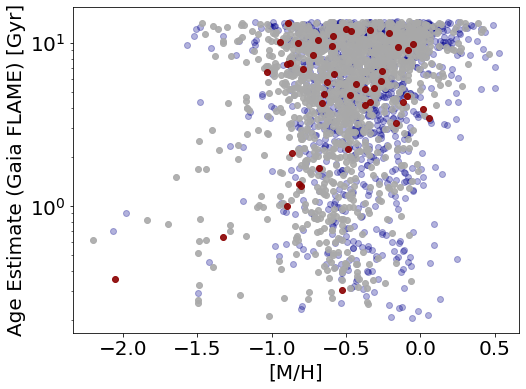

In [67]:
plt.figure(figsize=(8,6))

#ew_espels_halpha : negative if emission

plt.scatter(r_control['mh_gspphot'], 
            r_control['age_flame'],
            c='darkblue', alpha=.3, 
        label=f'Control Subsample ({N_control})')

plt.scatter(r_neighb_notcol['mh_gspphot'],
            r_neighb_notcol['age_flame'],
            c='darkgrey', alpha=.9, 
        label=f'Neighbors ({len(sourceid_neighb_notcol)})')

plt.scatter(r_candi['mh_gspphot'],
            r_candi['age_flame'],
            c='darkred', alpha=.9,
        label=f'Candidates')

plt.xlabel(r"[M/H]")
plt.ylabel("Age Estimate (Gaia FLAME) [Gyr]")
#plt.legend()

plt.yscale('log')
#plt.savefig(folder_figs+'ew_halpha_controlNeighCandi_hist.pdf' , bbox_inches="tight", dpi=50)

In [69]:

def errorbar_hist(x, y, ax, ax_histx, ax_histy, xerr, yerr, 
                  c='k', ew=.3, ms=2, alpha=.5, histtype='bar', label="", ls='-',
                  alpha_hist=.4, col_hist=None):
    # no labels
    if col_hist is None:
        col_hist = c
        
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    ax.errorbar(x, y, 
                xerr=xerr, yerr=yerr, 
                 linestyle='none',
           color=c, elinewidth=ew, markersize=ms, alpha=alpha, marker='o', label=label,
               rasterized=True)
    
    ax_histx.hist(x, bins=20, histtype=histtype, lw=2, ls=ls, density=True, color=col_hist, alpha=alpha_hist)
    ax_histy.hist(y, bins=20, histtype=histtype, lw=2, ls=ls, density=True, color=col_hist,
                  alpha=alpha_hist, orientation='horizontal')


In [89]:
r_control['mh_gspspec']

0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
        ... 
1595     NaN
1596    0.03
1597     NaN
1598     NaN
1599     NaN
Name: mh_gspspec, Length: 1600, dtype: float32

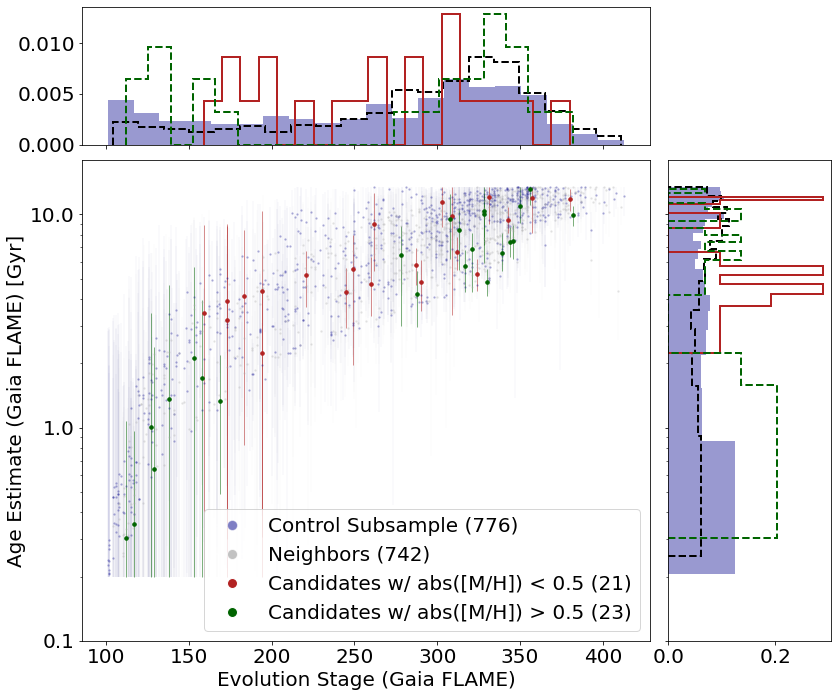

In [92]:
fig = plt.figure(figsize=(13, 11))
gs = fig.add_gridspec(2, 2,  width_ratios=(7, 2), height_ratios=(2, 7),
                      left=0.1, right=0.9, bottom=0.1, top=0.9,
                      wspace=0.05, hspace=0.05)

ax = fig.add_subplot(gs[1, 0])
ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)

legend_elements = []

mask_flame = ~np.isnan(r_control['age_flame'])
mask_flame = mask_flame & (np.abs(r_control['mh_gspphot'])<.5)

errorbar_hist(r_control['evolstage_flame'][mask_flame], 
             r_control['age_flame'][mask_flame],
             ax, ax_histx, ax_histy, xerr=0,
            yerr=[r_control['age_flame'][mask_flame] - r_control['age_flame_lower'][mask_flame].values, 
                  r_control['age_flame_upper'][mask_flame].values - r_control['age_flame'][mask_flame]],
                  c='darkblue', ew=.2, ms=1.5, alpha=.2, histtype='bar',
             #label=f'Control Subsample ({N_control})'
             )

legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Control Subsample ({np.sum(mask_flame)})',
                          markerfacecolor='darkblue', markersize=10, alpha=.5))


mask_flame = ~np.isnan(r_neighb_notcol['age_flame'])
mask_flame = mask_flame & (np.abs(r_neighb_notcol['mh_gspphot'])<.5)

errorbar_hist(r_neighb_notcol['evolstage_flame'][mask_flame], 
              r_neighb_notcol['age_flame'][mask_flame], 
             ax, ax_histx, ax_histy,
             xerr=0,
            yerr=[r_neighb_notcol['age_flame'][mask_flame] - r_neighb_notcol['age_flame_lower'][mask_flame].values, 
                  r_neighb_notcol['age_flame_upper'][mask_flame].values - r_neighb_notcol['age_flame'][mask_flame]],
                  c='darkgrey', ew=.2, ms=1.5, alpha=.2, histtype='step',
              ls='--',
             #label=f'Neighbors ({len(sourceid_neighb)})',
              alpha_hist=1, col_hist='k')
legend_elements.append( Line2D([0], [0], marker='o', color='w', label=f'Neighbors ({(np.sum(mask_flame))})',
                          markerfacecolor='darkgrey', markersize=10, alpha=.7))

mask_flame = ~np.isnan(r_candi['age_flame'])
mask_flame = mask_flame & (np.abs(r_candi['mh_gspphot'])<.5)

errorbar_hist(r_candi['evolstage_flame'][mask_flame], 
              r_candi['age_flame'][mask_flame], 
             ax, ax_histx, ax_histy,
             xerr=0,
            yerr=[r_candi['age_flame'][mask_flame]- r_candi['age_flame_lower'][mask_flame].values, 
                  r_candi['age_flame_upper'][mask_flame].values - r_candi['age_flame'][mask_flame]],
                  c='firebrick', ew=.5, ms=3.5, alpha=1, histtype='step',
             #label='Candidates',
              alpha_hist=1)


legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Candidates w/ abs([M/H]) < 0.5 ({np.sum(mask_flame)})',
                          markerfacecolor='firebrick', markersize=10))

mask_flame = ~np.isnan(r_candi['age_flame'])
mask_flame = mask_flame & (np.abs(r_candi['mh_gspphot'])>=.5)

errorbar_hist(r_candi['evolstage_flame'][mask_flame], 
              r_candi['age_flame'][mask_flame], 
             ax, ax_histx, ax_histy,
             xerr=0,
            yerr=[r_candi['age_flame'][mask_flame]- r_candi['age_flame_lower'][mask_flame].values, 
                  r_candi['age_flame_upper'][mask_flame].values - r_candi['age_flame'][mask_flame]],
                  c='darkgreen', ew=.5, ms=3.5, alpha=1, histtype='step',
             #label='Candidates',
              ls='--',
              alpha_hist=1)



legend_elements.append(Line2D([0], [0], marker='o', color='w', label=f'Candidates w/ abs([M/H]) > 0.5 ({np.sum(mask_flame)})',
                          markerfacecolor='darkgreen', markersize=10))



ax.set_xlabel(r"Evolution Stage (Gaia FLAME)")
ax.set_ylabel(r"Age Estimate (Gaia FLAME) [Gyr]")

ax.legend(handles=legend_elements, loc="lower right") #bbox_to_anchor=(-.1, 1.),
#ax.axhline(0.2, color='k')
ax.set_yscale('log')
ax.set_ylim(0.19, 18)
ax.set_yticks([1e-1, 1, 10] )#np.geomspace(.01, 25 ,3) ) #[0.01, 0.1, 1, 5, 10, 25])
ax.get_yaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

#plt.savefig(folder_figs+'age_flame_only05.pdf' , bbox_inches="tight", dpi=50)

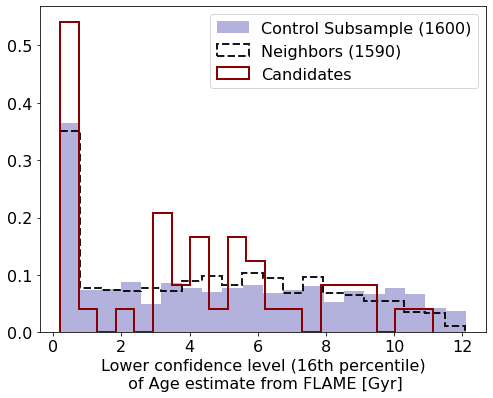

In [264]:
plt.figure(figsize=(8,6))
plt.hist(r_control['age_flame_lower'], bins=20, density=True, color='darkblue', alpha=.3,
        label=f'Control Subsample ({N_control})');
plt.hist(r_neighb_notcol['age_flame_lower'], bins=20, density=True, color='k', ls='--',lw=2, alpha=.9,
         label=f'Neighbors ({len(sourceid_neighb)})',
         histtype='step');
plt.hist(r_candi['age_flame_lower'], bins=20, density=True, color='darkred', lw=2, 
         label='Candidates', histtype='step');
plt.legend()

plt.xlabel("Lower confidence level (16th percentile)\n of Age estimate from FLAME [Gyr]")
#Lower confidence level (16%) of the age of the star from FLAME

plt.savefig(folder_figs+'lowerage_flame.pdf' , bbox_inches="tight", dpi=50)

In [ ]:
## Save the halpha stuff somewhere?

# Variability

Neowise time-series for all the neighbours (30) of each candidates have been previously downloaded and collated in the following dataframe 

In [47]:
df_neow = pd.read_csv('/scratch/gcontard/infrared/neowise_tab_candi_neighb_control_30_01_24.csv')
# Using rad_neo = 0.0002 for get_neowise_timeseries

## Note that the Control Sample here is different, 500 thing...

In [46]:
def get_stetson(tab_neo):
    
    mean_w1 = np.nanmean(tab_neo[f'w1mpro'])
    mean_w2 = np.nanmean(tab_neo[f'w2mpro'])
    n_ = len(tab_neo)
    sq_n = np.sqrt(n_/(n_-1)) if n_> 1 else 1 
    #? not quite right but... Maybe if very few observations raise a flag?
    
    pks =(sq_n * (tab_neo['w1mpro']-mean_w1)/tab_neo['w1sigmpro']) * (sq_n  * (tab_neo['w2mpro']-mean_w2)/tab_neo['w2sigmpro'])
    sqr_pks = np.sign(pks) * np.sqrt(np.abs(pks))
    s_j = np.sum(sqr_pks)/n_
    return s_j


def xredsq_neowise(tab_neo):
    mean_w1 = np.nanmean(tab_neo[f'w1mpro'])
    mean_w2 = np.nanmean(tab_neo[f'w2mpro'])
    n_ = len(tab_neo)
    sumw1 = np.sum( ((tab_neo['w1mpro']-mean_w1)/tab_neo['w1sigmpro'])**2)
    sumw2 = np.sum( ((tab_neo['w2mpro']-mean_w2)/tab_neo['w2sigmpro'])**2)
    return (1/(n_-1))*sumw1, (1/(n_-1))*sumw2

def xredsq(flx, flx_sigm):
    mean = np.nanmean(flx)
    n_ = len(flx)
    sumfl = np.sum( ((flx-mean)/flx_sigm)**2)
    return (1/(n-1))*sumfl


def get_MAD_neo(tab_neo):
    med_w1, med_w2 = np.nanmedian(tab_neo[f'w1mpro']), np.nanmedian(tab_neo[f'w2mpro'])
    
    mad_W1 = np.nanmedian(np.abs(tab_neo[f'w1mpro'] - med_w1))
    mad_W2 = np.nanmedian(np.abs(tab_neo[f'w2mpro'] - med_w2))
    return mad_W1, mad_W2

def get_MAD_flx(flx):
    medfl = np.nanmedian(flx)
    return np.nanmedian(np.abs(flx-medfl))



## Should it be on seasonabl instead of every observation?
def get_seasonal(tab_neo):
    reorder = tab_neo[np.argsort(tab_neo['mjd'].value)]
    aggregate = pd.DataFrame({'mjd':[], 'w1mpro':[], 'w1sigmpro':[],
                             'w2mpro':[], 'w2sigmpro':[]})
    w1_window, w2_window = [], []
    mjd = reorder['mjd'][0]
    j=0
    for i in range(len(reorder)):
        if reorder['mjd'][i] - mjd < 20:
            w1_window.append(reorder['w1mpro'][i])
            w2_window.append(reorder['w2mpro'][i])
        else:
            ## Sigma clipping as in Moor? Or use median instead of mean? 
            aggregate.loc[j,'mjd'] = mjd
            aggregate.loc[j,'w1mpro'] = np.nanmean(w1_window)
            aggregate.loc[j, 'w1sigmpro'] = np.nanstd(w1_window)            
            aggregate.loc[j,'w2mpro'] = np.nanmean(w2_window)
            aggregate.loc[j, 'w2sigmpro'] = np.nanstd(w2_window)
            
            mjd = reorder['mjd'][i]
            j+=1
            w1_window, w2_window = [], []
    return aggregate




In [48]:
stats_neo = []
sourceid_neo = np.unique(df_neow['source_id'])

for i in range(len(sourceid_neo)):
    k = df_neow['source_id'] == sourceid_neo[i]

    if len(df_neow[k])>1:
        s_j = get_stetson(df_neow[k])
        x2w1, x2w2 = xredsq_neowise(df_neow[k])
        s_n = {}
        s_n['stetson'] = s_j
        s_n['source_id'] = sourceid_neo[i]
        s_n['x2_W1'] = x2w1
        s_n['x2_W2'] = x2w2
        stats_neo.append(s_n)
    else:
        print(f"Some isse with {sourceid_neo[i]}")
        s_n = {}
        s_n['stetson'] = np.nan
        s_n['source_id'] = sourceid_neo[i]
        s_n['x2_W1'] = np.nan
        s_n['x2_W2'] = np.nan
        stats_neo.append(s_n)

Some isse with 4875543318465125888
Some isse with 5601740099739589760


In [49]:
stats_neodf = pd.DataFrame.from_dict(stats_neo)
stats_neodf

,stetson,source_id,x2_W1,x2_W2
0,-0.040568,1543649901520384,1.585159,1.100309
1,0.256766,1571446929877632,3.475403,1.980318
2,0.341258,2485450330197504,4.240291,1.790342
3,0.319777,29026802031447040,3.583768,1.779017
4,0.009814,65884596460482048,1.594058,1.209981
...,...,...,...,...
2136,0.202730,6908213694548972160,1.789269,1.489417
2137,0.081028,6909983976989419008,1.533601,1.194071
2138,0.168889,6911903960513155200,2.309770,1.785812
2139,0.411674,6914093672279581696,4.959863,2.294085


In [51]:
## Here neighbours are computed on color space
sourceid_neighb, idc_neighb  = [], []

for id_ in idc_candidates:
    d_,neighb_ = nbrs_valid.kneighbors(ft_neighbors_resc[id_].reshape(1,-1)) 
    d_ = d_[0][1:]
    neighb_ = neighb_[0][1:]
    for i in neighb_:
        sourceid_neighb.append(df_unwise_merge['source_id'].iloc[i])
        idc_neighb.append(i)

In [52]:
stats_neodf['candidates'] = False
stats_neodf['control'] = False
stats_neodf['neighbours'] = False

for i in range(len(sourceid_candi)):
    stats_neodf.loc[np.where(stats_neodf['source_id']==sourceid_candi[i])[0][0], 'candidates']=True
    
for i in range(len(sourceid_neighb)):
    stats_neodf.loc[np.where(stats_neodf['source_id']==sourceid_neighb[i])[0], 'neighbours']=True

## Control are not the same control samples as before...

# for i in range(len(sourceid_control)):
#     stats_neodf.loc[np.where(stats_neodf['source_id']==sourceid_control[i])[0], 'control']=True

stats_neodf['control'] = (~stats_neodf['neighbours']) & (~stats_neodf['candidates'])

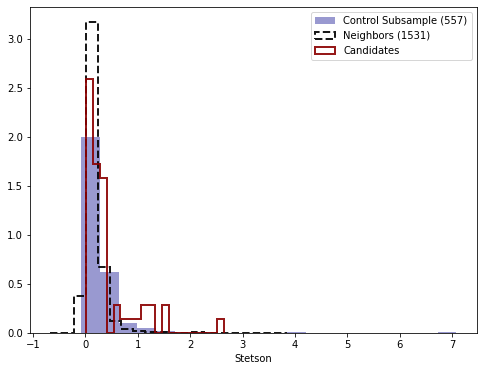

In [55]:
plt.figure(figsize=(8,6))

sm_control = np.sum(stats_neodf['control']==True)

plt.hist(stats_neodf[stats_neodf['control']==True]['stetson'],
         bins=20, density=True, color='darkblue', alpha=.4, 
        label=f'Control Subsample ({sm_control})')


sm_neigh = np.sum(stats_neodf['neighbours']==True)
plt.hist(stats_neodf[stats_neodf['neighbours']==True]['stetson'], 
         bins=20, color='k', alpha=.9, histtype='step', density=True,
         ls='--', lw=2,
        label=f'Neighbors ({sm_neigh})')

plt.hist(stats_neodf[stats_neodf['candidates']==True]['stetson'], bins=20, 
         density=True, color='darkred', alpha=.9, histtype='step', lw=2,
        # ls='--',
        label=f'Candidates')

#plt.xlim(-1,4.5)
plt.xlabel("Stetson")
plt.legend()

plt.savefig(folder_figs+'stetson_var.pdf' , bbox_inches="tight", dpi=50)

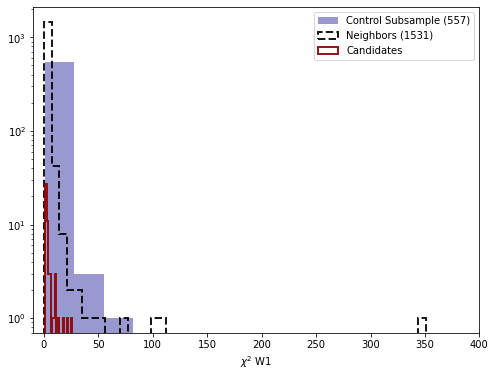

In [56]:
plt.figure(figsize=(8,6))

sm_control = np.sum(stats_neodf['control']==True)

plt.hist(stats_neodf[stats_neodf['control']==True]['x2_W1'],
         bins=50, #density=True, 
         color='darkblue', alpha=.4, 
        label=f'Control Subsample ({sm_control})')


sm_neigh = np.sum(stats_neodf['neighbours']==True)
plt.hist(stats_neodf[stats_neodf['neighbours']==True]['x2_W1'], 
         bins=50, color='k', alpha=.9, histtype='step',# density=True,
         ls='--', lw=2,
        label=f'Neighbors ({sm_neigh})')

plt.hist(stats_neodf[stats_neodf['candidates']==True]['x2_W1'], bins=20, #density=True, 
         color='darkred', alpha=.9, histtype='step', lw=2,
        # ls='--',
        label=f'Candidates')
plt.yscale('log')
plt.xlim(-10,400)
plt.xlabel(r"$\chi^2$ W1" )
plt.legend()

plt.savefig(folder_figs+'chi2_w1_var.pdf' , bbox_inches="tight", dpi=50)

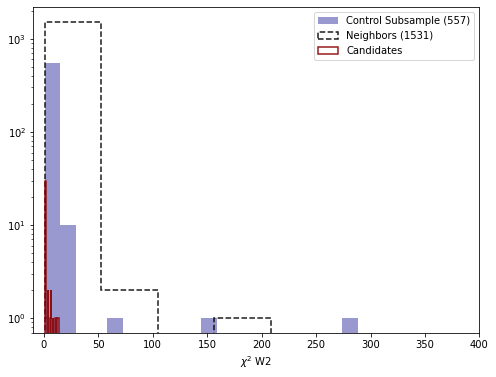

In [57]:
plt.figure(figsize=(8,6))

sm_control = np.sum(stats_neodf['control']==True)

plt.hist(stats_neodf[stats_neodf['control']==True]['x2_W2'],
         bins=20, #density=True, 
         color='darkblue', alpha=.4, 
        label=f'Control Subsample ({sm_control})')


sm_neigh = np.sum(stats_neodf['neighbours']==True)
plt.hist(stats_neodf[stats_neodf['neighbours']==True]['x2_W2'], 
         bins=50, color='k', alpha=.9, histtype='step',# density=True,
         ls='--', lw=1.5,
        label=f'Neighbors ({sm_neigh})')

plt.hist(stats_neodf[stats_neodf['candidates']==True]['x2_W2'], bins=20, #density=True, 
         color='darkred', alpha=.9, histtype='step', lw=1.5,
        # ls='--',
        label=f'Candidates')
plt.yscale('log')
plt.xlim(-10,400)
plt.xlabel(r"$\chi^2$ W2" )
plt.legend()

plt.savefig(folder_figs+'chi2_w2_var.pdf' , bbox_inches="tight", dpi=50)

### Check for each candidate wrt their "neighbours" and the control sample

In [58]:
dic_sourceid_neigh = {}

for i in range(len(idc_candidates)):
    
    d_,neighb_ = nbrs_valid.kneighbors(ft_neighbors_resc[idc_candidates[i]].reshape(1,-1)) 
    d_ = d_[0][1:]
    neighb_ = neighb_[0][1:]
    dic_sourceid_neigh[sourceid_candi[i]] = df_unwise_merge['source_id'].iloc[neighb_].values

Text(0.5, 0, 'Stetson')

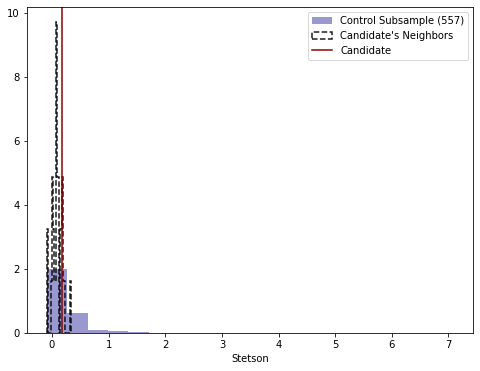

In [59]:

id_ = 0
plt.figure(figsize=(8,6))

ft_plot = 'stetson'#'x2_W1'
ft_label = "Stetson"#r"$\chi^2$ W1"

plt.hist(stats_neodf[stats_neodf['control']==True][ft_plot],
         bins=20, density=True, 
         color='darkblue', alpha=.4, 
        label=f'Control Subsample ({sm_control})')

plt.hist(stats_neodf[np.isin(stats_neodf['source_id'], dic_sourceid_neigh[sourceid_candi[id_]])][ft_plot],
         bins=20, color='k', alpha=.9, histtype='step', density=True,
         ls='--', lw=1.5,
        label=f'Candidate\'s Neighbors')

plt.axvline(stats_neodf[stats_neodf['source_id']==sourceid_candi[id_]][ft_plot].values, 
           color='darkred', lw=1.5, label='Candidate')

plt.legend()
plt.xlabel(ft_label)

In [60]:
## Get Percentile of Candidate wrt their Neighbors, and wrt the Control Sample

ft_ = 'stetson' #'x2_W1'
ft_label = "Stetson" # r"$\chi^2$ W1"
percentile_inneigh = []
percentile_incontrol = scipy.stats.percentileofscore(
                        np.abs(stats_neodf[stats_neodf['control']][ft_].values),
                        np.abs(stats_neodf[stats_neodf['candidates']][ft_].values),
                        nan_policy='omit')

for i in range(len(sourceid_candi)):
    perc_ = scipy.stats.percentileofscore( 
                        np.abs(stats_neodf[np.isin(stats_neodf['source_id'], 
                                                dic_sourceid_neigh[sourceid_candi[id_]])][ft_].values), 
                        np.abs(stats_neodf[stats_neodf['source_id']==sourceid_candi[i]][ft_].values[0]),
                                         nan_policy='omit')
    percentile_inneigh.append(perc_)
percentile_inneigh = np.array(percentile_inneigh)



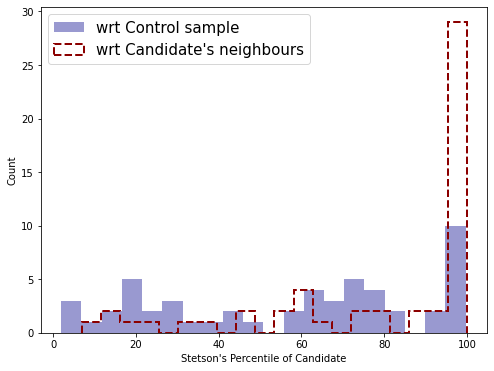

In [61]:

plt.figure(figsize=(8,6))

plt.hist(percentile_incontrol, bins=20,# density=True,
         #histtype='step',
         #histtype='stepfilled', ec='darkred',
         color='darkblue', alpha=.4, lw=1.5,
         label='wrt Control sample')


plt.hist(percentile_inneigh, bins=20, #density=True,
         color='darkred', ls='--', 
         histtype='step', lw=2,
         label='wrt Candidate\'s neighbours')

plt.legend(fontsize=15)
plt.xlabel(f"{ft_label}'s Percentile of Candidate")
plt.ylabel("Count")

plt.savefig(folder_figs+'percentile_stetson_hist.pdf' , bbox_inches="tight", dpi=50)

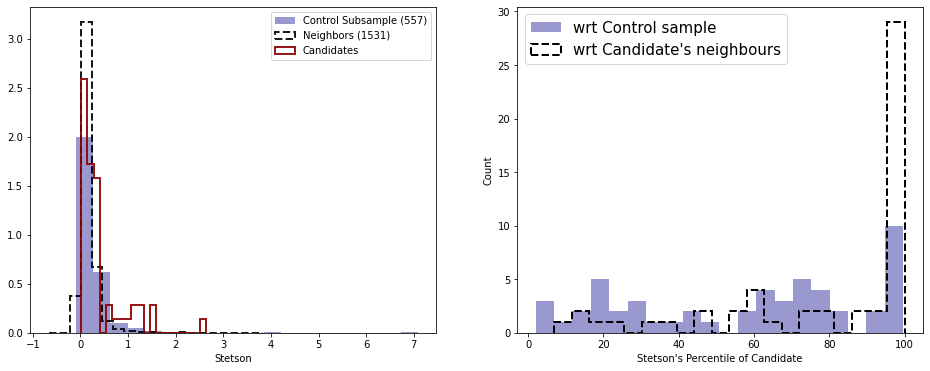

In [62]:
fig,axs = plt.subplots(1,2,figsize=(8*2,6))

sm_control = np.sum(stats_neodf['control']==True)

ax = axs[0]
ax.hist(stats_neodf[stats_neodf['control']==True]['stetson'],
         bins=20, density=True, color='darkblue', alpha=.4, 
        label=f'Control Subsample ({sm_control})')


sm_neigh = np.sum(stats_neodf['neighbours']==True)
ax.hist(stats_neodf[stats_neodf['neighbours']==True]['stetson'], 
         bins=20, color='k', alpha=.9, histtype='step', density=True,
         ls='--', lw=2,
        label=f'Neighbors ({sm_neigh})')

ax.hist(stats_neodf[stats_neodf['candidates']==True]['stetson'], bins=20, 
         density=True, color='darkred', alpha=.9, histtype='step', lw=2,
        # ls='--',
        label=f'Candidates')

#plt.xlim(-1,4.5)
ax.set_xlabel(r"Stetson Index $S_J$")
ax.legend()

ax = axs[1]

ax.hist(percentile_incontrol, bins=20,# density=True,
         #histtype='step',
         #histtype='stepfilled', ec='darkred',
         color='darkblue', alpha=.4, lw=1.5,
         label='wrt Control sample')


ax.hist(percentile_inneigh, bins=20, #density=True,
         color='k', ls='--', 
         histtype='step', lw=2,
         label='wrt Candidate\'s neighbours')

ax.legend(fontsize=15)
ax.set_xlabel(f"Percentile Score of $S_J$")
ax.set_ylabel("Count")

plt.savefig(folder_figs+'stetson_triple.pdf' , bbox_inches="tight", dpi=50)

In [63]:
#df_unwise_merge['']

In [64]:
stats_neodf_candi = stats_neodf[stats_neodf['candidates']]
stats_neodf_candi

,stetson,source_id,x2_W1,x2_W2,candidates,control,neighbours
30,0.161188,302802517288053632,2.151839,1.368189,True,False,False
56,0.227512,344897216879901312,3.065791,1.606597,True,False,False
61,0.285032,352632796577124992,3.540557,1.746421,True,False,False
85,0.304781,387557473467906432,2.999003,1.654388,True,False,False
122,0.216073,619195165798222208,3.065422,2.102441,True,False,False
174,0.024292,709086185604311552,1.559155,1.139706,True,False,False
241,0.315071,907249585730646016,2.089523,1.831920,True,False,False
300,0.028470,1052596673505827840,1.539139,1.254572,True,False,False
344,0.209763,1245496161713883904,1.672763,1.346165,True,False,False
403,0.084877,1406113335695903872,1.876792,1.347362,True,False,False


In [303]:
df_varcandi = df_unwise_merge[['source_id','var_flag', 'phot_variable_flag']].iloc[idc_candidates]
df_varcandi = df_varcandi.join(stats_neodf_candi.set_index('source_id'), 
                               on='source_id', lsuffix='unw').reset_index(drop=True)
df_varcandi = df_varcandi.iloc[np.argsort(df_varcandi['stetson'].values)]
df_varcandi

,source_id,var_flag,phot_variable_flag,stetson,x2_W1,x2_W2,candidates,control,neighbours
18,4420716452299884288,00nn,NOT_AVAILABLE,0.012296,1.878933,1.116435,True,False,False
26,709086185604311552,11nn,NOT_AVAILABLE,0.024292,1.559155,1.139706,True,False,False
37,1052596673505827840,00nn,NOT_AVAILABLE,0.028470,1.539139,1.254572,True,False,False
48,6492528514620768896,00nn,NOT_AVAILABLE,0.052061,2.083047,1.542602,True,False,False
51,6376307386787122560,10nn,NOT_AVAILABLE,0.061504,1.570979,1.359258,True,False,False
30,6405864801961715968,00nn,NOT_AVAILABLE,0.076633,1.711145,1.184732,True,False,False
7,3889059420143391744,11nn,NOT_AVAILABLE,0.080558,1.686343,1.473049,True,False,False
19,6830573291565067648,00nn,NOT_AVAILABLE,0.084108,1.655812,1.245856,True,False,False
9,1406113335695903872,11nn,NOT_AVAILABLE,0.084877,1.876792,1.347362,True,False,False
11,1704765570250298496,00nn,NOT_AVAILABLE,0.090239,1.636398,1.425003,True,False,False


In [66]:

    
    
def plot_neowise_tsmag(df_, source_id, ax):
    m_ = df_['source_id']==source_id
    
#     ax.scatter(df_['mjd'][m_], df_['w1mpro'][m_], s=1, alpha=.8, color='darkblue',
#               label='W1')
    
#     ax.scatter(df_['mjd'][m_], df_['w2mpro'][m_], s=1, alpha=.8, color='firebrick',
#               label='W2')
    
    ax[0].errorbar(df_['mjd'][m_], df_['w1mpro'][m_],
                xerr=0, yerr=df_['w1sigmpro'][m_], linestyle='none',
                marker='o', ms=4, lw=1, alpha=.5, color='darkblue',
              label='W1')
    
    ax[1].errorbar(df_['mjd'][m_], df_['w2mpro'][m_],
                xerr=0, yerr=df_['w2sigmpro'][m_], linestyle='none',
               marker='o', ms=4, lw=1, alpha=.5, color='firebrick',
              label='W2')
    
    ax[1].set_xlabel("MJD")
    ax[0].set_ylabel("Magnitude")
    ax[1].set_ylabel("Magnitude")
    ax[0].invert_yaxis()
    #ax[1].invert_yaxis()
    ax[0].legend()
    ax[1].legend()
    
    
def plot_neowise_tsflux(df_, source_id, ax):
    m_ = df_['source_id']==source_id
    
#     ax.scatter(df_['mjd'][m_], df_['w1flux'], s=1, alpha=.8, color='darkblue',
#               label='W1')
    
#     ax.scatter(df_['mjd'][m_], df_['w2flux'], s=1, alpha=.8, color='firebrick',
#               label='W2')
    ax[0].errorbar(df_['mjd'][m_], df_['w1flux'][m_],
                xerr=0, yerr=df_['w1sigflux'][m_],
                linestyle='none',
                marker='o',  ms=4, lw=1, alpha=.5,  color='darkblue',
              label='W1')
    
    ax[1].errorbar(df_['mjd'][m_], df_['w2flux'][m_],
                xerr=0, yerr=df_['w2sigflux'][m_],
                linestyle='none',
                marker='o',  ms=4, lw=1, alpha=.5,  color='firebrick',
              label='W2')
    
    ax[1].set_xlabel("MJD")
    ax[0].set_ylabel("Flux")
    ax[1].set_ylabel("Flux")

    ax[0].legend()
    ax[1].legend()

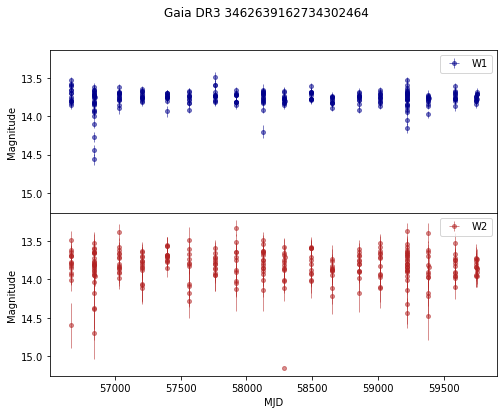

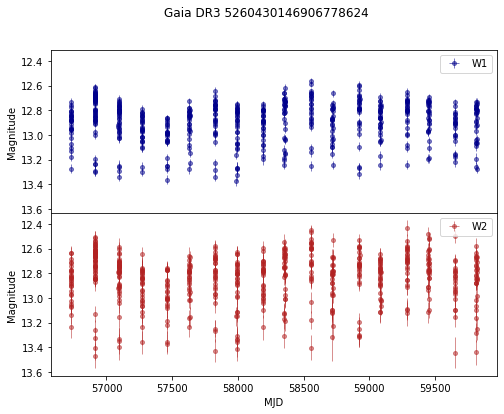

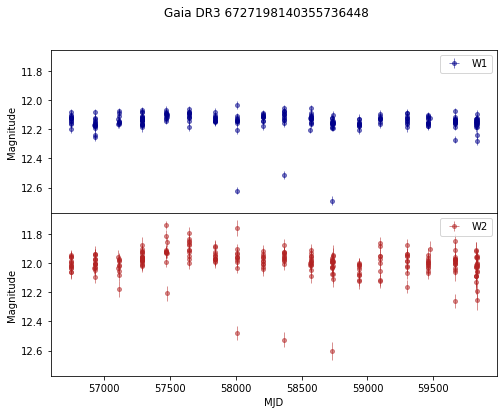

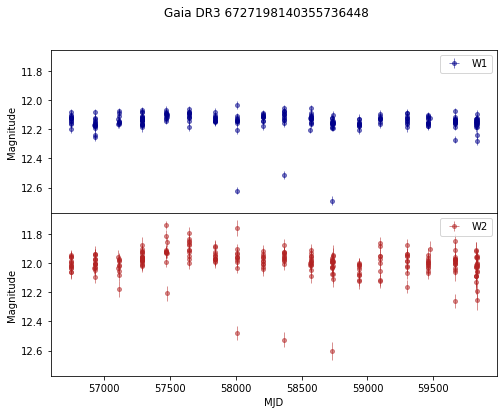

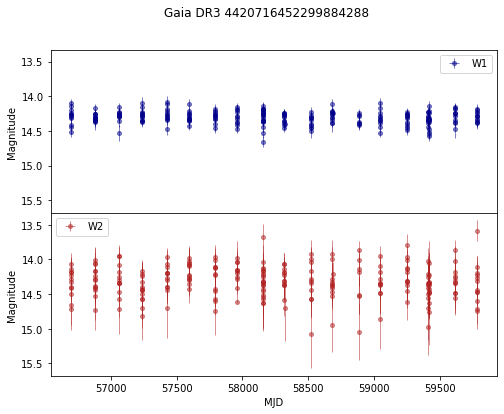

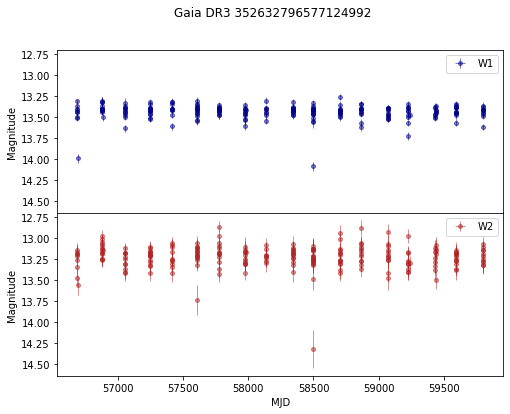

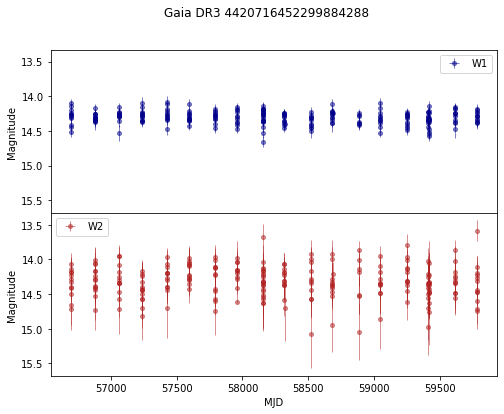

In [67]:
id_ = 1
fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid_candi[id_], ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid_candi[id_]}")
plt.show()


## Plot time series with high percentile / high stetson or X2 

sourceid = stats_neodf[stats_neodf['candidates']]['source_id'].iloc[np.argsort(
                        stats_neodf[stats_neodf['candidates']]['stetson'].values)[-1]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")

plt.savefig(folder_figs+f'high_stets_neow_var_{sourceid}.pdf' , bbox_inches="tight", dpi=50)
plt.show()

## percentile_incontrol
sourceid = sourceid_candi[np.argsort(percentile_incontrol)[-1]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")
plt.show()

## percentile_inneih
sourceid = sourceid_candi[np.argsort(percentile_incontrol)[-1]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")

plt.savefig(folder_figs+f'high_perccontrol_stets_neow_var_{sourceid}.pdf' , bbox_inches="tight", dpi=50)
plt.show()


## And low


sourceid = stats_neodf[stats_neodf['candidates']]['source_id'].iloc[np.argsort(
                        stats_neodf[stats_neodf['candidates']]['stetson'].values)[0]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")

plt.savefig(folder_figs+f'low_stets_neow_var_{sourceid}.pdf' , bbox_inches="tight", dpi=50)
plt.show()

## percentile_incontrol
sourceid = sourceid_candi[np.argsort(percentile_incontrol)[0]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")

plt.show()

## percentile_inneih
sourceid = sourceid_candi[np.argsort(percentile_inneigh)[0]]

fig,ax = plt.subplots(2,1,figsize=(8,6),sharex=True, sharey=True)

plot_neowise_tsmag(df_neow, sourceid, ax)
fig.subplots_adjust(hspace=0)
plt.suptitle(f"Gaia DR3 {sourceid}")

plt.savefig(folder_figs+f'lowprec_neow_var_{sourceid}.pdf' , bbox_inches="tight", dpi=50)
plt.show()


## TESS

In [68]:
##
search_results = []
for id_ in range(len(idc_candidates)):

    ra = df_unwise_merge['ra_2'].iloc[id_]
    dec = df_unwise_merge['dec_2'].iloc[id_]

    coord = SkyCoord(ra=ra*u.degree, dec=dec*u.degree, frame='icrs')
    search_result = lk.search_lightcurve(coord)  #, author='SPOC')
    
    search_results.append(search_result)
    print(f"Processing candi {id_}")
    
    if len(search_result) > 0:
        print(search_result)

        
    else:
        print("There was no search results?")
        
    print("==="*5)

No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (311.2870834, -11.0620695)>".


Processing candi 0
There was no search results?
Processing candi 1
SearchResult containing 8 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 05 2018               QLP    1800    32499496      0.0
  1 TESS Sector 06 2018               QLP    1800    32499496      0.0
  2 TESS Sector 32 2020               QLP     600    32499496      0.0
  3 TESS Sector 33 2020               QLP     600    32499496      0.0
  4 TESS Sector 05 2018 GSFC-ELEANOR-LITE    1800    32499496      0.0
  5 TESS Sector 06 2018 GSFC-ELEANOR-LITE    1800    32499496      0.0
  6 TESS Sector 05 2018              TGLC    1800    32499496      0.0
  7 TESS Sector 06 2018              TGLC    1800    32499496      0.0


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (163.6649372, 67.4717054)>".


Processing candi 2
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (316.0386402, 24.5232824)>".


Processing candi 3
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (236.6667844, 49.3933495)>".


Processing candi 4
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (308.5919081, -23.1725168)>".


Processing candi 5
There was no search results?
Processing candi 6
SearchResult containing 3 data products.

 #     mission     year author exptime target_name distance
                                  s                 arcsec 
--- -------------- ---- ------ ------- ----------- --------
  0 TESS Sector 13 2019    QLP    1800   101276786      0.0
  1 TESS Sector 27 2020    QLP     600   101276786      0.0
  2 TESS Sector 67 2023    QLP     200   101276786      0.0
Processing candi 7
SearchResult containing 1 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 09 2019 GSFC-ELEANOR-LITE    1800    47378886      0.0
Processing candi 8
SearchResult containing 6 data products.

 #     mission     year       author      exptime target_name distance
                                             s        

No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (210.2115848, 41.423301)>".


Processing candi 13
There was no search results?
Processing candi 14
SearchResult containing 9 data products.

 #     mission     year   author  exptime target_name distance
                                     s                 arcsec 
--- -------------- ---- --------- ------- ----------- --------
  0 TESS Sector 20 2019 TESS-SPOC    1800    43105058      0.0
  1 TESS Sector 44 2021 TESS-SPOC     600    43105058      0.0
  2 TESS Sector 46 2021 TESS-SPOC     600    43105058      0.0
  3 TESS Sector 47 2021 TESS-SPOC     600    43105058      0.0
  4 TESS Sector 20 2019       QLP    1800    43105058      0.0
  5 TESS Sector 44 2021       QLP     600    43105058      0.0
  6 TESS Sector 46 2021       QLP     600    43105058      0.0
  7 TESS Sector 47 2021       QLP     600    43105058      0.0
  8 TESS Sector 60 2022       QLP     200    43105058      0.0
Processing candi 15
SearchResult containing 2 data products.

 #     mission     year       author      exptime target_name distance


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (283.4198543, -44.8916446)>".


Processing candi 22
There was no search results?
Processing candi 23
SearchResult containing 2 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 07 2019 GSFC-ELEANOR-LITE    1800    36336860      0.0
  1 TESS Sector 07 2019              TGLC    1800    36336860      0.0
Processing candi 24
SearchResult containing 1 data products.

 #     mission     year author exptime target_name distance
                                  s                 arcsec 
--- -------------- ---- ------ ------- ----------- --------
  0 TESS Sector 56 2022    QLP     200    88577928      0.0


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (292.6087423, 32.4878275)>".


Processing candi 25
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (310.3538508, -51.5335086)>".


Processing candi 26
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (196.1799153, -3.8788172)>".


Processing candi 27
There was no search results?
Processing candi 28
SearchResult containing 5 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 06 2018 GSFC-ELEANOR-LITE    1800   344023330      0.0
  1 TESS Sector 06 2018              TGLC    1800   344023330      0.0
  2 TESS Sector 07 2019 GSFC-ELEANOR-LITE    1800   344023330      0.0
  3 TESS Sector 08 2019 GSFC-ELEANOR-LITE    1800   344023330      0.0
  4 TESS Sector 07 2019              TGLC    1800   344023330      0.0


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (336.6853216, -3.7281244)>".


Processing candi 29
There was no search results?


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (234.9403167, -13.9619029)>".


Processing candi 30
There was no search results?
Processing candi 31
SearchResult containing 1 data products.

 #     mission     year author exptime target_name distance
                                  s                 arcsec 
--- -------------- ---- ------ ------- ----------- --------
  0 TESS Sector 55 2022    QLP     600   374582459      0.0


No data found for target "<SkyCoord (ICRS): (ra, dec) in deg
    (116.8208338, 54.4345897)>".


Processing candi 32
There was no search results?
Processing candi 33
SearchResult containing 1 data products.

 #     mission     year       author      exptime target_name distance
                                             s                 arcsec 
--- -------------- ---- ----------------- ------- ----------- --------
  0 TESS Sector 08 2019 GSFC-ELEANOR-LITE    1800    62630338      0.0


KeyboardInterrupt: 

In [ ]:
print(f"Number of candidates with at least one lightcurve:\
      {np.sum(np.array([len(s)>0 for s in search_results]))}")

### For each candidates with at least a search_result:

* Plot the light-curves available per authors

* Compute lombscargle and max-period 

* Compute something else?

In [ ]:
#'GSFC-ELEANOR-LITE', 'QLP', 'TASOC', 'TESS-SPOC', 'TGLC'

In [69]:
def plot_lk(lc, ax, clip_outliers=True):
    ax.scatter(lc['time'].value[lc['quality']==0], lc['flux'].value[lc['quality']==0], s=1, c='k')    
    if lc.time.format == "bkjd":
        xlabel = "Time - 2454833 [BKJD days]"
    elif lc.time.format == "btjd":
        xlabel = "Time - 2457000 [BTJD days]"
    elif lc.time.format == "jd":
        xlabel = "Time [JD]"
    else:
        xlabel = "Time"
    ax.set_xlabel(xlabel)
    ax.set_ylabel("Flux")
    
    if clip_outliers and len(lc.flux) > 0:
        ymin, ymax = np.percentile(lc.flux.value, [1.5, 98.5])
        margin = 0.05 * (ymax - ymin)
        ax.set_ylim(ymin - margin, ymax + margin)

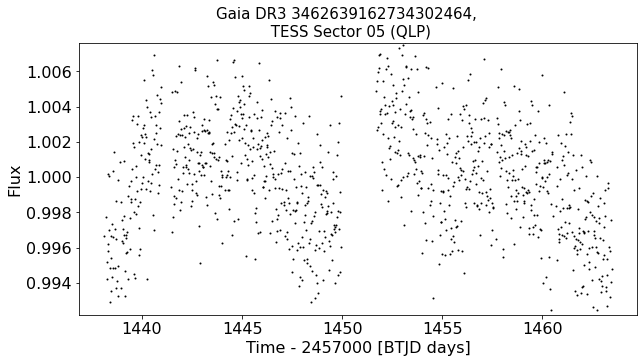

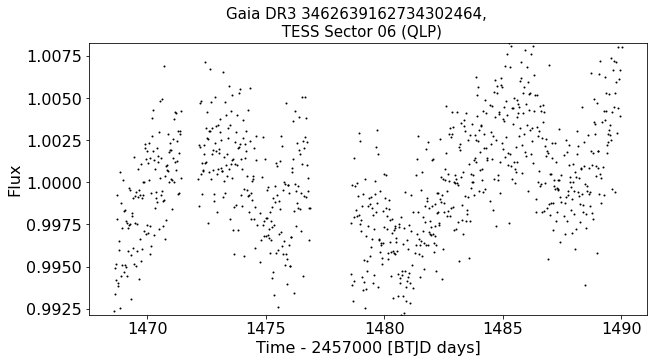

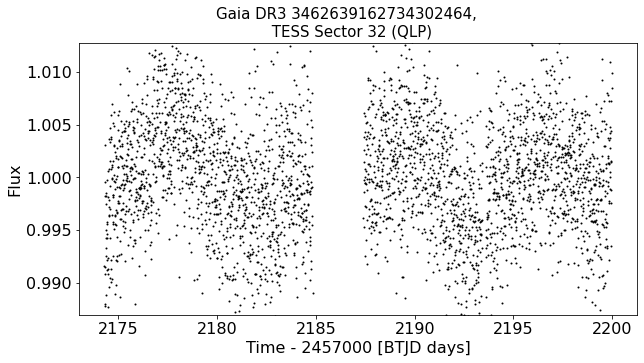

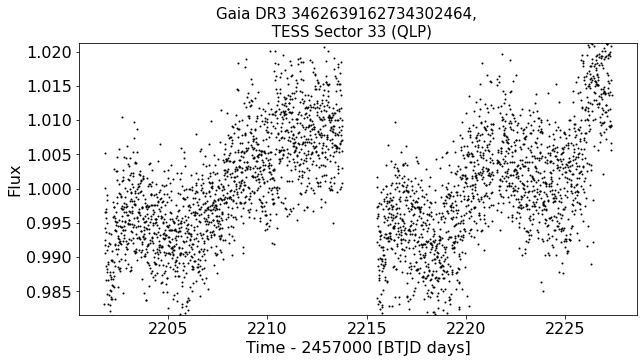

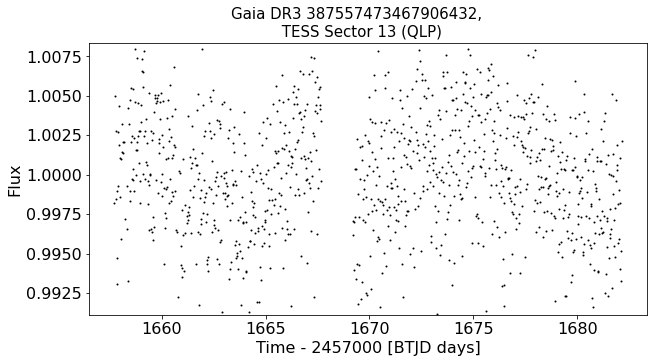

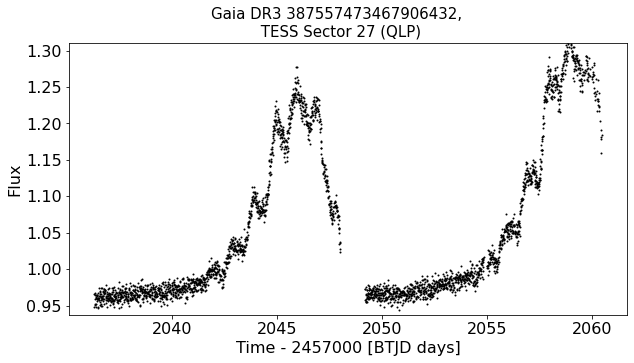

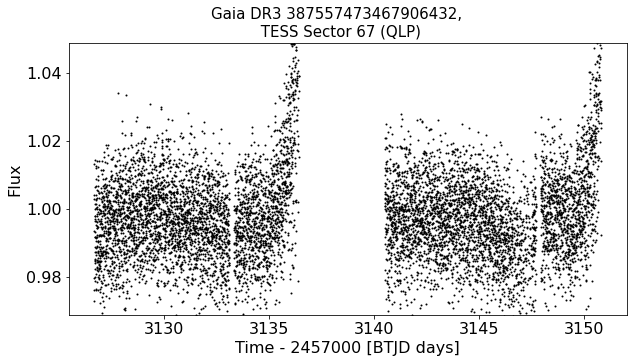

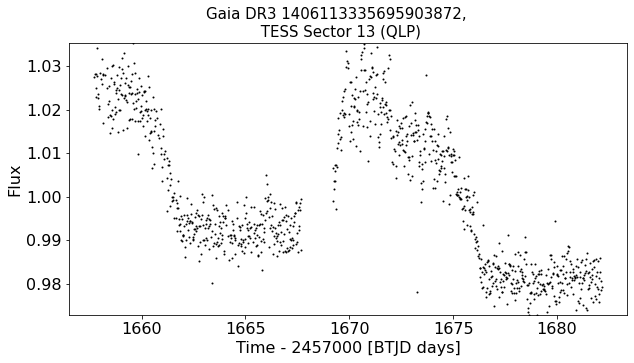

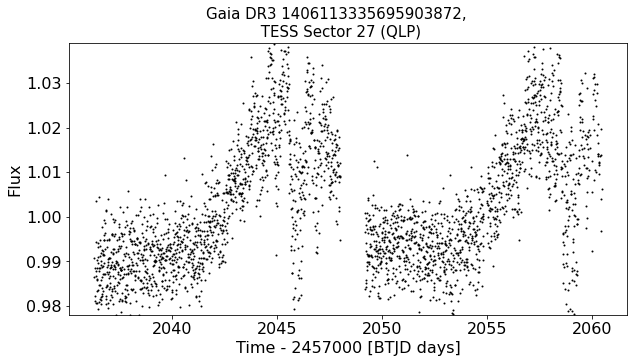

/u/g/gcontard/miniconda3/envs/numbatest/lib/python3.9/site-packages/lightkurve/lightcurve.py:1131: LightkurveWarning: The light curve appears to be zero-centered (median=1.00e+00 +/- 4.63e+01); `normalize()` will divide the light curve by a value close to zero, which is probably not what you want.
  warnings.warn(


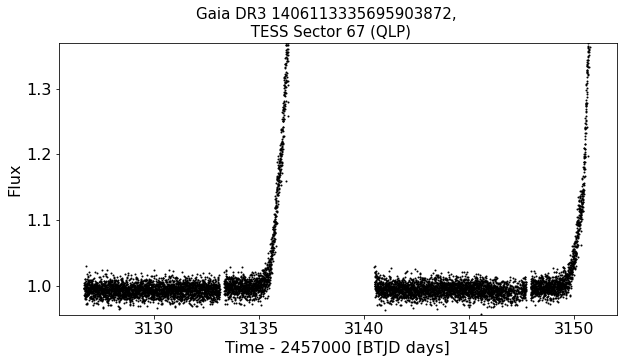

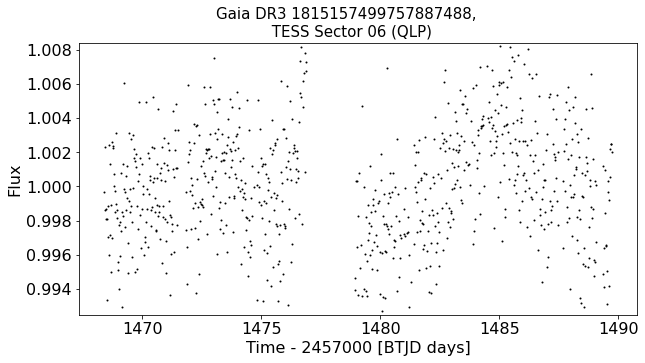

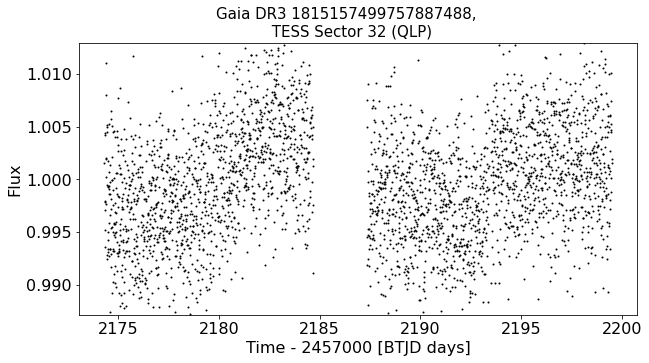

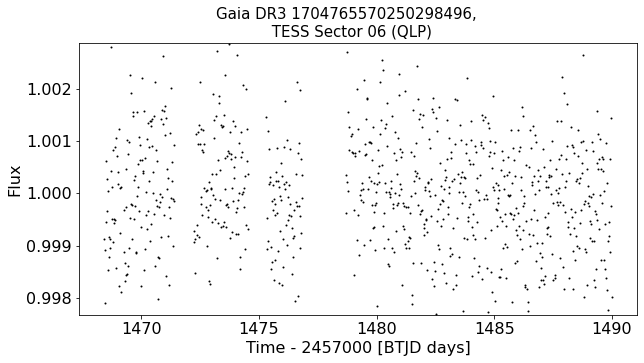

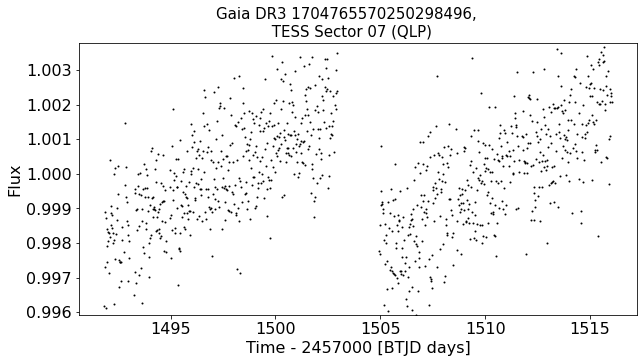

...

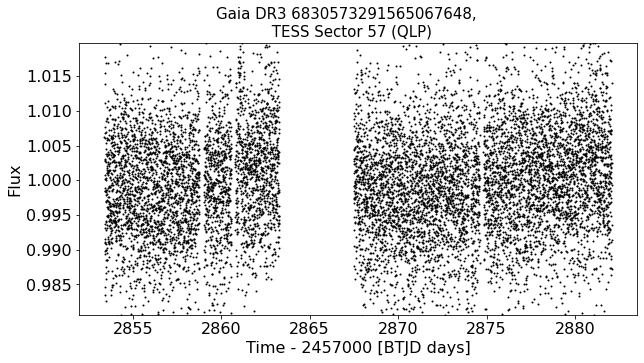

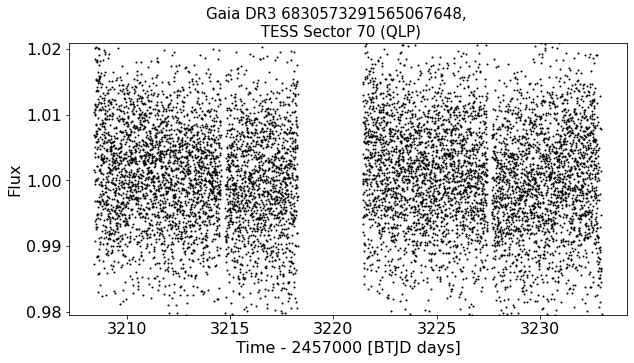

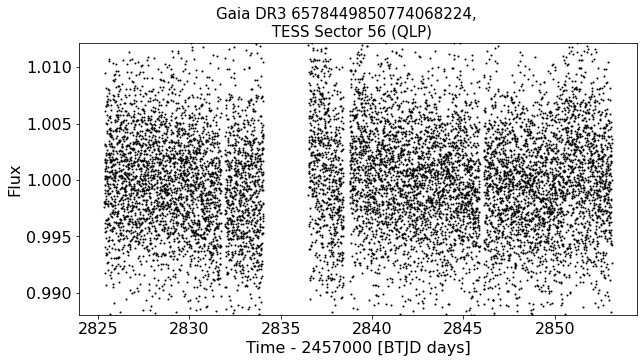

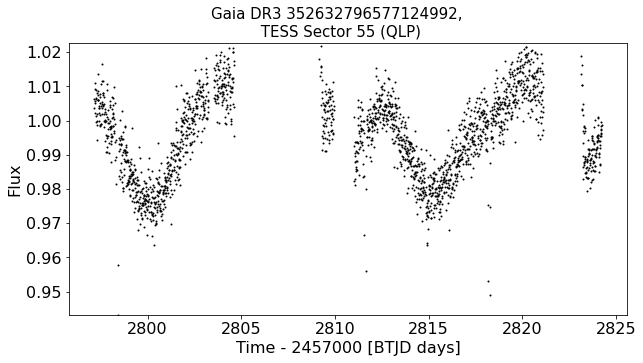

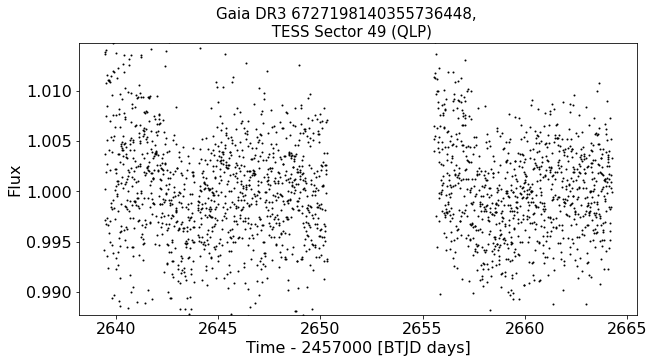

/u/g/gcontard/miniconda3/envs/numbatest/lib/python3.9/site-packages/lightkurve/lightcurve.py:1131: LightkurveWarning: The light curve appears to be zero-centered (median=9.99e-01 +/- 6.64e+01); `normalize()` will divide the light curve by a value close to zero, which is probably not what you want.
  warnings.warn(


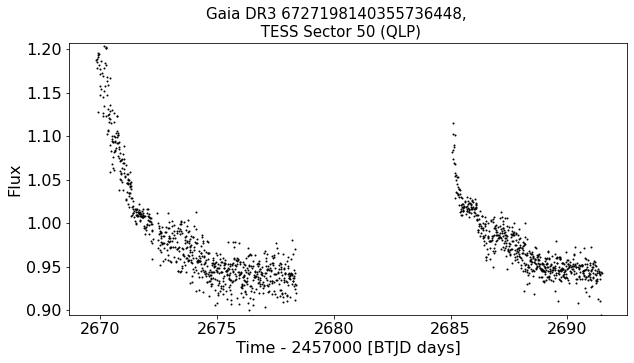

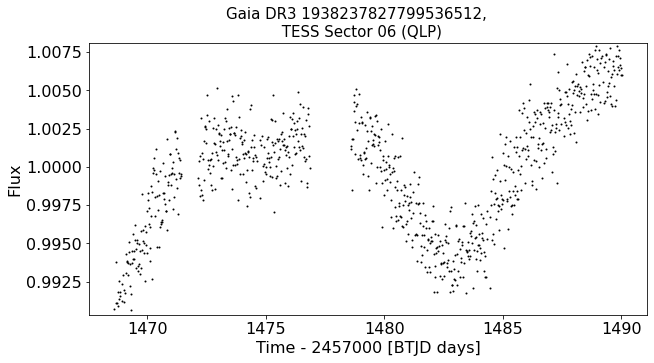

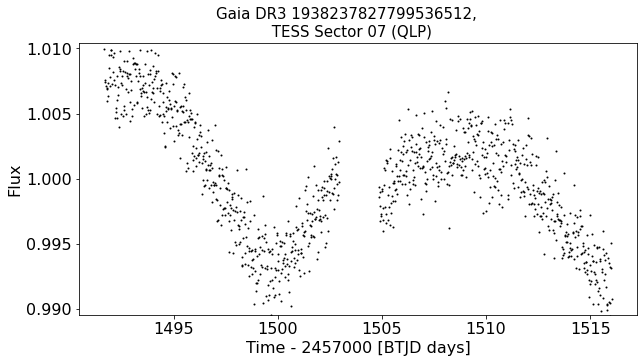

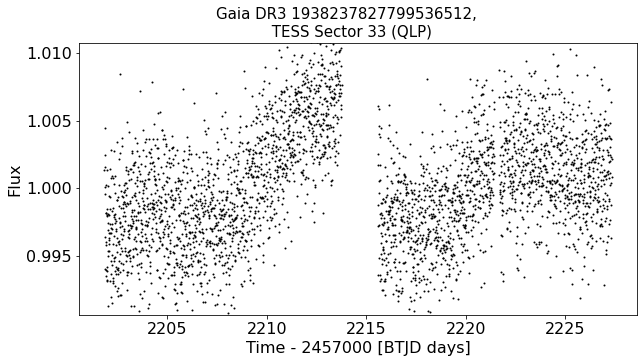

In [365]:
for id_ in range(len(idc_candidates)):

    search_ = search_results[id_]
    
    if len(search_) > 0:
        
        author_search = np.unique(search_.author.data)
        
        for auth in author_search:
            if auth == 'QLP':
                for miss in np.unique(search_[search_.author==auth].mission):
                     #'TASOC':
                    try:
                        lc_ = search_[(search_.author==auth) & (search_.mission==miss)].download_all(
                                    download_dir='/scratch/gcontard/lightkurves/').stitch()

                        fig, ax = plt.subplots(1,1, figsize=(10,5))

                        lc = lc_[lc_['quality']==0]
                        lc = lc[~np.isnan(lc['flux'].value)]
                        plot_lk(lc, ax, clip_outliers=True)
                        plt.suptitle(f"Gaia DR3 {sourceid_candi[id_]}, \n {miss} ({auth})", fontsize=15)

                        plt.show()
                    #lc.plot()
                    except Exception as e:
                        print(e)
                        print(f"There was an issue with the LC itself? \n \
                                     {sourceid_candi[id_]}, \n {miss} ({auth})")


        print("============")

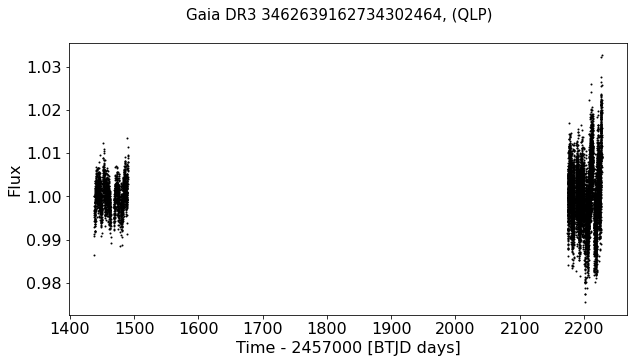

<Figure size 432x288 with 0 Axes>

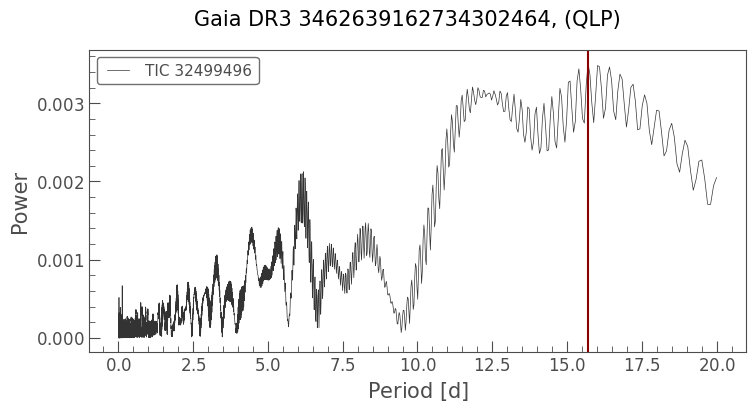

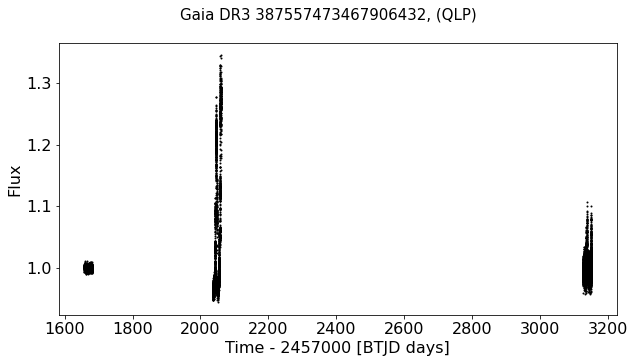

<Figure size 432x288 with 0 Axes>

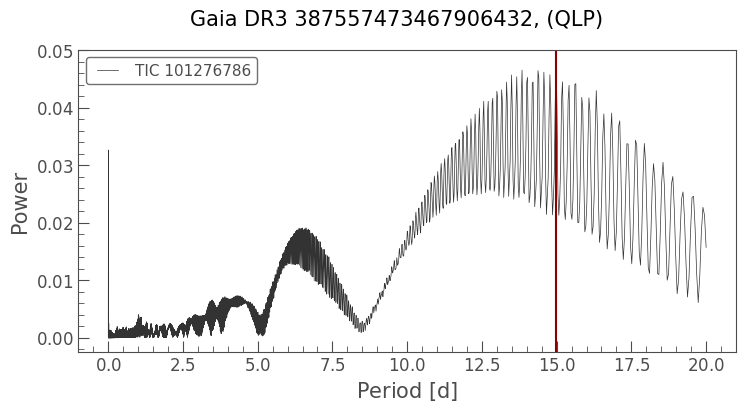

/u/g/gcontard/miniconda3/envs/numbatest/lib/python3.9/site-packages/lightkurve/lightcurve.py:1131: LightkurveWarning: The light curve appears to be zero-centered (median=1.00e+00 +/- 4.63e+01); `normalize()` will divide the light curve by a value close to zero, which is probably not what you want.
  warnings.warn(


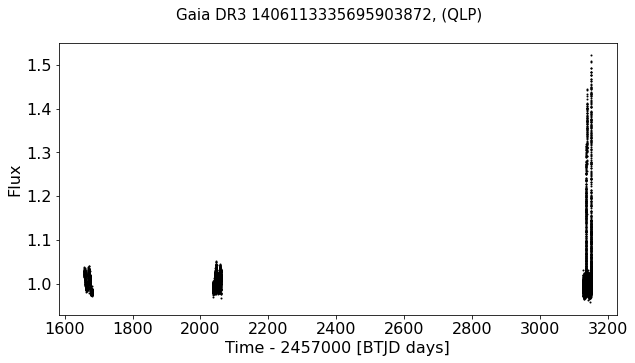

<Figure size 432x288 with 0 Axes>

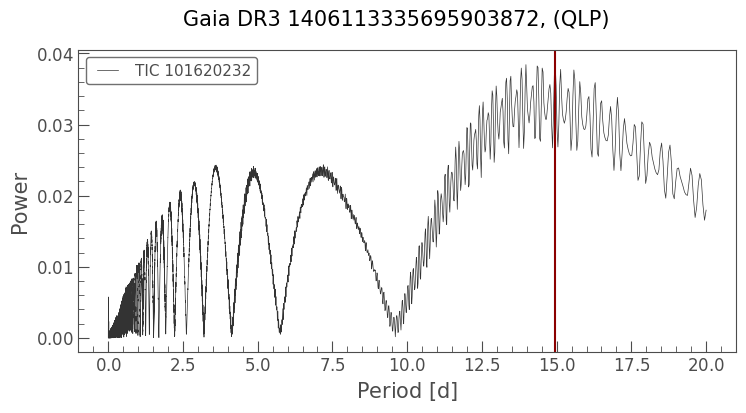

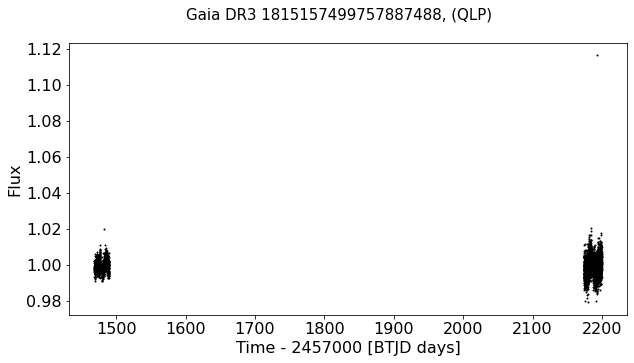

<Figure size 432x288 with 0 Axes>

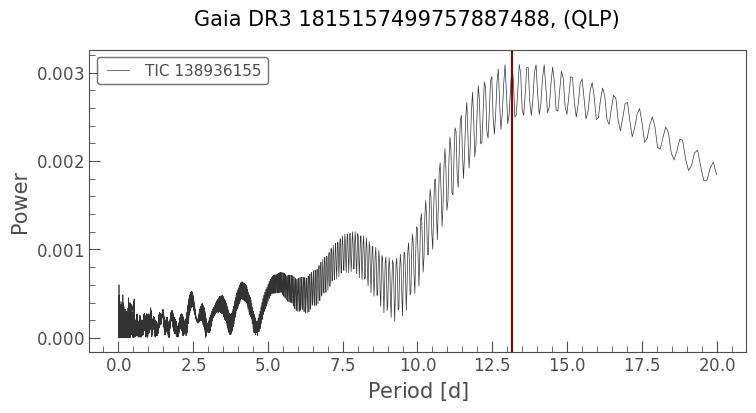

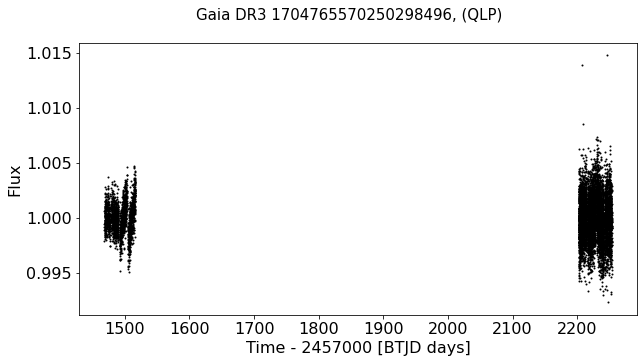

<Figure size 432x288 with 0 Axes>

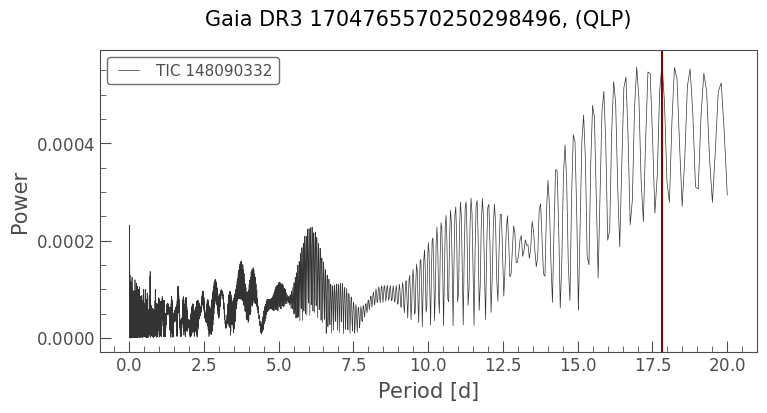

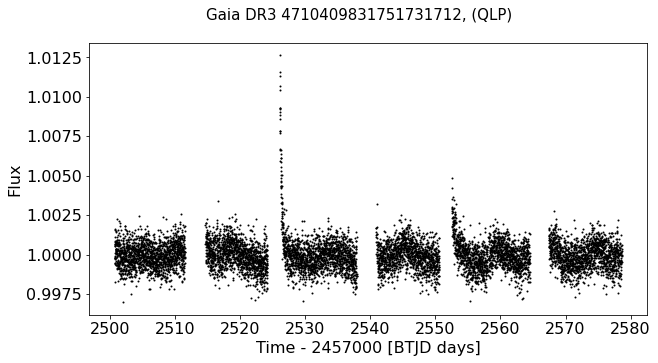

<Figure size 432x288 with 0 Axes>

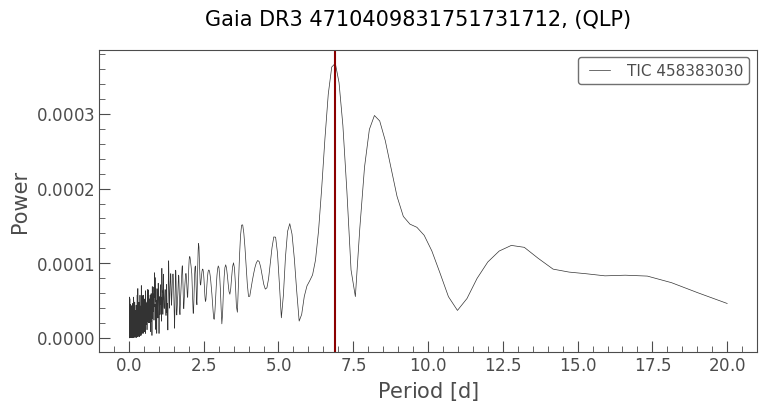

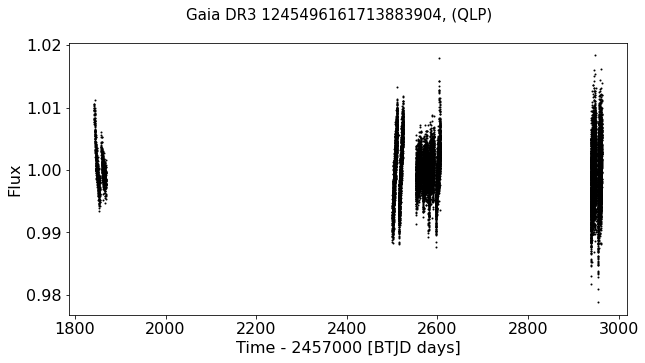

<Figure size 432x288 with 0 Axes>

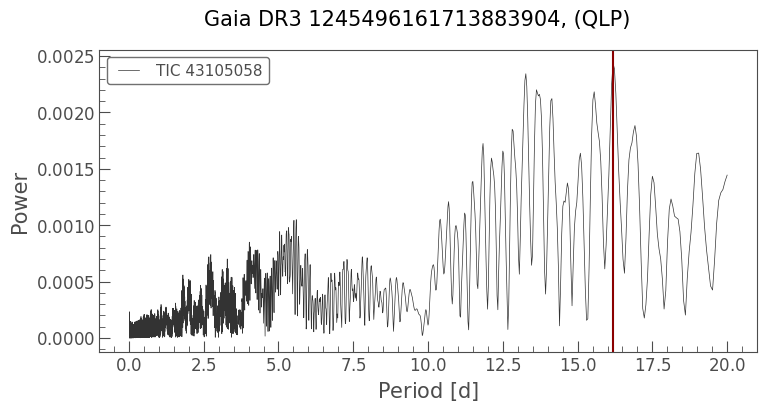

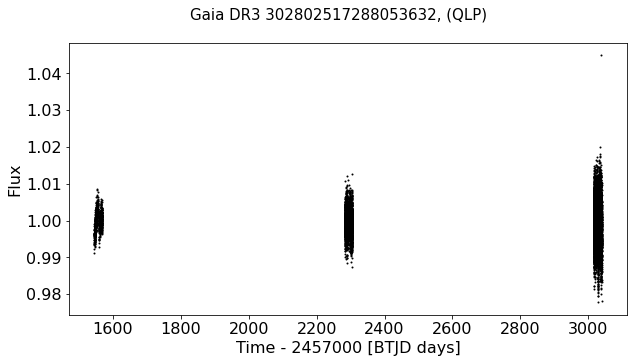

<Figure size 432x288 with 0 Axes>

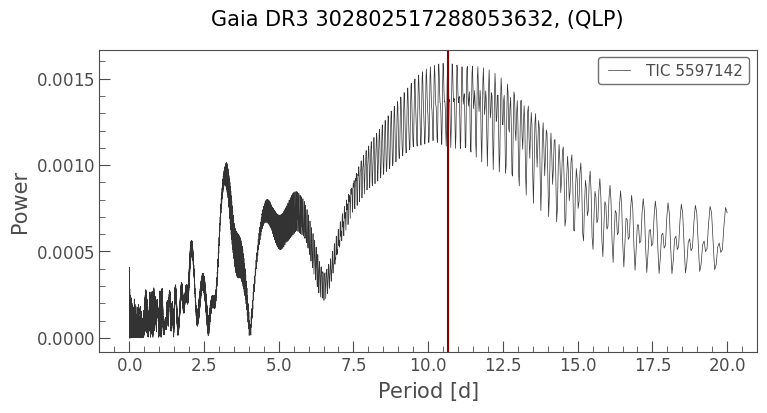

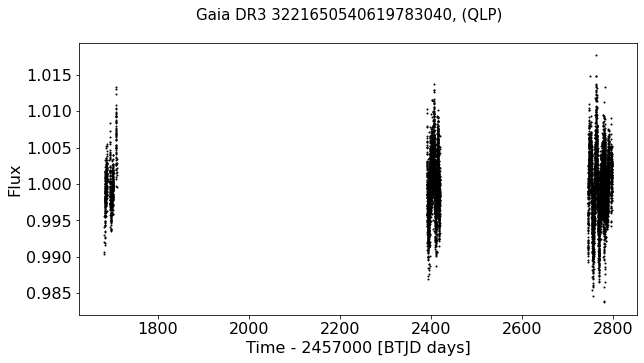

<Figure size 432x288 with 0 Axes>

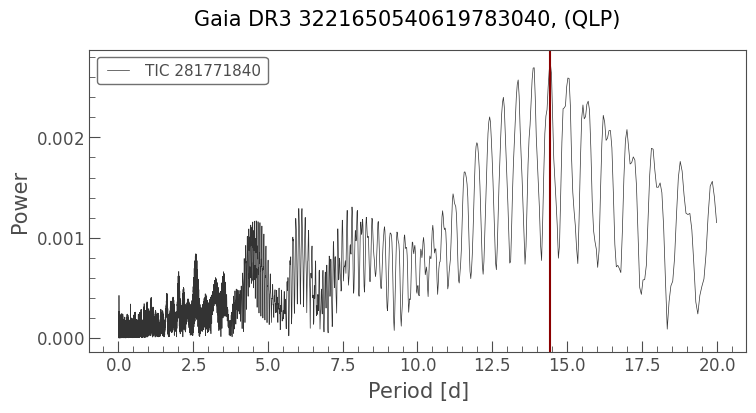

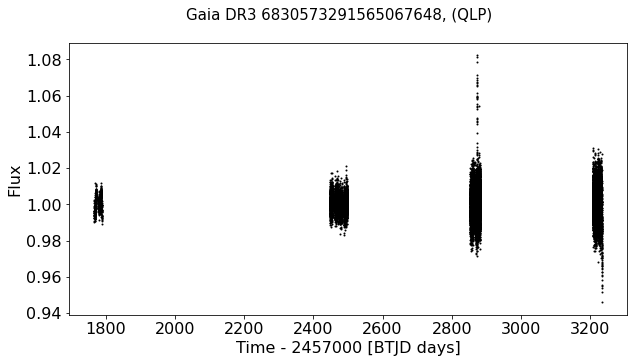

<Figure size 432x288 with 0 Axes>

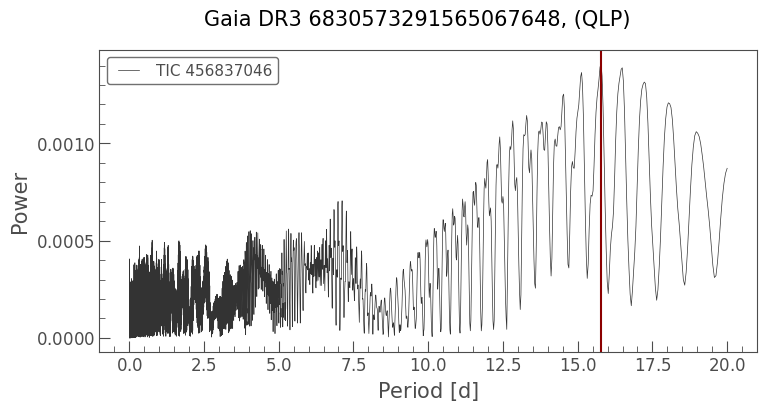

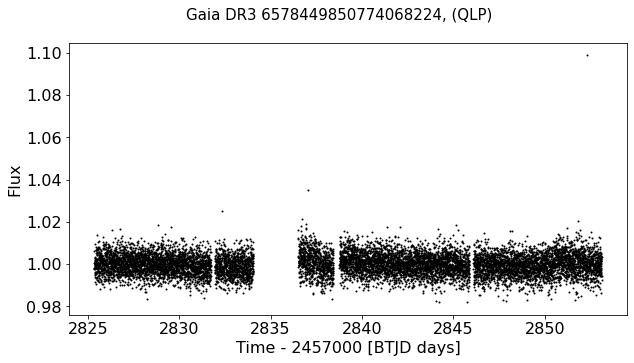

<Figure size 432x288 with 0 Axes>

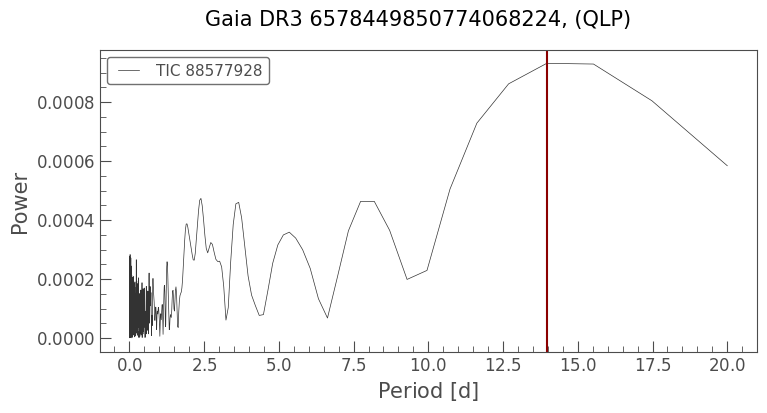

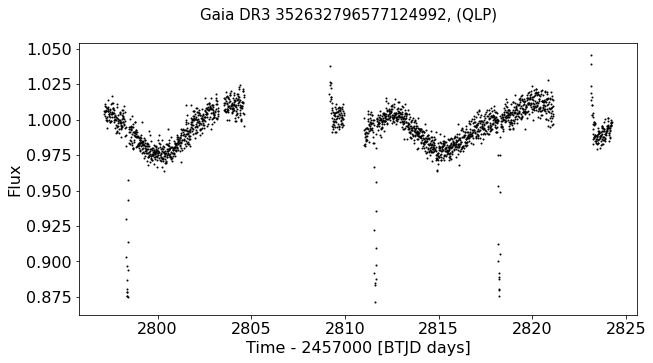

<Figure size 432x288 with 0 Axes>

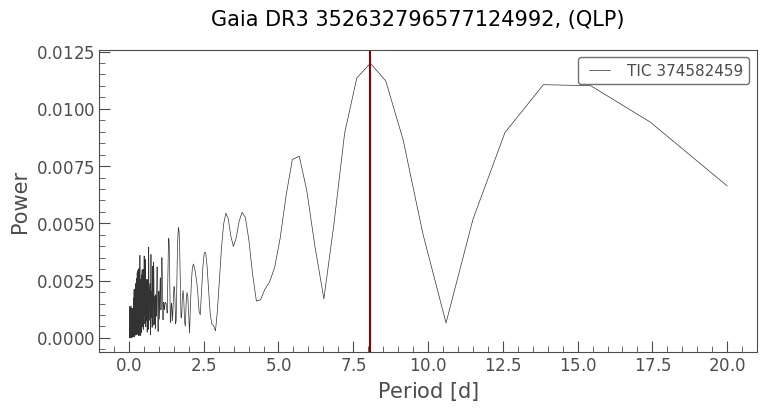

/u/g/gcontard/miniconda3/envs/numbatest/lib/python3.9/site-packages/lightkurve/lightcurve.py:1131: LightkurveWarning: The light curve appears to be zero-centered (median=9.99e-01 +/- 6.64e+01); `normalize()` will divide the light curve by a value close to zero, which is probably not what you want.
  warnings.warn(


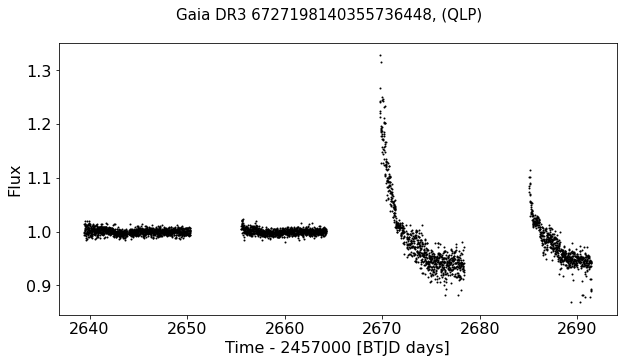

<Figure size 432x288 with 0 Axes>

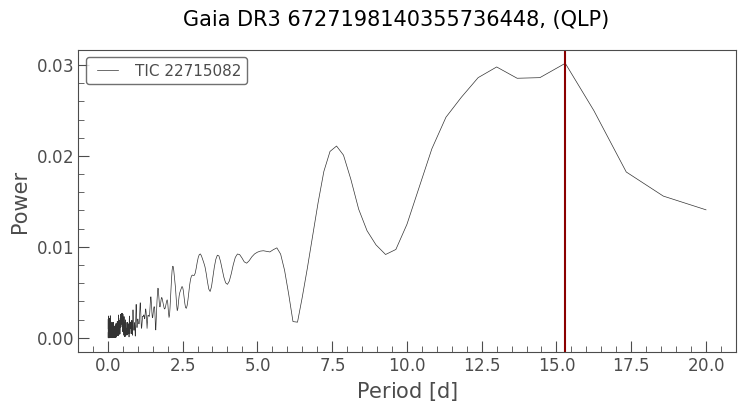

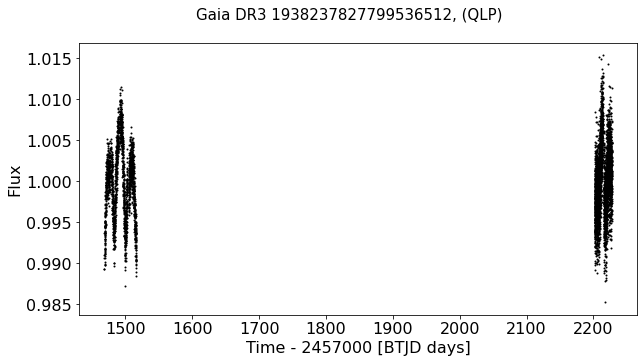

<Figure size 432x288 with 0 Axes>

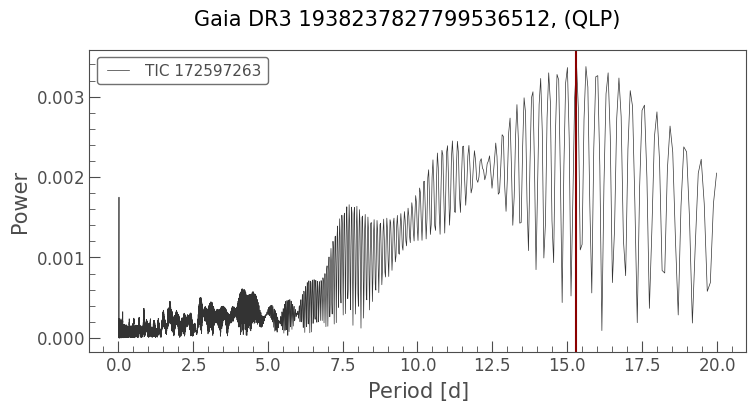

In [373]:
for id_ in range(len(idc_candidates)):

    search_ = search_results[id_]
    
    if len(search_) > 0:
        
        author_search = np.unique(search_.author.data)
        
        for auth in author_search:
            if auth == 'QLP':
                #for miss in np.unique(search_[search_.author==auth].mission):
                    
                try:
                    lc_ = search_[(search_.author==auth)].download_all(
                                download_dir='/scratch/gcontard/lightkurves/').stitch()

                    fig, ax = plt.subplots(1,1, figsize=(10,5))

                    lc = lc_[lc_['quality']==0]
                    lc = lc[~np.isnan(lc['flux'].value)]
                    plot_lk(lc, ax, clip_outliers=False)
                    plt.suptitle(f"Gaia DR3 {sourceid_candi[id_]}, ({auth})", fontsize=15)

                    plt.show()
                    
                    ## Lombscargle : 
                    plt.figure()
                    pg = lc.to_periodogram(maximum_period=20)
                    pg.plot(view='period');

                    #pg = lc.to_periodogram(maximum_period=100)
                    
                    plt.axvline(pg.period_at_max_power.value, color='darkred')
                    plt.suptitle(f"Gaia DR3 {sourceid_candi[id_]}, ({auth})", fontsize=15)
                    plt.show()
                #lc.plot()
                except Exception as e:
                    print(e)
                    print(f"There was an issue with the LC itself? \n \
                                 {sourceid_candi[id_]}, \n {miss} ({auth})")


                print("============")

## Gaia Variable flag

In [294]:
query_ = "SELECT * FROM gaiadr3.dr2_neighbourhood WHERE (dr3_source_id IN ("


for i in range(len(idc_candidates)-1):
    query_+= f"{df_unwise_merge['source_id'].iloc[idc_candidates[i]]},"
    
query_ += f"{df_unwise_merge['source_id'].iloc[idc_candidates[i+1]]}))"

#print(query_)
job = Gaia.launch_job_async(query_)

match_dr2 = job.get_results().to_pandas()
print(len(match_dr2))

INFO: Query finished. [astroquery.utils.tap.core]
53


In [296]:
match_dr2

,dr2_source_id,dr3_source_id,angular_distance,magnitude_difference,proper_motion_propagation
0,302802517288053632,302802517288053632,0.078298,-0.012805,True
1,344897216879901312,344897216879901312,0.138419,-0.004411,True
2,352632796577124992,352632796577124992,0.084013,-0.012788,True
3,387557473467906432,387557473467906432,0.118185,-0.006287,True
4,619195165798222208,619195165798222208,0.065769,-0.013577,True
5,709086185604311552,709086185604311552,0.033457,-0.007212,True
6,907249585730646016,907249585730646016,0.032822,-0.008532,True
7,1052596673505827840,1052596673505827840,0.030155,-0.006280,True
8,1245496161713883904,1245496161713883904,0.047900,-0.012285,True
9,1406113335695903872,1406113335695903872,0.016240,-0.012737,True


In [299]:
query_ = "SELECT * FROM gaiadr2.gaia_source WHERE (source_id IN ("

for i in range(len(match_dr2)-1):
    query_+= f"{match_dr2['dr2_source_id'].iloc[i]},"
    
query_ += f"{match_dr2['dr2_source_id'].iloc[i+1]}))"
#print(query_)
job = Gaia.launch_job_async(query_)

candi_dr2 = job.get_results().to_pandas()
print(len(candi_dr2))

INFO: Query finished. [astroquery.utils.tap.core]
53


In [306]:
match_dr2 = match_dr2.join(candi_dr2.set_index('source_id'), on='dr2_source_id')


In [308]:
df_varcandi_dr2 = df_varcandi.join(match_dr2[
    ['dr2_source_id', 'dr3_source_id', 'angular_distance', 'magnitude_difference',
     'phot_variable_flag']].set_index('dr3_source_id'), on='source_id', rsuffix='_dr2')


In [311]:
df_varcandi_dr2[
    ['source_id', 'phot_variable_flag',
     'phot_variable_flag_dr2', 'stetson', 'magnitude_difference' ]].iloc[
        np.argsort(df_varcandi_dr2['stetson'].values)[::-1]
]

,source_id,phot_variable_flag,phot_variable_flag_dr2,stetson,magnitude_difference
25,5260430146906778624,VARIABLE,NOT_AVAILABLE,2.637324,0.022927
49,2942418533272205312,VARIABLE,NOT_AVAILABLE,1.576004,-0.012981
32,3004530769758177280,NOT_AVAILABLE,NOT_AVAILABLE,1.560595,-0.018261
24,6578449850774068224,NOT_AVAILABLE,NOT_AVAILABLE,1.292125,-0.011358
5,6705842630930258816,VARIABLE,NOT_AVAILABLE,1.214231,-0.017132
38,3183786280737192704,VARIABLE,NOT_AVAILABLE,1.107310,0.008271
4,2886776063720502144,NOT_AVAILABLE,NOT_AVAILABLE,1.068782,-0.008571
15,3017430205815280384,VARIABLE,NOT_AVAILABLE,0.995236,-0.014984
46,5460701448263827968,VARIABLE,NOT_AVAILABLE,0.809174,-0.017311
45,2896314189652820224,VARIABLE,NOT_AVAILABLE,0.735170,-0.011645


In [324]:
np.sum(df_varcandi_dr2['phot_variable_flag']=='VARIABLE')#/len(r_candi)*100

10

In [322]:
np.sum(df_unwise_merge['phot_variable_flag']=='VARIABLE')/len(df_unwise_merge)*100

5.281362093503486

In [321]:
df_varcandi_dr2 = df_varcandi_dr2[]

2.515723270440252

In [323]:
query_ = "SELECT * FROM gaiadr3.vari_summary WHERE (source_id IN ("

for i in range(len(df_varcandi_dr2)-1):
    query_+= f"{df_varcandi_dr2['source_id'].iloc[i]},"
    
query_ += f"{df_varcandi_dr2['source_id'].iloc[i+1]}))"
#print(query_)
job = Gaia.launch_job_async(query_)

vari_candi = job.get_results().to_pandas()
print(len(vari_candi))

INFO: Query finished. [astroquery.utils.tap.core]
11


In [327]:
var_ft = ['source_id','outlier_median_rp',
'in_vari_classification_result',
'in_vari_rrlyrae',
'in_vari_cepheid',
'in_vari_planetary_transit',
'in_vari_short_timescale',
'in_vari_long_period_variable',
'in_vari_eclipsing_binary',
'in_vari_rotation_modulation',
'in_vari_ms_oscillator',
'in_vari_agn',
'in_vari_microlensing',
'in_vari_compact_companion']
vari_candi[var_ft]

,source_id,outlier_median_rp,in_vari_classification_result,in_vari_rrlyrae,in_vari_cepheid,in_vari_planetary_transit,in_vari_short_timescale,in_vari_long_period_variable,in_vari_eclipsing_binary,in_vari_rotation_modulation,in_vari_ms_oscillator,in_vari_agn,in_vari_microlensing,in_vari_compact_companion
0,344897216879901312,2.783251,True,False,False,False,False,False,False,False,False,False,False,False
1,387557473467906432,5.825891,False,False,False,False,False,False,False,False,False,False,False,False
2,2256421065353454464,25.832314,True,False,False,False,False,False,False,False,False,False,False,False
3,2896314189652820224,8.742794,True,False,False,False,False,False,False,False,False,False,False,False
4,2942418533272205312,21.151974,True,False,False,False,False,False,False,False,False,False,False,False
5,3017430205815280384,6.780870,True,False,False,False,False,False,False,False,False,False,False,False
6,3183786280737192704,60.100060,True,False,False,False,False,False,False,False,False,False,False,False
7,5260430146906778624,103.774048,False,False,False,False,True,False,False,False,False,False,False,False
8,5456960634826855168,18.875616,False,False,False,False,False,False,False,True,False,False,False,False
9,5460701448263827968,4.393209,True,False,False,False,False,False,False,False,False,False,False,False


In [328]:
query_ = "SELECT * FROM  gaiadr3.vari_classifier_result WHERE (source_id IN ("

for i in range(len(df_varcandi_dr2)-1):
    query_+= f"{df_varcandi_dr2['source_id'].iloc[i]},"
    
query_ += f"{df_varcandi_dr2['source_id'].iloc[i+1]}))"
#print(query_)
job = Gaia.launch_job_async(query_)

vari_candi = job.get_results().to_pandas()
vari_candi

INFO: Query finished. [astroquery.utils.tap.core]


,solution_id,source_id,classifier_name,best_class_name,best_class_score
0,375316653866487564,344897216879901312,nTransits:5+,DSCT|GDOR|SXPHE,0.463720
1,375316653866487564,2256421065353454464,nTransits:5+,RS,0.482756
2,375316653866487564,2896314189652820224,nTransits:5+,SOLAR_LIKE,0.321045
3,375316653866487564,2942418533272205312,nTransits:5+,SOLAR_LIKE,0.127817
4,375316653866487564,3017430205815280384,nTransits:5+,SOLAR_LIKE,0.344745
5,375316653866487564,3183786280737192704,nTransits:5+,RS,0.273731
6,375316653866487564,5460701448263827968,nTransits:5+,SOLAR_LIKE,0.611456
7,375316653866487564,6705842630930258816,nTransits:5+,ECL,0.971973


DSCT|GDOR|SXPHE 	 :
    δ Scuti (DSCT) or γ Doradus (GDOR) or SX Phoenicis (SXPHE) star, including hybrid δ Scuti + γ Doradus (DSCT+GDOR) stars (labelled as DSCT|GDOR|SXPHE);



ECL:  eclipsing binary (ECL), including Algol (β Persei) type (EA), β Lyrae type (EB), and W Ursae Majoris type (EW);


RS Canum Venaticorum variable (RS);

solar-like star (SOLAR_LIKE), including BY Draconis type (BY), rotating spotted star (ROT), BY and/or ROT star (BY|ROT), and flaring star (FLARES);


https://www.aanda.org/articles/aa/full_html/2023/06/aa45591-22/aa45591-22.html

## Catalog of Variable

In [104]:
#catalogs = Vizier.get_catalogs('J/A+A/674/A22')
#catalogs 
# This is a pretty big catalog so we used a ADQL query on Vizier to check the crossmatch
crossmatch_var = pd.read_csv('/scratch/gcontard/infrared/variable_AA_674_A22_catalog_crossmatchcandidate.csv')
crossmatch_var

,GaiaDR3,RAJ2000,DEJ2000,psuperclass,pvarTypes,pPer,pCat
0,5260430146906778624,96.37423,-76.80400,ECL,EB,0.361013,ASASSN_VAR_JAYASINGHE_2019
1,6705842630930258816,281.42041,-45.52452,ECL,EW,0.272710,ASASSN_VAR_JAYASINGHE_2019


## Catalogue of Open Cluster / crossmatch

In [107]:
openclust = Vizier.get_catalogs('J/A+A/673/A114/clusters')
openclust

TableList with 1 tables:
	'0:J/A+A/673/A114/clusters' with 67 column(s) and 7167 row(s) 

In [111]:
openclust = openclust[0]

In [110]:
#J/A+A/673/A114/clusters
cross_openclust = pd.read_csv('/scratch/gcontard/infrared/openclust_crossmatchcandi.csv')
cross_openclust

,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,DE_ICRS,pmRA,pmDE,Plx,Gmag,BPmag,RPmag,RV,_RA_icrs,_DE_icrs


(array([ 497.,  544.,  811., 1358., 1774., 1055.,  629.,  275.,  135.,
          89.]),
 array([6.4000001 , 6.75276208, 7.10552407, 7.45828605, 7.81104803,
        8.16381001, 8.516572  , 8.86933398, 9.22209596, 9.57485795,
        9.92761993]),
 <BarContainer object of 10 artists>)

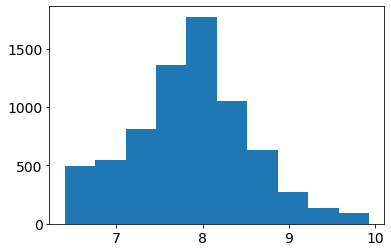

In [123]:
plt.hist(openclust['logAge16'])#[openclust['CST']>30]);
#plt.yscale('log')

In [128]:
#1Gy = 1,000,000,000. 10**9
10**9

1000000000

In [125]:
10**-3

0.001

In [114]:
# Gaia DR3 5233604915060520576  HD 100546 -- Be Star 
# HD 163296  	Gaia DR3 4070355800839765248 Herbig Ae/Be Star 
# HD 141569  	Gaia DR3 4399438153527026176  Young stellar object
# HR 4796A Gaia DR3 6147117727029871360 high propermotion star
# beta pic  Gaia DR3 4792774797545800832  high pm star
# HD 21997 Gaia DR3 5084963312478488960  high pm star
# eta tel  	Gaia DR3 6643602576214115584 high pm star
# HD 172555 Gaia DR3 6438274350302427776 high mp star

sc_id_dr3_fivestep = [5233604915060520576,4070355800839765248, 4399438153527026176,
                     6147117727029871360, 4792774797545800832, 5084963312478488960, 6643602576214115584,
                     6438274350302427776]

In [115]:


query_ = "SELECT * FROM gaiadr3.gaia_source  AS dr3 WHERE (dr3.source_id IN ("

for i in range(len(sc_id_dr3_fivestep)-1):
    query_+= f"{sc_id_dr3_fivestep[i]},"
    
query_ += f"{sc_id_dr3_fivestep[i+1]}))"

#print(query_)
job = Gaia.launch_job_async(query_)
r_fivestep = job.get_results().to_pandas()
print(len(sc_id_dr3_fivestep), len(r_fivestep))


INFO: Query finished. [astroquery.utils.tap.core]
8 8


In [116]:
r_fivestep['SOURCE_ID']

0    4070355800839765248
1    4399438153527026176
2    4792774797545800832
3    5084963312478488960
4    5233604915060520576
5    6147117727029871360
6    6438274350302427776
7    6643602576214115584
Name: SOURCE_ID, dtype: int64

In [135]:
ra_t = r_fivestep['ra'].iloc[1]
dec_t = r_fivestep['dec'].iloc[1]
gaia_id = r_fivestep['SOURCE_ID'].iloc[1]
print(ra_t, dec_t, gaia_id)
s = Star(str(gaia_id), ra_t * u.degree, dec_t * u.degree, g_id=gaia_id)
#0.101	3.156 	0.049	-0.691 	0.035	-3.565 	0.001
# s.add_mag(4.201,0.101, "WISE_RSR_W1")
# s.add_mag(3.156,0.049, "WISE_RSR_W2")
# s.add_mag(-0.691,0.035, "WISE_RSR_W3")
# s.add_mag(-3.565,0.001, "WISE_RSR_W4")

237.49054012422786 -3.921290953058801 4399438153527026176

		#####################################
		##             ARIADNE             ##
		#####################################
   spectrAl eneRgy dIstribution bAyesian moDel averagiNg fittEr

			Author : Jose Vines
			Contact : jose . vines at ug . uchile . cl
			Star : 4399438153527026176
		*** LOOKING UP ARCHIVAL INFORMATION ***
INFO: Query finished. [astroquery.utils.tap.core]
Warning!: CatalogWarning
Warning message: Parameter radius not found! Be advised.
Warning!: CatalogWarning
Warning message: Parameter lum not found! Be advised.
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
Star not found in catalog Pan-STARRS.
INFO: Query finished. [astroquery.utils.tap.core]
Star not found in catalog SDSS.
INFO: Query finished. [astroquery.utils.tap.core]
Star not found in catalog Wise.
INFO: Query finished. [astroquery.utils.tap.core]
INFO: Query finished. [astroquery.utils.tap.core]
Lo

In [131]:
saving_folder = '/scratch/gcontard/infrared/ariadne_fivestepstars/'
starname = saving_folder + str(gaia_id)

out_folder = starname

models = [
    'ck04'
]

f = Fitter()
f.star = s
f.setup = setup
f.av_law = 'fitzpatrick'
f.out_folder = out_folder
f.bma = True
f.models = models
f.n_samples = 100000

## Do we want prior ?

f.prior_setup = {
    'teff': ('default'), #'normal', df_unwise_merge['teff_gspphot'].iloc[idx_targ], 100),
    'logg': ('default'),# df_unwise_merge['logg_gspphot'].iloc[idx_targ], .5),
    'z': ('default'),
    'dist': ('default'),
    'rad': ('default'),
    'Av': ('default')
}
# try:
f.initialize()
f.fit_bma()

Created the directory /scratch/gcontard/infrared/ariadne_fivestepstars/4070355800839765248

		*** EXECUTING MAIN FITTING ROUTINE ***
			Selected engine : Bayesian Model Averaging
			Live points : 500
			log Evidence tolerance : 0.5
			Free parameters : 20
			Bounding : multi
			Sampling : rwalk
			N threads : 4

			FITTING MODEL : ck04


19990it [05:38, 59.03it/s, +500 | bound: 244 | nc: 1 | ncall: 474105 | eff(%):  4.326 | loglstar:   -inf < 250.891 <    inf | logz: 211.342 +/-    nan | dlogz:  0.001 >  0.500] 


		*** AVERAGING POSTERIOR SAMPLES ***


100%|██████████| 24/24 [00:00<00:00, 62.64it/s]


		*** ESTIMATING AGE AND MASS USING MIST ISOCHRONES ***


24117it [01:54, 210.11it/s, +500 | bound: 304 | nc: 1 | ncall: 846552 | eff(%):  2.910 | loglstar:   -inf < -4.935 <    inf | logz: -48.749 +/-  7.402 | dlogz:  0.000 >  0.010]   



			Fitting finished.
			Best fit parameters are:
			teff : 7148.3832 + 163.7010 - 275.4968 [6409.7323, 7603.5519]
			logg : 4.6339 + 0.3460 - 1.1033 [3.5055, 5.0000]
			[Fe/H] : -0.3226 + 0.1329 - 0.4452 [-1.1304, -0.0605]
			dist : 100.5821 + 0.6027 - 0.0822 [100.4999, 102.5476]
			rad : 2.5671 + 0.2527 - 0.1598 [2.2326, 3.3438]
			Av : 0.0046 + 0.0460 - 0.0046 [0.0000, 0.1720]
			Angular Diameter : 0.2368 + 0.0242 - 0.0150 [0.2026, 0.3091]
			Grav mass : 1.4252 + 14.6888 - 0.8226 [0.6026, 35.6206]
			Luminosity : 15.2132 + 3.6402 - 2.9534 [8.5510, 29.0872]
			Iso mass : 1.6416 + 0.1768 - 0.0640 [1.1264, 2.0379]
			Age (Gyr) : 1.3423 + 0.2535 - 0.2777 [0.0023, 3.6119]
			EEP : 388.8184 + 9.2034 - 25.5650 [169.9820, 475.7394]
			Excess U noise : 0.0136 + 0.0655 - 0.0136 [0.0000, 0.2718]
			Excess BT noise : 0.1339 + 0.0876 - 0.0698 [0.0330, 0.4770]
			Excess B noise : 0.0533 + 0.0425 - 0.0166 [0.0270, 0.1651]
			Excess BP noise : 0.0173 + 0.0666 - 0.0173 [0.0000, 0.2728]
			Excess VT 


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/ariadne_fivestepstars/4070355800839765248/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/ariadne_fivestepstars/4070355800839765248//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.


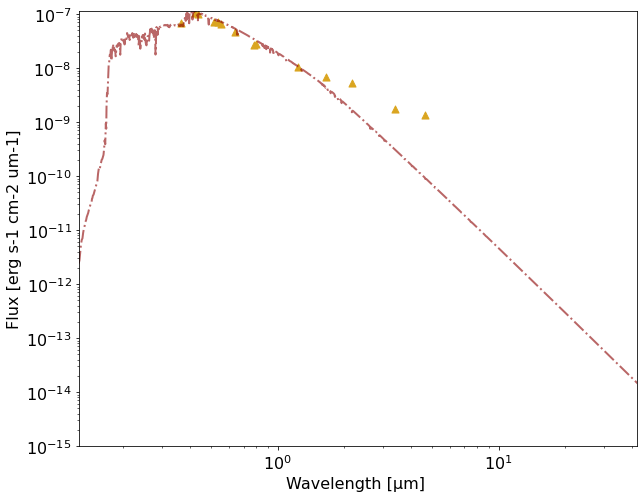

In [134]:
in_file_og = out_folder + '/BMA.pkl'
in_file = out_folder +"/BMA_bid.pkl"
plots_out_folder = starname +"/" #out_folder + "Plots/"

fig, axs = plt.subplots(figsize=(10,8))
wavelengths_ariadne = [0.51289,0.642493, 0.77991, 1.235, 1.662, 2.159, 3.368, 4.618, 
                       12.082, 22.194]
bands_ARIADNE = ['GaiaDR2v2_BP', 'GaiaDR2v2_G','GaiaDR2v2_RP', '2MASS_J', '2MASS_H',
'2MASS_Ks', 'WISE_RSR_W1', 'WISE_RSR_W2','WISE_RSR_W3', 'WISE_RSR_W4']

list_photo = ['phot_bp_mean_mag', 'phot_g_mean_mag', 'phot_rp_mean_mag',
             'j_m', 'h_m','ks_m', 'mag_w1_vg', 'mag_w2_vg', 'w3mpro', 'w4mpro']

if os.path.isfile(f"{starname}/BMA.pkl"):

    out = pickle.load(open(in_file_og, 'rb'))
    out['star'].irx_filter_mask = np.array([43, 44])
    pickle.dump(out, open(in_file, 'wb'))

    artist = SEDPlotter(in_file, plots_out_folder,pdf=True, ir_excess=True , model='ck04') #ck04, kurucz, phoenix

    artist.moddir = '/scratch/gcontard/SEDFitting/'
    artist.star.load_grid('ck04')

    flx_sed_fitt, new_w = get_sed_ck04(artist)


    n_filt = artist.star.used_filters.sum()
    n_pars = int(len(artist.theta) - n_filt)

    mask = artist.star.filter_mask
    mags = artist.star.mags[mask]

    filters = artist.star.filter_names[mask]
    wave = artist.star.wave[mask]
    flxs_obs = []
    for i_, th in enumerate(artist.theta[n_pars:]):
        mag = mags[i_]
        filt = filters[i_]
        _flx, er = mag_to_flux(mag, th, filt) # erg / cm2 / s / um
        flxs_obs.append(_flx)
        artist.theta[n_pars + i_] = er



    axs.set_ylabel('Flux [erg s-1 cm-2 um-1]')
    axs.set_yscale('log')
    axs.set_xscale('log')
    axs.set_xlabel("Wavelength [µm] ")



    axs.plot(new_w, flx_sed_fitt/new_w, '-.', c='darkred', lw=2, alpha=.6,
             label='SED Fitting (w/o W1-4)')


#         bb = BlackBody(temperature=T1*u.K, scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
#         wav = new_w * u.micron # 10000 * u.AA
#         fluxbb = bb(wav)
#         fluxfin = fluxbb.value * ang_size

#         sed_integral = integrate.simpson(flx_sed_fitt/new_w, new_w)
#         bb_integral = integrate.simpson(fluxfin, new_w)
#         frac_l = bb_integral / sed_integral

#         label_bb = "BlackBody-fit: Teff: {}K, \n ang-size: {:.3e} \n ".format(T1,
#                                                                                    ang_size)
#         label_bb = label_bb + r"$L_{BB}/L_{SED}$:"
#         label_bb = label_bb + "{:.3f}".format(frac_l)

#         axs.plot(new_w, fluxfin, '--', color='darkgrey', lw=1.9, alpha=.4,
#           label=label_bb)

#         axs.plot(new_w, fluxfin +flx_sed_fitt/new_w, color='k', lw=1.8, alpha=.6, 
#                  label='BlackBody + SED' )


    axs.scatter(wave, flxs_obs, s=50, marker='^', c='goldenrod',
                label='Observations ')

    axs.set_ylim(1e-15, np.max(flx_sed_fitt/new_w)+1e-10) #np.min(flx_sed_fitt/new_w)
    axs.set_xlim(np.min(new_w), np.max(wavelengths_ariadne)+20) #np.min(flx_sed_fitt/new_w)


# Disk / Excess Analysis

### Code for grabbing ARIADNE data

In [23]:
saving_folder = "/scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/"

In [96]:
import pickle

In [97]:

engine = 'dynesty'
nlive = 500
dlogz = 0.5
bound = 'multi'
sample = 'rwalk'
threads = 4
dynamic = False

setup = [engine, nlive, dlogz, bound, sample, threads, dynamic]

In [76]:


## This can take a bit of time. Upload the files on github?
for id_ in idc_candidates:
    # Comment to run
    break
    t = time.time()
    idx_targ = id_#idcs_maskplot[0]

    print(f"Gaia DR3 {df_unwise_merge['source_id'].iloc[idx_targ]}")


    ra_t, dec_t = df_unwise_merge['ra_2'].iloc[idx_targ], df_unwise_merge['dec_2'].iloc[idx_targ]
    print(f"ra: {ra_t}   dec: {dec_t}")

    gaia_id = df_unwise_merge['source_id'].iloc[idx_targ]
    starname = saving_folder + str(gaia_id)

    out_folder = starname
    if os.path.isfile(f"{starname}/BMA.pkl"):
        print(f"{starname} already done")
    else:
        try:
            s = Star(starname, ra_t * u.degree, dec_t * u.degree, g_id=gaia_id)
        except Exception as e:
            #flag_s = False
            print(f"Something happened in the creation of Star {gaia_id}")
            print(e)       
        
        ### Force remove W1 & W2 for fitting
        ### NOTE I HAVE TO PUT THEM BACK AGAIN FOR PLOTTING LATER ON...
        
        for wi in range(1,3):
            s.remove_mag(f"WISE_RSR_W{wi}")

        ### W3 and W4 will not be used for the fitting anyway
        ## 
#         for wi in range(3,5):
#             err_w3 = df_unwise_merge['w3mpro_error'].iloc[idx_targ] #values[int_tr:][mask_comp[j]] 
#             if np.isnan(err_w3):
#                 err_w3 = 0.0
#             err_w4 = df_unwise_merge['w4mpro_error'].iloc[idx_targ] #values[int_tr:][mask_comp[j]]
#             if np.isnan(err_w4):
#                 err_w4 = 0.0
#             s.add_mag(df_unwise_merge['w3mpro'].iloc[idx_targ], err_w3, 
#               'WISE_RSR_W3')
#             s.add_mag(df_unwise_merge['w4mpro'].iloc[idx_targ], err_w4, 
#               'WISE_RSR_W4')
            
        models = [
            'ck04'
        ]

        f = Fitter()
        f.star = s
        f.setup = setup
        f.av_law = 'fitzpatrick'
        f.out_folder = out_folder
        f.bma = True
        f.models = models
        f.n_samples = 100000

        ## Do we want prior ?

        f.prior_setup = {
            'teff': ('normal', df_unwise_merge['teff_gspphot'].iloc[idx_targ], 100),
            'logg': ('normal', df_unwise_merge['logg_gspphot'].iloc[idx_targ], .5),
            'z': ('default'),
            'dist': ('default'),
            'rad': ('default'),
            'Av': ('default')
        }
        # try:
        f.initialize()
        f.fit_bma()
    clear_output(wait=True)
    print(time.time()-t)
    

In [98]:

def get_sed_ck04(arti):
    Rv = 3.1  # For extinction.
    if not arti.norm:
        rad = arti.theta[4]
        dist = arti.theta[3] * u.pc.to(u.solRad)
        norm = (rad / dist) ** 2
        Av = arti.theta[5]
    else:
        norm = arti.theta[3]
        Av = arti.theta[4]
            
    wave, flux = arti.fetch_ck04()

    lower_lim = 0.125 < wave
    upper_lim = wave < 4.629296073126975
    if arti.irx:
        upper_lim = wave < wave[-1]

    wave = wave[lower_lim * upper_lim]
    flux = flux[lower_lim * upper_lim]
    ext = arti.av_law(wave * 1e4, Av, Rv)
    flux = apply(ext, flux)
    flux *= wave * norm
    #ax.plot(wave, flux, lw=1.25, color=arti.model_color, zorder=0)

    return flux, wave

In [27]:
wavelengths_ariadne = [0.51289,0.642493, 0.77991, 1.235, 1.662, 2.159, 3.368, 4.618, 
                       12.082, 22.194]
bands_ARIADNE = ['GaiaDR2v2_BP', 'GaiaDR2v2_G','GaiaDR2v2_RP', '2MASS_J', '2MASS_H',
'2MASS_Ks', 'WISE_RSR_W1', 'WISE_RSR_W2','WISE_RSR_W3', 'WISE_RSR_W4']

list_photo = ['phot_bp_mean_mag', 'phot_g_mean_mag', 'phot_rp_mean_mag',
             'j_m', 'h_m','ks_m', 'mag_w1_vg', 'mag_w2_vg', 'w3mpro', 'w4mpro']
    

def get_ARIADNE_fluxSED_fluxObs(idx_targ, 
                sed_folder="/scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/"):
    
    ## Works on df_unwise_merge , not super elegant but eh.
    
    gaia_id = df_unwise_merge['source_id'].iloc[idx_targ]
    starname = sed_folder + str(gaia_id)
    
    out_folder = starname

    in_file_og = out_folder + '/BMA.pkl'
    in_file = out_folder +"/BMA_bid.pkl"
    plots_out_folder = starname +"/" #out_folder + "Plots/"

    if os.path.isfile(f"{starname}/BMA.pkl"):
        
        out = pickle.load(open(in_file_og, 'rb'))
        out['star'].irx_filter_mask = np.array([43, 44])
        pickle.dump(out, open(in_file, 'wb'))

        artist = SEDPlotter(in_file, plots_out_folder,pdf=True, ir_excess=True , model='ck04') #ck04, kurucz, phoenix


        #artist.grid = 'phoenix'
        artist.moddir = '/scratch/gcontard/SEDFitting/'
        artist.star.load_grid('ck04')

        flx_sed_fitt, new_w = get_sed_ck04(artist)


        
        flx_obs = []
        for phot_ in range(len(list_photo)):
            flx_obs.append(mag_to_flux(df_unwise_merge[list_photo[phot_]].iloc[idx_targ],
                                          0, bands_ARIADNE[phot_])[0])

        flx_sed = []
        for phot_ in range(len(list_photo)):
            id_w = np.argmin(np.abs(new_w - wavelengths_ariadne[phot_]))
            flx_sed.append(flx_sed_fitt[id_w]/new_w[id_w])
            
        return flx_obs, flx_sed
    else:
        raise Exception(f"Star idx {idx_targ} (GAIA DR3 {gaia_id}) has not been fitted by ARIADNE")
        #return np.nan, np.nan

### Plot flux observed vs Flux predicted by Ariadne for the candidates

In [35]:
fluxs_SED, fluxs_obs = [], []

# ## If some issues with the pickle/ARIADNE (?): 
# import multiprocessing as mp
# mp.get_context()
# mp.set_start_method(None, force=True)
    
for id_ in idc_candidates:
    flx_ob, flx_sed = get_ARIADNE_fluxSED_fluxObs(id_)
    

    fluxs_obs.append(flx_ob)
    fluxs_SED.append(flx_sed)

fluxs_SED, fluxs_obs = np.array(fluxs_SED), np.array(fluxs_obs)


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6502798709139275136/ failed. It might already exist
Creation of 


Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416/ fa


Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6612104218072332160/ fa

In [80]:
bands_ARIADNE[-3]

'WISE_RSR_W2'

Text(0, 0.5, 'Flux (W2) SED-fit (erg s-1 cm-2 um-1)')

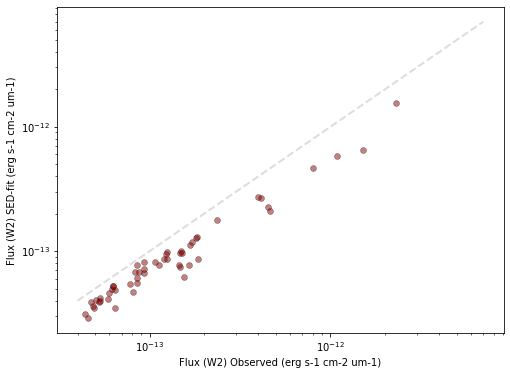

In [81]:
fig, axs0 = plt.subplots(1,1,figsize=(8,6))

p=axs0.scatter(fluxs_obs[:,-3], 
           fluxs_SED[:,-3],
           s=35, alpha=.5,  edgecolors='k', lw=.5,
            c='darkred')
axs0.plot([4e-14, 7e-12],[4e-14, 7e-12], color='darkgrey',alpha=.4,lw=2, ls='--')

axs0.set_yscale('log')
#plt.ylim(3e-15, 3e-12)
axs0.set_xscale('log')
axs0.set_xlabel('Flux (W2) Observed (erg s-1 cm-2 um-1)')
axs0.set_ylabel("Flux (W2) SED-fit (erg s-1 cm-2 um-1)")


## Black Body Fitting

In [36]:

mintemp,maxtemp,steptemp = 100, 1500, 5
range_temp_fit = np.arange(mintemp,maxtemp,steptemp)
print(range_temp_fit.shape)

range_angsize_fit = np.logspace(-23, -16, num=200, base=10)
print(range_angsize_fit.shape)

bbody_est_fit = []
labels_fit = []
dic_index_fit = {}
count = 0
for i in range(len(range_temp_fit)):
    T1 = range_temp_fit[i]
    dic_index_fit[T1] = {}
    
    for j in range(len(range_angsize_fit)):
        
        ang_size = range_angsize_fit[j]    
        
        bb = BlackBody(temperature=T1*u.K, scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
        
        # the result will be returned in the requested units
        
        wav = wavelengths_ariadne * u.micron # 10000 * u.AA
        fluxbb = bb(wav)
        fluxfin = fluxbb.value * ang_size
        bbody_est_fit.append(fluxfin)
        labels_fit.append([T1, ang_size])
        dic_index_fit[T1][ang_size] = count
        count+=1
        
bbody_est_fit = np.array(bbody_est_fit)
print(bbody_est_fit.shape)

(280,)
(200,)
(56000, 10)


In [37]:
params_BB = []
fluxs_wBBs = []

for i in range(len(idc_candidates)):
    flx_obs = fluxs_obs[i]
    flx_sed = fluxs_SED[i]
    
    resid_ = np.array(flx_obs) - np.array(flx_sed)
    
    ## Fitting is done as minimization of MSE over K, W1, W2, and W3 fluxes 
    err_ = np.sum(((bbody_est_fit[:, -5:-1] - resid_[-5:-1]))**2, axis=1)
    #err_ = np.sum(((bbody_est_fit[:, -5:-1] - resid_[-5:-1])/resid_[-5:-1])**2, axis=1)
    best_bb = np.argmin(err_)

    T1 = labels_fit[best_bb][0]
    angsize = labels_fit[best_bb][1]

    params_BB.append(np.array([T1,angsize]))

    bb2 = BlackBody(temperature=T1*u.K, 
                    scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
    ## Assuming K-W1-W2-W3 used for fitting
    wav =  wavelengths_ariadne * u.micron # 10000 * u.AA
    fluxbb = bb2(wav)
    fluxfin_ = fluxbb.value * angsize

    flx_sed_bb = np.array(flx_sed) + fluxfin_

    fluxs_wBBs.append(np.array(flx_sed_bb))
    
params_BB = np.array(params_BB)
fluxs_wBBs = np.array(fluxs_wBBs)

WISE_RSR_W2


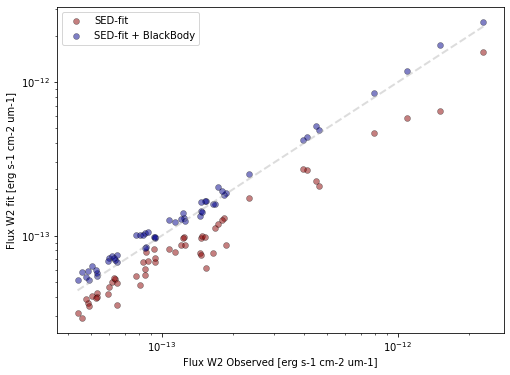

In [84]:
fig, axs0 = plt.subplots(1,1,figsize=(8,6))

band_ = -3
print(bands_ARIADNE[band_])
p=axs0.scatter(fluxs_obs[:,band_], 
           fluxs_SED[:,band_],
           s=35, alpha=.5,  edgecolors='k', lw=.5,
            c='darkred', label='SED-fit')

axs0.scatter(fluxs_obs[:,band_], 
           fluxs_wBBs[:,band_],
           s=35, alpha=.5,  edgecolors='k', lw=.5,
            c='darkblue', label='SED-fit + BlackBody')

axs0.plot([np.min(fluxs_obs[:,band_]), np.max(fluxs_obs[:,band_])],
          [np.min(fluxs_obs[:,band_]), np.max(fluxs_obs[:,band_])], 
          color='darkgrey',alpha=.4,lw=2, ls='--')

axs0.set_yscale('log')
#plt.ylim(3e-15, 3e-12)
axs0.legend()
axs0.set_xscale('log')
axs0.set_xlabel('Flux W2 Observed [erg s-1 cm-2 um-1]')
axs0.set_ylabel("Flux W2 fit [erg s-1 cm-2 um-1]")


plt.savefig(folder_figs+f'flux_obs_vs_SEDBB_{bands_ARIADNE[band_]}.pdf' , bbox_inches="tight", dpi=50)

Text(0, 0.5, 'Mag W2 fit ')

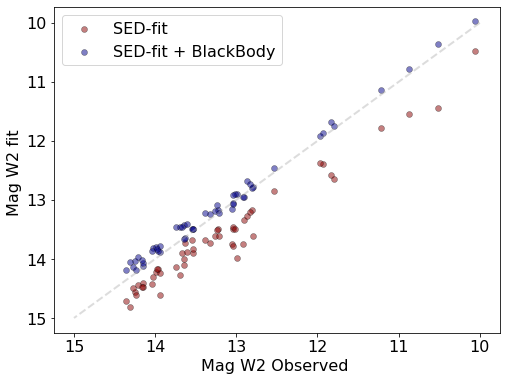

In [424]:
fig, axs0 = plt.subplots(1,1,figsize=(8,6))

band_ = -3
p=axs0.scatter(flux_to_mag(fluxs_obs[:,band_], 0, bands_ARIADNE[band_])[0], 
           flux_to_mag(fluxs_SED[:,band_], 0, bands_ARIADNE[band_])[0],
           s=35, alpha=.5,  edgecolors='k', lw=.5,
            c='darkred', label='SED-fit')

axs0.scatter(flux_to_mag(fluxs_obs[:,band_], 0, bands_ARIADNE[band_])[0], 
           flux_to_mag(fluxs_wBBs[:,band_], 0, bands_ARIADNE[band_])[0],
           s=35, alpha=.5,  edgecolors='k', lw=.5,
            c='darkblue', label='SED-fit + BlackBody')

axs0.plot([10,15],[10, 15], color='darkgrey',alpha=.4,lw=2, ls='--')
axs0.invert_xaxis()
axs0.invert_yaxis()
#axs0.set_yscale('log')
#plt.ylim(3e-15, 3e-12)

axs0.legend()
#axs0.set_xscale('log')
axs0.set_xlabel('Mag W2 Observed ')
axs0.set_ylabel("Mag W2 fit ")


## Injection of BlackBody and Recovery Rate

In [330]:

mintemp,maxtemp,steptemp = 200, 1575, 25
range_temp = np.arange(mintemp,maxtemp,steptemp)
print(range_temp.shape)

range_angsize = np.logspace(-23, -16, num=50, base=10)
print(range_angsize.shape)


bbody_est = []
labels = []
dic_index = {}
count = 0
for i in range(len(range_temp)):
    T1 = range_temp[i]
    dic_index[T1] = {}
    for j in range(len(range_angsize)):
        ang_size = range_angsize[j]        
        bb = BlackBody(temperature=T1*u.K, scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
        
        wav = [3.368, 4.618] * u.micron # 10000 * u.AA
        fluxbb = bb(wav)
        fluxfin = fluxbb.value * ang_size
        bbody_est.append(fluxfin)
        labels.append([T1, ang_size])
        dic_index[T1][ang_size] = count
        count+=1
        
bbody_est = np.array(bbody_est)
print(bbody_est.shape)

(55,)
(50,)
(2750, 2)


In [ ]:

## Pick N stars in Gaia Sample
## For each pair (T1, ang_size)  on my BB param grid, for all stars in Control, get injectW1, injectW2
## Put through the decision pipeline, either ignoring all others masks, or otherwise need to grab data


list_ft_keep = ['source_id','b','phot_bp_mean_mag', 'phot_g_mean_mag', 'phot_rp_mean_mag',
             'j_m', 'h_m','ks_m', 'mag_w1_vg', 'mag_w2_vg', 'w3mpro', 'w4mpro', 'duplicated_source', 
                'non_single_star', 'ruwe',
                 'bp_rp', 'bp_g', 'teff_gspphot', 'logg_gspphot',
                 'g_rp','M_G','ebpminrp_gspphot', 'parallax']

for label in range(8):
    for w_ in range(1,3):
        list_ft_keep.append(f'W{w_}unw_pred_{label}')
        list_ft_keep.append(f'error_magW{w_}_{label}')
        list_ft_keep.append(f'MAD_neighb_W{w_}_{label}')
        


dictionary_list = []

count = 0

for i in range(len(idc_candidates)):
    print(i)
    t=time.time()

    ## Neighbours 
    d_,neighb_ = nbrs_valid.kneighbors(ft_neighbors_resc[idc_candidates[i]].reshape(1,-1)) #dsits_[k], items_[k]
    d_ = d_[0][1:]
    neighb_ = neighb_[0][1:]
    
    for j in neighb_:

        magW1 = df_unwise_merge['mag_w1_vg'].iloc[j]
        magW2 = df_unwise_merge['mag_w2_vg'].iloc[j]
        flxW1, flxW2 = mag_to_flux(magW1, 0 , 'WISE_RSR_W1')[0], mag_to_flux(magW2, 0, 'WISE_RSR_W2')[0]

        t = time.time()       
        for T1 in range_temp:
            for ang_size in range_angsize:
                #w1inj,w2inj = get_W1W2_BBinject_neighion(flxW1, flxW2, T1, ang_size, bbody_est, dic_index)
                dictionary_data = {k: df_unwise_merge[k].iloc[j] for k in list_ft_keep}

                dictionary_data['idx_merge'] = j
                dictionary_data['fluxW1'] = flxW1
                dictionary_data['fluxW2'] = flxW2
    #             dictionary_data['W1_BBinject_neigh'] = w1inj
    #             dictionary_data['W2_BBinject_neigh'] = w2inj

                dictionary_data['T_inject'] = T1
                dictionary_data['ang_size_inject'] = ang_size

                id_bb = dic_index[T1][ang_size]
                fluxfin = bbody_est[id_bb]
                #flxW1BB, flxW2BB = flxW1 + fluxfin[0], flxW2 + fluxfin[1]
                dictionary_data['fluxW1_BB'] = fluxfin[0]
                dictionary_data['fluxW2_BB'] = fluxfin[1]
                dictionary_list.append(dictionary_data)
                count+=1
    print(i)
    print(time.time() - t)
    


0


In [340]:
t=time.time()
df_BBinject_neigh = pd.DataFrame.from_dict(dictionary_list)
# At the end, compute flux_to_mag(fluxW1_BB + fluxW1)
fluxW1_BBsum = df_BBinject_neigh['fluxW1_BB'] + df_BBinject_neigh['fluxW1']
fluxW2_BBsum = df_BBinject_neigh['fluxW2_BB'] + df_BBinject_neigh['fluxW2']
magW1_BBsum = flux_to_mag(fluxW1_BBsum, np.zeros(len(df_BBinject_neigh)),'WISE_RSR_W1')[0]
magW2_BBsum = flux_to_mag(fluxW2_BBsum, np.zeros(len(df_BBinject_neigh)),'WISE_RSR_W2')[0]


df_BBinject_neigh['W1_BBinject'] = magW1_BBsum

df_BBinject_neigh['W2_BBinject'] = magW2_BBsum
print(time.time()-t)



84.36455345153809


### Getting masks of injections

In [341]:
## Grab the mean errors (color / mag) and scatter, the mean MAD (color/mag) and scatter 
for label in range(8):

    for w_ in range(1,3):
        df_BBinject_neigh[f'error_magW{w_}_{label}'] = df_BBinject_neigh[f'W{w_}_BBinject'] - df_BBinject_neigh[f'W{w_}unw_pred_{label}']

        df_BBinject_neigh[f'error/MAD_magW{w_}_{label}'] = df_BBinject_neigh[f'error_magW{w_}_{label}'] / df_BBinject_neigh[f'MAD_neighb_W{w_}_{label}']


column_error_mag = [[],[]]

# 
col_MADmag = [[], []]

col_errMAD_mag = [[],[]]

for w_ in range(1,3):
    for label in range(8):
        column_error_mag[w_-1].append(f'error_magW{w_}_{label}')
        #column_error_color[w_-1].append(f'error_colorW{w_}_{label}')
        #col_MADcolor[w_-1].append(f"MAD_neighb_k_w{w_}_{label}")
        col_MADmag[w_-1].append(f"MAD_neighb_W{w_}_{label}")
        #col_errMAD_col[w_-1].append(f"error/MAD_colorW{w_}_{label}")
        col_errMAD_mag[w_-1].append(f'error/MAD_magW{w_}_{label}')

for i in range(1,3):
    df_BBinject_neigh[f'mean_error_W{i}_mag'] = df_BBinject_neigh[column_error_mag[i-1]].mean(axis=1)
    df_BBinject_neigh[f'std_error_W{i}_mag'] = df_BBinject_neigh[column_error_mag[i-1]].std(axis=1)
    
    
    df_BBinject_neigh[f'mean_MAD_W{i}_mag'] = df_BBinject_neigh[col_MADmag[i-1]].mean(axis=1)
    df_BBinject_neigh[f'std_MAD_W{i}_mag'] = df_BBinject_neigh[col_MADmag[i-1]].std(axis=1)
    
    df_BBinject_neigh[f"mean_error/MAD_W{i}_mag"] = df_BBinject_neigh[col_errMAD_mag[i-1]].mean(axis=1)
    df_BBinject_neigh[f"std_error/MAD_W{i}_mag"] = df_BBinject_neigh[col_errMAD_mag[i-1]].std(axis=1)
    
    

colnam_w1_pred = [f"W1unw_pred_{i}" for i in range(8)]
colnam_w2_pred = [f"W2unw_pred_{i}" for i in range(8)]

df_BBinject_neigh['hatW1_pred'] = np.nanmedian(df_BBinject_neigh[colnam_w1_pred].values, axis=1)
df_BBinject_neigh['hatW2_pred'] = np.nanmedian(df_BBinject_neigh[colnam_w2_pred].values, axis=1)


In [342]:
## Mask using the error between True W and Median(Prediction) (\widehat{W})
x_ = df_unwise_merge['mag_w1_vg'] - df_unwise_merge['hatW1_pred']
y_ = df_unwise_merge['mag_w2_vg'] - df_unwise_merge['hatW2_pred']
slope = -1
sig_ =  np.percentile(x_+y_, 0.008)
print(f"Sigma for err hat {sig_}")


x_ = df_BBinject_neigh['W1_BBinject'] - df_BBinject_neigh['hatW1_pred']
y_ = df_BBinject_neigh['W2_BBinject'] - df_BBinject_neigh['hatW2_pred']
mask_errhat_inj = (x_*slope + sig_) > y_
mask_errhat_inj = mask_errhat_inj & (x_ < -0.1) & (y_ < -0.1)
df_BBinject_neigh['mask_errhat'] = mask_errhat_inj


## Mask using the mean error between True W and the Prediction, over the folds (\tilde{W})
slope = -1
x_,y_ = df_unwise_merge['mean_error_W1_mag'], df_unwise_merge['mean_error_W2_mag']
sig_ =  np.percentile(x_+y_, 0.008)
print(f"Sigma for err tild {sig_}")

x_,y_ = df_BBinject_neigh['mean_error_W1_mag'], df_BBinject_neigh['mean_error_W2_mag']
mask_errtild_inj = (x_*slope + sig_) > y_
mask_errtild_inj = mask_errtild_inj & (x_ < -0.1) & (y_ < -0.1)
df_BBinject_neigh['mask_errtild'] = mask_errtild_inj


## Mask using mean(error/k-MAD) over the folds 
x_,y_ = df_unwise_merge['mean_error/MAD_W1_mag'], df_unwise_merge['mean_error/MAD_W2_mag']
slope = -1
sig_ =  np.percentile(x_+y_, 0.007)
print(f"Sigma for error/kMAD mask {sig_}")

x_,y_ = df_BBinject_neigh['mean_error/MAD_W1_mag'], df_BBinject_neigh['mean_error/MAD_W2_mag']
mask_errKMAD_inj = (x_*slope + sig_) > y_
mask_errKMAD_inj = mask_errKMAD_inj & (x_ < - 5) & (y_ < -5)
df_BBinject_neigh['mask_errKMAD'] = mask_errKMAD_inj


## Mask for fold-MAD
df_BBinject_neigh['MAD_fold_W1'] = np.nanmedian(np.abs(
                            df_BBinject_neigh[colnam_w1_pred].values - df_BBinject_neigh['hatW1_pred'].values.reshape(-1,1)),
                            axis=1)
df_BBinject_neigh['MAD_fold_W2'] = np.nanmedian(np.abs(
                        df_BBinject_neigh[colnam_w2_pred].values - df_BBinject_neigh['hatW2_pred'].values.reshape(-1,1)),
                            axis=1)
df_BBinject_neigh['mask_MADFold'] = (df_BBinject_neigh['MAD_fold_W2'] < .01) & (df_BBinject_neigh['MAD_fold_W1'] < 0.01)


Sigma for err hat -0.4206238987848004
Sigma for err tild -0.41866508753577003
Sigma for error/kMAD mask -23.59998914273005


In [343]:
df_BBinject_neigh['flag_excess'] = df_BBinject_neigh['mask_errhat']& df_BBinject_neigh['mask_errKMAD']& df_BBinject_neigh['mask_MADFold']


In [344]:
## For each T1/ang_size count percentage of recovered stuff

perc_recov = np.zeros((len(range_temp),len(range_angsize)))
for i in range(len(range_temp)):
    T1 = range_temp[i]
    for j in range(len(range_angsize)):
        ang_size = range_angsize[j]
        m_inj = (df_BBinject_neigh['T_inject']==T1) & (df_BBinject_neigh['ang_size_inject']==ang_size)
        perc_re = np.sum(df_BBinject_neigh['flag_excess'][m_inj])/np.sum(m_inj)
        perc_recov[i,j]=perc_re
        

In [345]:
len(df_BBinject_neigh)

4372500

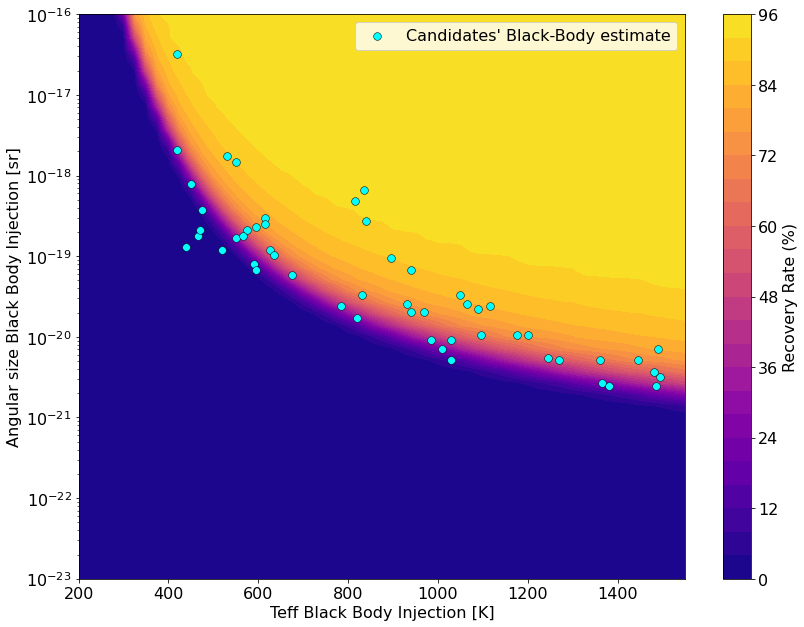

In [346]:
plt.figure(figsize=(12,9))

cf = plt.contourf(range_temp, range_angsize, perc_recov.T*100, cmap=cm.plasma, vmin=0, vmax=100, levels=30)



plt.scatter(params_BB[:,0], 
           params_BB[:,1], s=60, label='Candidates\' Black-Body estimate' , 
            marker='o', edgecolor='k', lw=.5,  color='cyan')


plt.legend()
#plt.xlim(np.min(range_temp),np.max(range_temp))
#plt.ylim(np.min(range_angsize), np.max(range_angsize))
plt.colorbar(cf, label='Recovery Rate (%)')
plt.yscale('log')
plt.xlabel("Teff Black Body Injection [K]")
plt.ylabel("Angular size Black Body Injection [sr]")
plt.tight_layout()
plt.savefig(folder_figs+'recovery_rate.pdf' , bbox_inches="tight", dpi=50)

In [454]:
# plt.figure(figsize=(12,10))

# cf = plt.contourf(range_temp, range_angsize, perc_recov.T*100, cmap=cm.plasma, vmin=0, vmax=100, levels=30)



# er = plt.scatter(params_BB[:,0], 
#            params_BB[:,1], s=45, label='Candidates\' Black-Body estimate' , 
#             #marker='o', edgecolor='k', lw=.5, 
#             c=(fluxs_wBBs[:,-2] - fluxs_obs[:,-2])/fluxs_obs[:,-2], cmap=cm.RdBu, 
#            vmin=-1.5, vmax=1.5)


# plt.legend()
# #plt.xlim(np.min(range_temp),np.max(range_temp))
# #plt.ylim(np.min(range_angsize), np.max(range_angsize))
# plt.colorbar(er, label='(Flux Fit - Flux Obs) / Flux Obs W2')
# plt.yscale('log')
# plt.xlabel("Teff Black Body Injection [K]")
# plt.ylabel("Angular size Black Body Injection [sr]")

In [39]:
def get_SED_integral(idx_targ, T1, ang_size, 
                     sed_folder="/scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/"):
    
        
    gaia_id = df_unwise_merge['source_id'].iloc[idx_targ]
    starname = sed_folder + str(gaia_id)
    
    out_folder = starname

    in_file_og = out_folder + '/BMA.pkl'
    in_file = out_folder +"/BMA_bid.pkl"
    plots_out_folder = starname +"/" #out_folder + "Plots/"

    if os.path.isfile(f"{starname}/BMA.pkl"):
        
        out = pickle.load(open(in_file_og, 'rb'))
        out['star'].irx_filter_mask = np.array([43, 44])
        pickle.dump(out, open(in_file, 'wb'))

        artist = SEDPlotter(in_file, plots_out_folder,pdf=True, ir_excess=True , model='ck04') #ck04, kurucz, phoenix


        #artist.grid = 'phoenix'
        artist.moddir = '/scratch/gcontard/SEDFitting/'
        artist.star.load_grid('ck04')

        flx_sed_fitt, new_w = get_sed_ck04(artist)

        ### 
        bb = BlackBody(temperature=T1*u.K, scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
        wav = new_w * u.micron # 10000 * u.AA
        fluxbb = bb(wav)
        fluxfin = fluxbb.value * ang_size

        ## Integral of SED
        sed_integral = integrate.simpson(flx_sed_fitt/new_w, new_w)
        ## Integral of BB
        bb_integral = integrate.simpson(fluxfin, new_w)
        ## Integral of SED + BB
        sedbb_integral = integrate.simpson(fluxfin + (flx_sed_fitt/new_w), new_w)


        
        return sed_integral, bb_integral, sedbb_integral
    else:
        raise Exception(f"Star idx {idx_targ} (GAIA DR3 {gaia_id}) has not been fitted by ARIADNE")
        

In [40]:
SED_ints, BB_ints, SEDBB_ints, fract_lums = [], [], [], []

for id_ in range(len(idc_candidates)):
    idx_targ = idc_candidates[id_]
    T1, ang_size = params_BB[id_,0], params_BB[id_,1]
    sed_int, bb_int, sedbb_int = get_SED_integral(idx_targ, T1, ang_size)
    SED_ints.append(sed_int)
    BB_ints.append(bb_int)
    SEDBB_ints.append(sedbb_int)
    fract_lums.append(bb_int/sed_int)
    #clear_output(wait=True)


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6502798709139275136/ failed. It might already exist
Creation of 


Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416/ fa

Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/66

In [41]:
fract_lums = np.array(fract_lums)

In [348]:
print(np.min(fract_lums), np.mean(fract_lums), np.max(fract_lums))

0.005359436211296445 0.022021468757718307 0.10329770191664034


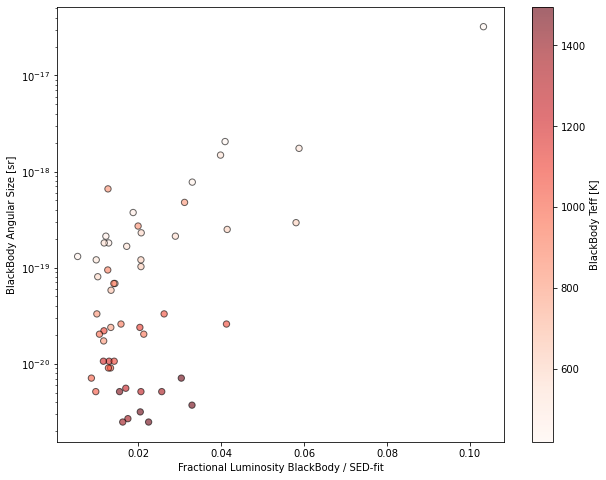

In [88]:
plt.figure(figsize=(10,8))

plt.scatter(np.array(fract_lums), params_BB[:,1],# c='darkblue', 
            c=params_BB[:,0], cmap=cm.Reds, #norm=matplotlib.colors.LogNorm())
            s=40, alpha=.6, label='Candidates', ec='k')
plt.colorbar(label='BlackBody Teff [K]')
plt.xlabel("Fractional Luminosity BlackBody / SED-fit")
plt.ylabel("BlackBody Angular Size [sr]")
plt.yscale('log')
plt.savefig(folder_figs+f'fract_lum_angsize_BB.pdf' , bbox_inches="tight", dpi=50)

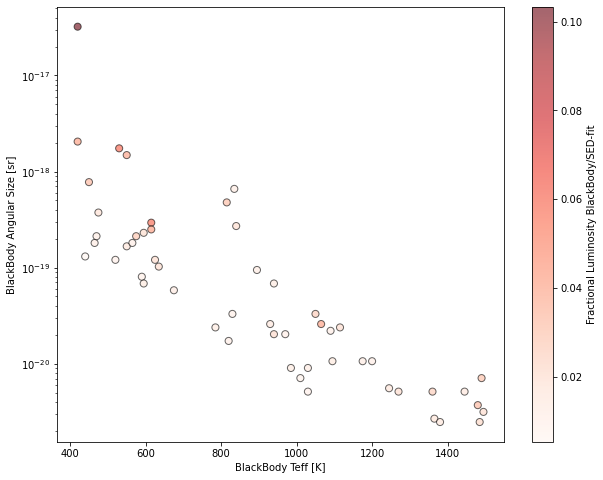

In [89]:
plt.figure(figsize=(10,8))

plt.scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=np.array(fract_lums), cmap=cm.Reds,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=50, alpha=.6, ec='k')
plt.colorbar(label='Fractional Luminosity BlackBody/SED-fit')

plt.ylabel("BlackBody Angular Size [sr]")
plt.xlabel("BlackBody Teff [K]")
plt.yscale('log')
plt.savefig(folder_figs+f'teff_angsize_BB_colorFractLum.pdf' , bbox_inches="tight", dpi=50)

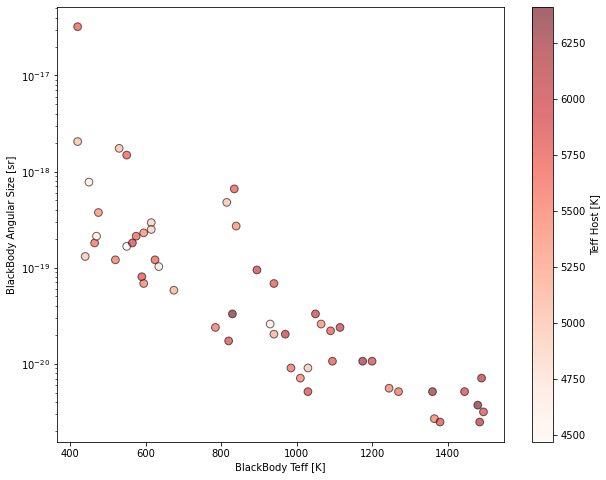

In [90]:
plt.figure(figsize=(10,8))

plt.scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['teff_gspphot'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k')
plt.colorbar(label='Teff Host [K]')
plt.ylabel("BlackBody Angular Size [sr]")
plt.xlabel("BlackBody Teff [K]")
plt.yscale('log')
plt.savefig(folder_figs+f'teff_angsize_BB_colorTeffHost.pdf' , bbox_inches="tight", dpi=50)

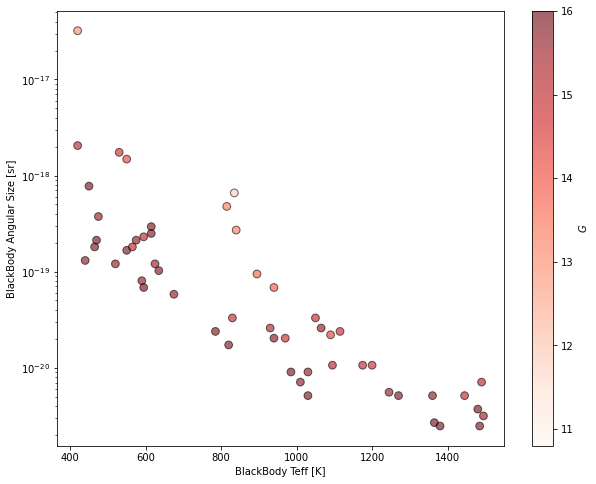

In [91]:
plt.figure(figsize=(10,8))

plt.scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['phot_g_mean_mag'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds, vmin=16, vmax=12,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k')
plt.colorbar(label=r'$G$')
plt.ylabel("BlackBody Angular Size [sr]")
plt.xlabel("BlackBody Teff [K]")
plt.yscale('log')
plt.savefig(folder_figs+f'teff_angsize_BB_colorG.pdf' , bbox_inches="tight", dpi=50)

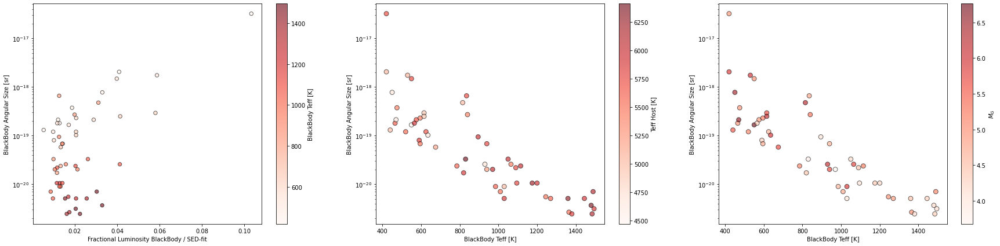

In [92]:
fig, axs = plt.subplots(1,3, figsize=(10*3, 7))

pl = axs[0].scatter(np.array(fract_lums), params_BB[:,1],# c='darkblue', 
            c=params_BB[:,0], cmap=cm.Reds, #norm=matplotlib.colors.LogNorm())
            s=40, alpha=.6, label='Candidates', ec='k')
plt.colorbar(pl, ax=axs[0], label='BlackBody Teff [K]')
axs[0].set_xlabel("Fractional Luminosity BlackBody / SED-fit")
axs[0].set_ylabel("BlackBody Angular Size [sr]")
axs[0].set_yscale('log')


pl = axs[1].scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['teff_gspphot'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k')
plt.colorbar(pl, ax=axs[1] ,label='Teff Host [K]')
axs[1].set_ylabel("BlackBody Angular Size [sr]")
axs[1].set_xlabel("BlackBody Teff [K]")
axs[1].set_yscale('log')

pl = axs[2].scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['M_G'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,# vmin=16, vmax=12,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k')
plt.colorbar(pl, ax=axs[2], label=r'$M_G$')
axs[2].set_ylabel("BlackBody Angular Size [sr]")
axs[2].set_xlabel("BlackBody Teff [K]")
axs[2].set_yscale('log')
plt.savefig(folder_figs+f'BB_triple_plot.pdf' , bbox_inches="tight", dpi=50)

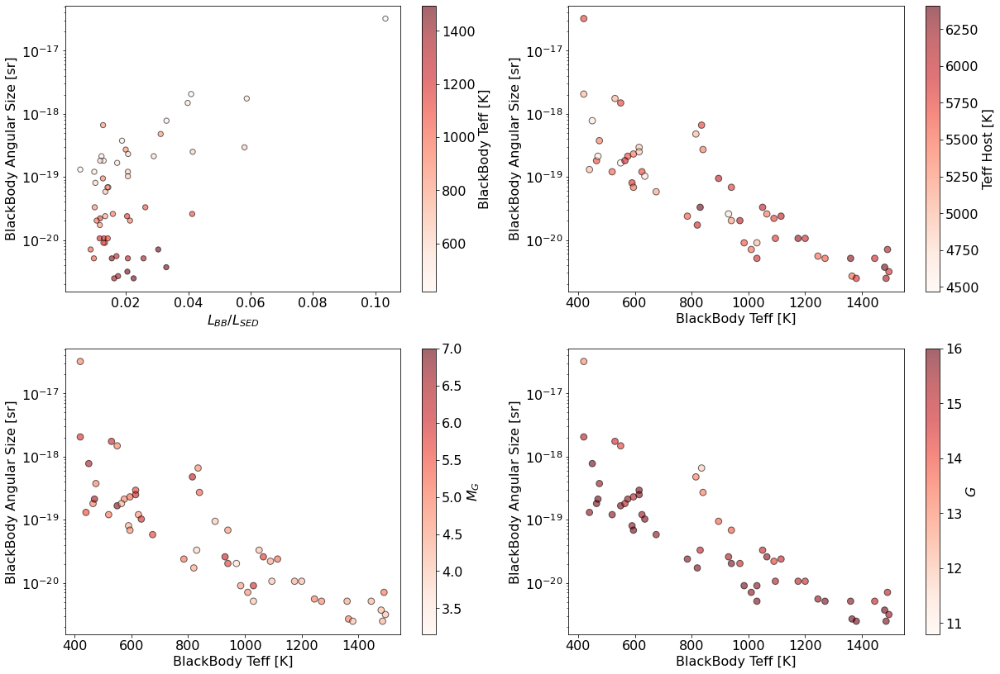

In [356]:
fig, axs = plt.subplots(2,2, figsize=(10*2, 7*2))

pl = axs[0,0].scatter(np.array(fract_lums), params_BB[:,1],# c='darkblue', 
            c=params_BB[:,0], cmap=cm.Reds, #norm=matplotlib.colors.LogNorm())
            s=40, alpha=.6, label='Candidates', ec='k')
plt.colorbar(pl, ax=axs[0,0], label='BlackBody Teff [K]')
axs[0,0].set_xlabel(r"$L_{BB}/L_{SED}$")
axs[0,0].set_ylabel("BlackBody Angular Size [sr]")
axs[0,0].set_yscale('log')


pl = axs[0,1].scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['teff_gspphot'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k')
plt.colorbar(pl, ax=axs[0,1] ,label='Teff Host [K]')
axs[0,1].set_ylabel("BlackBody Angular Size [sr]")
axs[0,1].set_xlabel("BlackBody Teff [K]")
axs[0,1].set_yscale('log')

pl = axs[1,0].scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['M_G'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,# vmin=16, vmax=12,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k', vmin=7, vmax=3.5)
plt.colorbar(pl, ax=axs[1,0], label=r'$M_G$')
axs[1,0].set_ylabel("BlackBody Angular Size [sr]")
axs[1,0].set_xlabel("BlackBody Teff [K]")
axs[1,0].set_yscale('log')

pl = axs[1,1].scatter(params_BB[:,0], params_BB[:,1], #c='darkblue', 
            c=df_unwise_merge['phot_g_mean_mag'].iloc[idc_candidates], #np.array(fract_lums), 
            cmap=cm.Reds,# vmin=16, vmax=12,
            #c=error[m_pr], cmap=cm.Reds, norm=matplotlib.colors.LogNorm())
            s=60, alpha=.6, ec='k', vmin=16, vmax=12)
plt.colorbar(pl, ax=axs[1,1], label=r'$G$')
axs[1,1].set_ylabel("BlackBody Angular Size [sr]")
axs[1,1].set_xlabel("BlackBody Teff [K]")
axs[1,1].set_yscale('log')


plt.savefig(folder_figs+f'BB_quad_plot.pdf' , bbox_inches="tight", dpi=50)

## Plot functions of SED, BB, spectra, images, ...

In [69]:
def plot_SED(idx_targ, axs,
             T1, ang_size,
             sed_folder="/scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/",
             legend=True):

    ra_t, dec_t = df_unwise_merge['ra_2'].iloc[idx_targ], df_unwise_merge['dec_2'].iloc[idx_targ]
    
    gaia_id = df_unwise_merge['source_id'].iloc[idx_targ]
    starname = sed_folder + str(gaia_id)
    out_folder = starname    

    in_file_og = out_folder + '/BMA.pkl'
    in_file = out_folder +"/BMA_bid.pkl"
    plots_out_folder = starname +"/" #out_folder + "Plots/"

    if os.path.isfile(f"{starname}/BMA.pkl"):

        out = pickle.load(open(in_file_og, 'rb'))
        out['star'].irx_filter_mask = np.array([43, 44])
        pickle.dump(out, open(in_file, 'wb'))

        artist = SEDPlotter(in_file, plots_out_folder,pdf=True, ir_excess=True , model='ck04') #ck04, kurucz, phoenix

        artist.moddir = '/scratch/gcontard/SEDFitting/'
        artist.star.load_grid('ck04')

        flx_sed_fitt, new_w = get_sed_ck04(artist)


        n_filt = artist.star.used_filters.sum()
        n_pars = int(len(artist.theta) - n_filt)

        mask = artist.star.filter_mask
        mags = artist.star.mags[mask]

        filters = artist.star.filter_names[mask]
        wave = artist.star.wave[mask]
        flxs_obs = []
        for i_, th in enumerate(artist.theta[n_pars:]):
            mag = mags[i_]
            filt = filters[i_]
            _flx, er = mag_to_flux(mag, th, filt) # erg / cm2 / s / um
            flxs_obs.append(_flx)
            artist.theta[n_pars + i_] = er

        
        flux_owntab = []
        for phot_ in range(len(list_photo)):
            flux_owntab.append(mag_to_flux(df_unwise_merge[list_photo[phot_]].iloc[idx_targ],
                                          0, bands_ARIADNE[phot_])[0])


        predi_RF = []
        for wi in range(1,3):
            predi_RF.append(mag_to_flux(df_unwise_merge[f'hatW{wi}_pred'].iloc[idx_targ],
                                       0, f'WISE_RSR_W{wi}')[0])


        axs.set_ylabel('Flux [erg s-1 cm-2 um-1]')
        axs.set_yscale('log')
        axs.set_xscale('log')
        axs.set_xlabel("Wavelength [µm] ")

        

        axs.plot(new_w, flx_sed_fitt/new_w, '-.', c='darkred', lw=2, alpha=.6,
                 label='SED Fitting (w/o W1-4)')

        
        bb = BlackBody(temperature=T1*u.K, scale= 1 * (u.erg / (u.cm * u.cm * u.s * u.um * u.sr)))
        wav = new_w * u.micron # 10000 * u.AA
        fluxbb = bb(wav)
        fluxfin = fluxbb.value * ang_size

        sed_integral = integrate.simpson(flx_sed_fitt/new_w, new_w)
        bb_integral = integrate.simpson(fluxfin, new_w)
        frac_l = bb_integral / sed_integral
        
        label_bb = "BlackBody-fit: Teff: {}K, \n ang-size: {:.3e} \n ".format(T1,
                                                                                   ang_size)
        label_bb = label_bb + r"$L_{BB}/L_{SED}$:"
        label_bb = label_bb + "{:.3f}".format(frac_l)
        
        axs.plot(new_w, fluxfin, '--', color='darkgrey', lw=1.9, alpha=.4,
          label=label_bb)

        axs.plot(new_w, fluxfin +flx_sed_fitt/new_w, color='k', lw=1.8, alpha=.6, 
                 label='BlackBody + SED' )

        axs.scatter(wavelengths_ariadne[-4:], flux_owntab[-4:],
            c='firebrick', marker='*', s=50, label="unWISE/AllWISE")#, label='Outlier deficit')


        axs.scatter(wave, flxs_obs, s=50, marker='^', c='goldenrod',
                    label='Observations used for SED-fitting')

        axs.scatter(wavelengths_ariadne[-4:-2], predi_RF, s=20, marker='o',
                   c='darkblue', label=r"$\widehat{W}$ prediction")


        axs.set_ylim(1e-15, np.max(flx_sed_fitt/new_w)+1e-10) #np.min(flx_sed_fitt/new_w)
        axs.set_xlim(np.min(new_w), np.max(wavelengths_ariadne)+20) #np.min(flx_sed_fitt/new_w)

    
        if legend:
            axs.set_title(f"Gaia DR3 {df_unwise_merge['source_id'].iloc[idx_targ]}")
#             axs.text(wavelengths_ariadne[-2] -.5, 3e-15, f"{df_unwise_merge['ph_qual'].iloc[idx_targ][2]}",
#                                               color='darkred', fontsize='medium')
#             axs.text(wavelengths_ariadne[-1] -.5,  3e-15, f"{df_unwise_merge['ph_qual'].iloc[idx_targ][3]}",
#                                               color='darkred', fontsize='medium')
            axs.legend(#bbox_to_anchor=(.8, 1),
                   loc="upper right", fontsize=14)#, facecolor='white', framealpha=1)#loc='lower left', ncol=2)
        else:
            axs.text(0.25, 3e-15, f"Gaia DR3 {gaia_id}", color='k', fontsize='medium')
            legend_elements = [Line2D([0], [0], color='darkgrey', lw=1.9, alpha=.4, ls='--', 
                        label=label_bb)]
            axs.legend(handles=legend_elements, loc='upper right')
        axs.text(wavelengths_ariadne[-2] -.5, flux_owntab[-2]+ 1e-13, f"{df_unwise_merge['ph_qual'].iloc[idx_targ][2]}",
                                          color='darkred', fontsize='medium')
        axs.text(wavelengths_ariadne[-1] -.5, flux_owntab[-1]+ 1e-13, f"{df_unwise_merge['ph_qual'].iloc[idx_targ][3]}",
                                          color='darkred', fontsize='medium')
    else:
        raise Exception(f"Star idx {idx_targ} (GAIA DR3 {gaia_id}) has not been fitted by ARIADNE")
         


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.


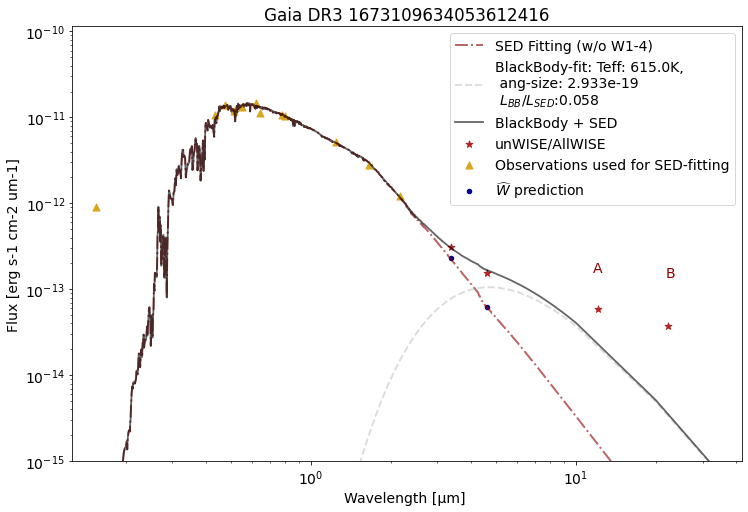

In [70]:
id_ = np.where(fract_lums>0.05)[0][0]


fig, ax = plt.subplots(1,1,figsize=(12,8))
plot_SED(idc_candidates[id_], ax,
                                 params_BB[id_, 0], params_BB[id_,1], legend=True)


plt.savefig(folder_figs+f"SED_BB_plot_{df_unwise_merge['source_id'].iloc[id_]}.pdf", bbox_inches="tight", dpi=50)

### Plot SED + Spectra + images

In [47]:

class MyMultiAbsolutePlotter(MultiAbsolutePlotter):

    def plot_multi_absolute(self, fig, ax, color='k',lw=1, showlines=False):
        spectra_class = self.spectra_class
        spectra_df = self.spectra
        
        for spectrum in spectra_df.to_dict('records'):
            x, y, e = self._get_inputs(spectrum)
            ax.plot(x, y, lw=lw, color=color, alpha=0.95)#, label=spectrum['source_id'])
            
            
        ax.set_xlabel(spectra_class.get_position_label())
        ax.set_ylabel(spectra_class.get_flux_label())
        
        if showlines:
            emission_lines_name = [r'H-$\alpha$']#, r'H-$\beta$',  r'OIII', r'SII']#,'SII']
            emiss_wave = [656.46]#, 486.27, 500.82, 671.82]#, 673.27]
            cmap = plt.get_cmap('tab10', 10)

            for i in range(len(emission_lines_name)):
                ax.axvline(emiss_wave[i], label=emission_lines_name[i], color=cmap(i), ls='--', lw=.8)
            ax.legend(fontsize=10, ncol=2)

In [48]:
def string_radec(df_, loc):
    return str(df_['ra_2'].loc[loc]) + " " + str(df_['dec_2'].loc[loc])

In [74]:

def plot_SED_spectra_img(gs0, fig, df_, id_,  T1, ang_size,                          
                sed_folder="/scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/"):

    sourceid = df_['source_id'].iloc[id_]
 
    
    gs = GridSpecFromSubplotSpec(3, 3, subplot_spec=gs0, wspace=.0, hspace=.18)
    
    ax_sed = fig.add_subplot(gs[:2, :2])
 
    plot_SED(id_, ax_sed, T1, ang_size, sed_folder, legend=False)
    
    arcmin_size_targ = 3

    axs_ = [fig.add_subplot(gs[0, 2]), fig.add_subplot(gs[1,2]), fig.add_subplot(gs[2,2])]

    label_misss =['DSS', r"$W1$", r'$W2$']
    name_misss = [['DSS'],['WISE 3.4'], ['WISE 4.6']]
    
    for i in range(3):
        axs = axs_[i]
        name_miss = name_misss[i]
        paths = SkyView.get_images(position=string_radec(df_unwise_merge,id_),
                                   coordinates='ICRS', grid=True, gridlabels=True,
                                 #  radius = 5 * u.arcmin,
                               #    width = u.Quantity(5, unit=u.arcmin), height=u.Quantity(5, unit=u.arcmin),
                              #    width= 5 * u.arcmin, height= 5 * u.arcmin    ,
                                   survey=name_miss)

        ## Get recut  [61:-61]

        if len(paths)>0:
            img_ = paths[0][0].data
            pxlscale = 0
            shape_img_x, shape_img_y = img_.shape[0], img_.shape[1]

            #assert img_.shape[0]==img_.shape[1]


            for ik in paths[0][0].header['COMMENT']:
                if ik.split(':')[0]=='PixelScale':
                    pxlscale = float(ik.split(':')[1].split("\"")[0].strip())

            totalarcmin_x, totalarcmin_y = shape_img_x * pxlscale / 60., shape_img_y * pxlscale / 60.
            px_to_remove_x = int((shape_img_x - arcmin_size_targ / (totalarcmin_x/shape_img_x))/2)
            px_to_remove_y = int((shape_img_y - arcmin_size_targ / (totalarcmin_y/shape_img_y))/2)
            assert px_to_remove_x>=0
            assert px_to_remove_y>=0

            img_ = img_[px_to_remove_x:-px_to_remove_x,px_to_remove_y:-px_to_remove_y]
            #print(px_to_remove)
            L, H = np.percentile(img_, [2.5, 97.5])

            m_ = axs.imshow(img_,cmap=cm.hot, #vmin=L, vmax=(3*H-2*L),
                                interpolation='nearest', origin='lower')
            axs.scatter(img_.shape[0]/2, img_.shape[1]/2, 
                                                       s=450, facecolors='none', edgecolors='cyan')
            axs.set_title(f"{name_miss[0]}", y=0.98)
            plt.colorbar(m_, ax=axs,fraction=0.046, pad=0.04)#, extend='both')

            onearcmin_x = 1/(totalarcmin_x/shape_img_x)
            axs.plot([ img_.shape[0]/2 - onearcmin_x/2, 
                         img_.shape[0]/2 + onearcmin_x/2], [13, 13], color='cyan', marker='|', lw=1)
            axs.text(img_.shape[0]/2 , 1, "1\'", color='cyan')
            #axs[2].tight_layout()
            axs.set_title(f"{label_misss[i]}")
            axs.axis('off')
    
    ## BP RP
    d_,neighb_ = nbrs_valid_notcol.kneighbors(ft_neighbors_resc_notcol[id_].reshape(1,-1)) #dsits_[k], items_[k]
    #print(neighb_)
    d_ = d_[0]
    neighb_ = neighb_[0]
    sourceid_neighb_ = []
    try:
        #fig, ax = plt.subplots(ncols=2, figsize=(12, 4))
        ax = fig.add_subplot(gs[2,0:-1]) #, fig.add_subplot(gs[2,1])]

        for i in neighb_:
            #print(f"Gaia DR3 {subdf['source_id'][int_tr:].iloc[i]}")
            #ra_t, dec_t = subdf['ra_2'][int_tr:].iloc[i], subdf['dec_2'][int_tr:].iloc[i]
            sourceid_neighb_.append(df_['source_id'].iloc[i])

        print(len(neighb_))
        converted_spectra, sampling = calibrate(sourceid_neighb_)
        plotter = MyMultiAbsolutePlotter(converted_spectra, sampling, #,multi=True,
                                         show_plot=True,  output_path=None, output_file=None,
                 _format='jpg', legend=False, save_file=None)
        
        plotter.plot_multi_absolute(fig, ax, color='darkgrey', lw=0.8)

        converted_spectra, sampling = calibrate([df_['source_id'].iloc[id_]])
        plotter = MyMultiAbsolutePlotter(converted_spectra, sampling,  # multi=True,
                                         show_plot=True,  output_path=None, output_file=None,
                 _format='jpg', legend=False, save_file=None)
        plotter.plot_multi_absolute(fig, ax, color='r', showlines=True, lw=1.2)

        
    except Exception as e:
        print(f"Something happened with {df_['source_id'].iloc[id_]} for BP RP")
        #raise Exception(e)
        
        
    #gs.suptitle(f"Gaia DR3 {sourceid}")
    
    #plt.tight_layout()
    
    

In [142]:
df_unwise_merge['ext_flag'].iloc[idc_candidates]

219864     0
368011     0
368708     0
503270     0
619181     0
651479     0
789805     0
790296     0
804637     0
810552     0
810763     0
838263     0
933534     0
1052400    0
1074135    0
1091760    0
1236418    0
1359383    0
1408714    0
1421075    0
1672694    0
1877708    0
1943110    0
1989404    0
2133114    0
2213120    0
2251144    0
2268006    0
2346301    0
2414089    0
2448035    0
2739731    0
2777417    0
3002866    0
3065203    0
3424623    0
3515122    0
3555168    0
3688258    1
3764076    0
3841620    0
3862440    0
3880628    0
3945643    0
4100894    0
4133853    0
4281707    0
4451297    0
4472208    0
4483284    0
4712086    0
4782484    0
4850508    0
Name: ext_flag, dtype: int64

In [72]:
# xsize,ysize=12,9
# nbx,nby = 3 , 5
# fig = plt.figure(figsize=(xsize*nbx, ysize*nby))
# plt.rcParams.update({'font.size': 14})


# gs0 = GridSpec(nby, nbx, figure=fig,wspace=.2, hspace=.2)


# for xi in range(nbx):
#     for yj in range(nby):
        
        
#         plot_SED_spectra_img(gs0[yj,xi], fig,
#                                 df_unwise_merge, 
#                                             idc_candidates[xi*nby+yj], 
#                                                params_BB[xi*nby+yj,0], params_BB[xi*nby+yj,1],
#                                                saving_folder)
# plt.show()
    


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5085509597958589184//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3462639162734302464//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6502798709139275136/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6502798709139275136//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6836154657401562112/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6836154657401562112//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2886776063720502144/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2886776063720502144//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6705842630930258816/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6705842630930258816//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/387557473467906432/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/387557473467906432//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3889059420143391744/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3889059420143391744//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

Something happened with 3889059420143391744 for BP RP

Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2144442781092733952/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2144442781092733952//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /31 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1406113335695903872/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1406113335695903872//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1815157499757887488/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1815157499757887488//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1704765570250298496/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1704765570250298496//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4710409831751731712/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4710409831751731712//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3772493492333504768/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3772493492333504768//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1245496161713883904/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1245496161713883904//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

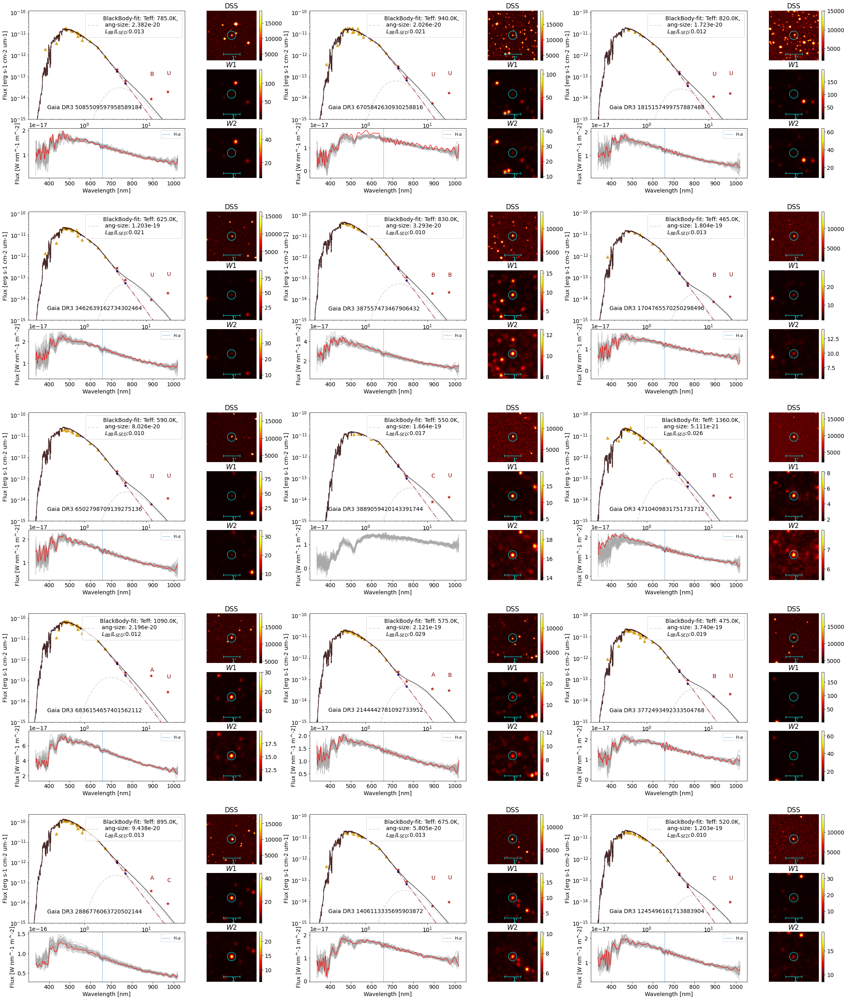


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3017430205815280384/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3017430205815280384//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/302802517288053632/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/302802517288053632//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3221650540619783040/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3221650540619783040//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4420716452299884288/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4420716452299884288//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /23 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6830573291565067648/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6830573291565067648//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/907249585730646016/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/907249585730646016//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1800491354668025344//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1813144053445574784//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1673109634053612416//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6578449850774068224/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6578449850774068224//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5260430146906778624/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5260430146906778624//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/709086185604311552/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/709086185604311552//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6809873615078147456/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6809873615078147456//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6359523376149191936/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6359523376149191936//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6770961795500483200/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6770961795500483200//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


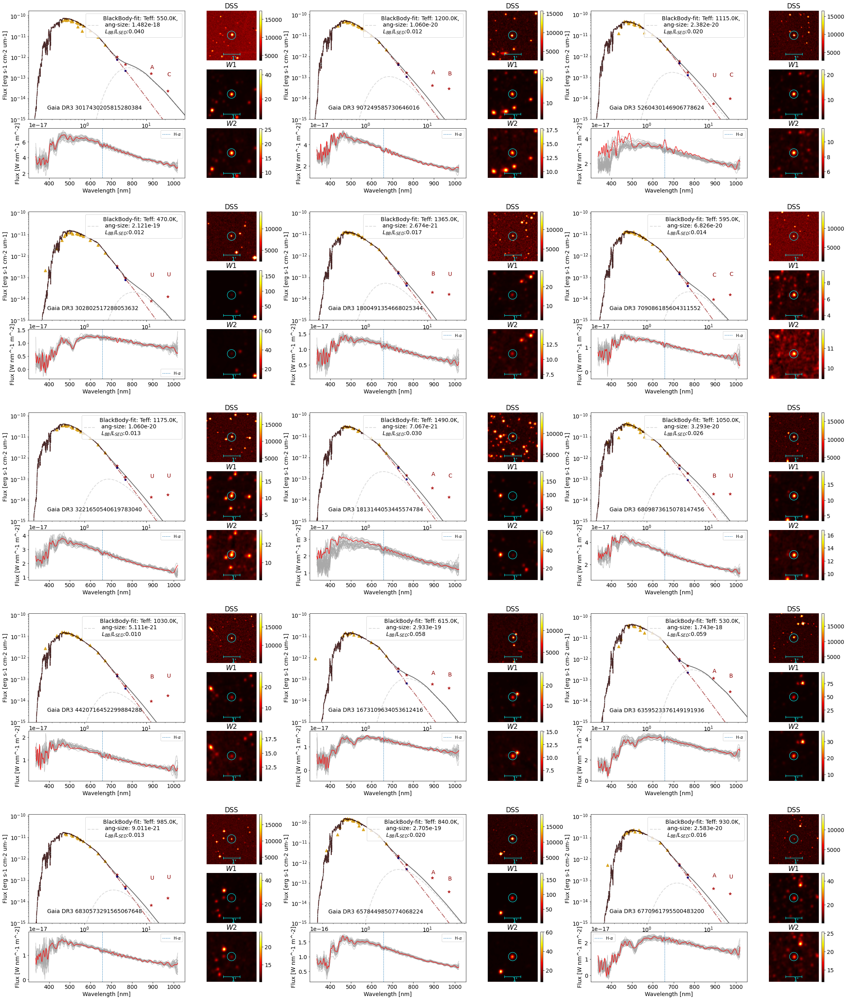


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6405864801961715968/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6405864801961715968//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/352632796577124992/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/352632796577124992//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3004530769758177280/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3004530769758177280//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6877999557398569600/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6877999557398569600//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /28 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2916199883936404864/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2916199883936404864//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/344897216879901312/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/344897216879901312//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6727198140355736448/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6727198140355736448//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1052596673505827840/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1052596673505827840//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3183786280737192704/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/3183786280737192704//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /26 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2256421065353454464/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2256421065353454464//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1938237827799536512/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/1938237827799536512//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5456960634826855168/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5456960634826855168//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /31 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2770417668730232192//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /29 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4941459109269026560//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6612104218072332160/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6612104218072332160//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

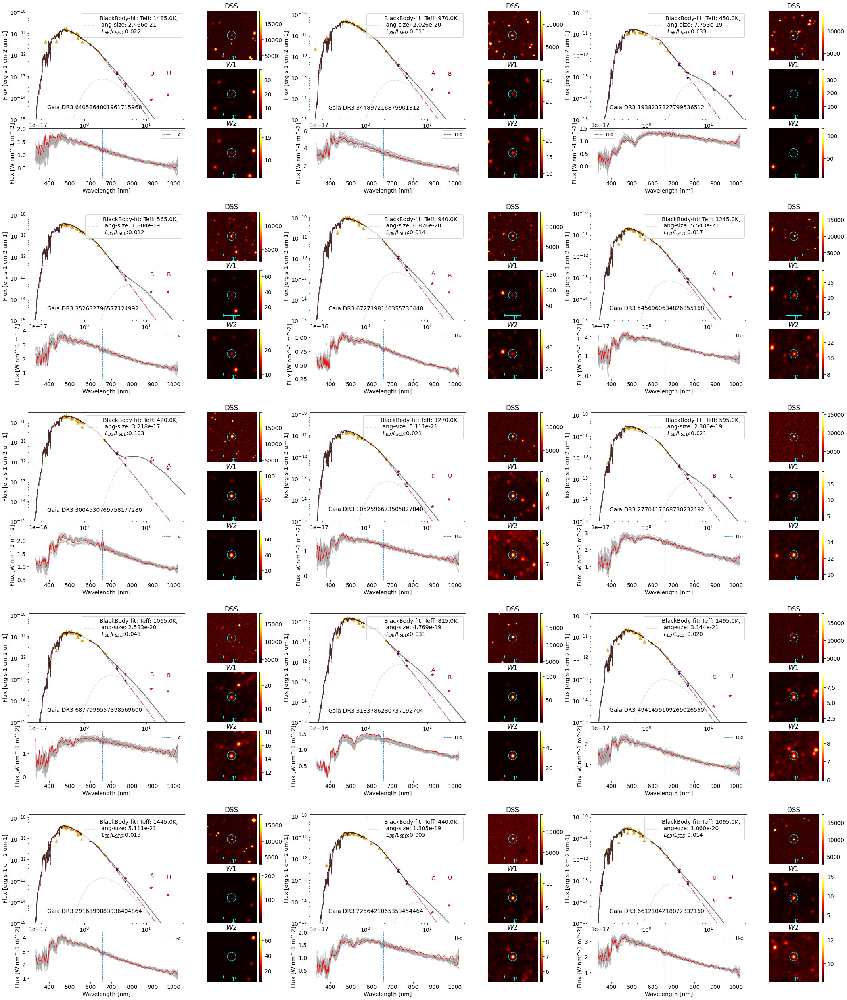


Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2896314189652820224/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2896314189652820224//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5460701448263827968/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/5460701448263827968//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /30 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2095551965773599360/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2095551965773599360//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /27 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6492528514620768896/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6492528514620768896//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2942418533272205312/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/2942418533272205312//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4635203064613724288/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/4635203064613724288//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6376307386787122560/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/6376307386787122560//histograms failed. It might already exist
Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                         0/1 [00:00<?, ?spec/s]

Done! Output saved to path: ./output_spectra.csv
Initializing plotter.

Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/619195165798222208/ failed. It might already exist
Creation of the directory /scratch/gcontard/infrared/FitARIADNE_BlackBody_8foldsCandidates/SED_noW1W2/619195165798222208//histograms failed. It might already exist


Grid btsettl loaded.

Plotter initialized.

Grid ck04 loaded.
31


                                                          /31 [00:00<?, ?spec/s]

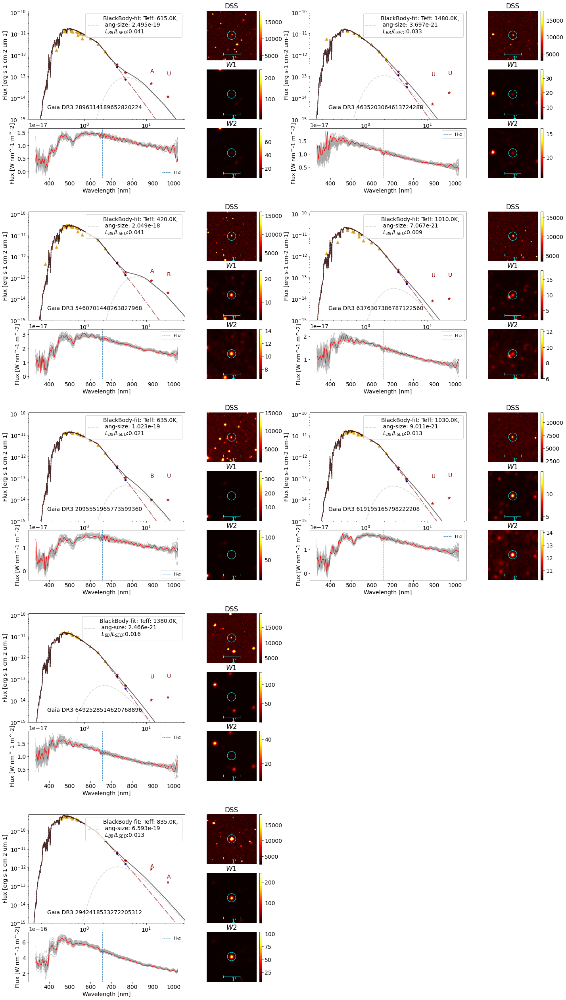

In [76]:

xsize,ysize=12,9
nbx,nby = 3 , 5

for k in range(0, len(idc_candidates), nbx*nby):
    #contrained_layout=True) #figsize=(12*2,9*2))#, constrained_layout=True)
    #gs_source = GridSpec(2, 2, figure=fig)#, width_ratios=[1,1,1.], wspace=.0, hspace=.15)
    
    fig = plt.figure(figsize=(xsize*nbx, ysize*nby))
    plt.rcParams.update({'font.size': 14})


    gs0 = GridSpec(nby, nbx, figure=fig,wspace=.2, hspace=.2)


    for xi in range(nbx):
        for yj in range(nby):

            if k + xi*nby + yj < len(idc_candidates):
                
                plot_SED_spectra_img(gs0[yj,xi], fig,
                                df_unwise_merge, 
                                            idc_candidates[k+xi*nby+yj], 
                                               params_BB[k+xi*nby+yj,0], params_BB[k+xi*nby+yj,1],
                                               saving_folder)
    #plt.tight_layout()
    plt.savefig(f'{folder_figs}SED_img_spectra_{int(k/(nbx*nby))}.pdf',
                dpi=60 ,bbox_inches="tight")
    plt.show()
    plt.close()

## Plot Candidates and Other Catalogs in HR

In [106]:
def get_DR3_from_bib(bibc, verbose=False):
    ## Return source id in DR3 and the list of all obj
    
    objbibob = Simbad.query_bibobj(bibc)
    ## for all objects, get their alt-id, and check for Gaia DR3. Add to the list
    objall_dr3 = {} # Dic : Key DR3, Val OG name

    for name in objbibob['MAIN_ID']:
        obids = Simbad.query_objectids(name)
        nfound = False
        for n in obids['ID']:
            if "Gaia DR3" in n:
                objall_dr3[int(n.split(" ")[2])] = name
                nfound = True
                break
        if verbose:
            if nfound:
                print(f"{name} was FOUND with match in DR3")
            else:
                print(f"{name} was not found with match in DR3")
    
    objdr3 = list(objall_dr3.keys())
    print(f"Out of {len(objbibob['MAIN_ID'])} objects, {len(objdr3)} were found with a Gaia DR3 match")
    return objdr3, objbibob

In [106]:
from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
Vizier.ROW_LIMIT = -1



In [108]:
def check_sourceid_grabdata(list_sc_id):
    # Return sourceid of the prelimcut, sourceid of the final cut, and temp_df of the list_sc_id
    temp_df = df_unwise_merge[np.isin(df_unwise_merge['source_id'],list_sc_id)]
    
    print(f"{len(temp_df)} in the full sample")
    
    m_temp = temp_df['mask_errhat']
    print(f"{np.sum(m_temp)} after hatW cut")
    m_temp = temp_df['mask_errKMAD']
    print(f"{np.sum(m_temp)} after kMAD cut")
    m_temp = temp_df['mask_MADFold']
    print(f"{np.sum(m_temp)} after MADFold cut")
    
    prelim_cut = temp_df['mask_errhat'] & temp_df['mask_errKMAD'] & temp_df['mask_MADFold']
    
    m_temp = temp_df['mask_errhat'] & temp_df['mask_errKMAD'] & temp_df['mask_MADFold']
    print(f"{np.sum(m_temp)} after all prelim cut")
    print("We are not redownloading stuff because only investigating \
          \n the ones that are ACTUALLY flagged in the first place too \n ")
    ang_sep_tresh = 0.0014
    crowd = (temp_df['angsep_crowding_unwise']==0) | ((temp_df['angsep_crowding_unwise'] > ang_sep_tresh) )
    crowd = crowd & (temp_df['angsep_crowding_tmass']==0) | ((temp_df['angsep_crowding_tmass'] > ang_sep_tresh) )
    crowd = crowd & (temp_df['angsep_crowding_gaia']==0) | ((temp_df['angsep_crowding_gaia'] > ang_sep_tresh) )

    m_temp = m_temp & crowd
    print("Crowding cut at 5 arcsecond & {}".format(np.sum(m_temp)))
    m_temp = m_temp & (temp_df['score_FOM'] > 4)
    print("FoM > 4 cut & {}".format(np.sum(m_temp)))
    
    ## Mask propermotion
    x0,x1 = 11, 15.5
    y0,y1 = 10, 30.
    slope = (y1-y0)/(x1-x0)
    b = y0 - slope*x0

    m_temp = m_temp & ((temp_df['phot_g_mean_mag'] * slope + b) > np.abs(temp_df['pmra']-temp_df['pmracat'] * 1000))
    m_temp = m_temp & ((temp_df['phot_g_mean_mag'] * slope + b) > np.abs(temp_df['pmdec']-temp_df['pmdeccat'] * 1000))
    print("Proper-Motion disagreement cut & {}".format(np.sum(m_temp)))

    m_temp = m_temp & (np.abs(temp_df['diff_allwise_unw_corrected_W2'])<.15) & (np.abs(temp_df['diff_allwise_unw_corrected_W1'])<.15)
    print(r"Disagreement AllWISE/unWISE cut & {}".format(np.sum(m_temp)))


    m_temp = m_temp & (temp_df['mean_meddistneighb'] < .1)
    print(r"Mean Distance k-NN < .1 & {}".format(np.sum(m_temp)))

    m_temp = m_temp & (np.abs( temp_df['b']) > 10.)
    print(r"abs(b) > 10 & {}".format(np.sum(m_temp)))
    
    _single_star = (temp_df['non_single_star']==0)
    _nonsingle_star = (temp_df['non_single_star']!=0)


    _non_binaries = ~((_nonsingle_star) | (temp_df['eclip_bin_simbad']))

    m_temp = m_temp & mask_non_binaries
    print(r"Removing binaries (Gaia, Simbad) & {}".format(np.sum(m_temp)))

    m_temp = m_temp & ~(temp_df['duplicated_source'])
    print(r"Removing duplicated sources & {}".format(np.sum(m_temp)))

    prelim_cut = temp_df['source_id'][prelim_cut].values
    m_temp = temp_df['source_id'][m_temp].values
    #del temp_df
    return prelim_cut, m_temp, temp_df

In [778]:
list_bibobs = ['2021ApJ...910...27M', '2014MNRAS.437..391C', '2017AJ....153..165T',
              '2016ApJS..225...15C', '2013ApJ...775...55B', #Maybe discard?
               '2020ApJ...893...56M',
              '2017ApJ...837...15D', 
               #'J/MNRAS/471/770/table3' , 
               '2017MNRAS.471..770M', #
                '2019AJ....157..159A', '2015ApJ...813...29S'
              ]





titles_ = ['Moor et al, 2021 (EDD)', 'Sun-Like stars (2014)',
          'Collision of Terrestrial World (Extreme MIR excess)', 'Comprehensive Census of IR-exc',
          'Spitzer IR excess', 'T-tauri Manzo 2020', 'WISE IR excess main sequence 2017', 'Gaia DR1 excess',
          'Herbig Arun 2019', 'Cepheids']

In [711]:
for l in list_bibobs:
    obj = Vizier.get_catalogs(l) 
    
    print(f"{l} : {len(obj)}")
    if len(obj)>0:
        print(obj)
    print("----")

2021ApJ...910...27M : 0
----
2014MNRAS.437..391C : 1
TableList with 1 tables:
	'0:J/MNRAS/437/391/table1' with 21 column(s) and 197 row(s) 
----
2017AJ....153..165T : 2
TableList with 2 tables:
	'0:J/AJ/153/165/table4' with 113 column(s) and 584 row(s) 
	'1:J/AJ/153/165/fig10' with 8 column(s) and 15 row(s) 
----
2016ApJS..225...15C : 4
TableList with 4 tables:
	'0:J/ApJS/225/15/table3' with 22 column(s) and 505 row(s) 
	'1:J/ApJS/225/15/table4' with 22 column(s) and 1257 row(s) 
	'2:J/ApJS/225/15/table5' with 68 column(s) and 1724 row(s) 
	'3:J/ApJS/225/15/refs' with 4 column(s) and 246 row(s) 
----
2013ApJ...775...55B : 3
TableList with 3 tables:
	'0:J/ApJ/775/55/table1' with 15 column(s) and 546 row(s) 
	'1:J/ApJ/775/55/table2' with 22 column(s) and 225 row(s) 
	'2:J/ApJ/775/55/refs' with 5 column(s) and 55 row(s) 
----
2020ApJ...893...56M : 2
TableList with 2 tables:
	'0:J/ApJ/893/56/table1' with 18 column(s) and 9 row(s) 
	'1:J/ApJ/893/56/table5' with 25 column(s) and 835 row(s) 


In [785]:
# #allobj,#dr3match, #objin4.9M, #prelimcut, #finalcut
table_ = []
prelims_, finals_ = [], []
temp_dfs = []
for i in range(len(list_bibobs)):
    print(f"{list_bibobs[i]}:  {titles_[i]}")
    dr3scid, allobj = get_DR3_from_bib(list_bibobs[i]) #Return source id in DR3 and the list of all obj
    
    
    #Return sourceid of the prelimcut, sourceid of the final cut, and temp_df of the list_sc_id
    prelimcutid, finalcutid, temp_df = check_sourceid_grabdata(np.array(dr3scid))
    
    table_.append([len(allobj), len(dr3scid), len(temp_df), len(prelimcutid), len(finalcutid)])
    prelims_.append(prelimcutid)
    finals_.append(finalcutid)
    temp_dfs.append(temp_df)
    print("===============\n")

2021ApJ...910...27M:  Moor et al, 2021 (EDD)
Out of 45 objects, 23 were found with a Gaia DR3 match
5 in the full sample
5 after hatW cut
5 after kMAD cut
5 after MADFold cut
5 after all prelim cut
We are not redownloading stuff because only investigating           
 the ones that are ACTUALLY flagged in the first place too 
 
Crowding cut at 5 arcsecond & 3
FoM > 4 cut & 3
Proper-Motion disagreement cut & 2
Disagreement AllWISE/unWISE cut & 2
Mean Distance k-NN < .1 & 1
abs(b) > 10 & 1
Removing binaries (Gaia, Simbad) & 1
Removing duplicated sources & 1

2014MNRAS.437..391C:  Sun-Like stars (2014)
Out of 205 objects, 199 were found with a Gaia DR3 match
1 in the full sample
0 after hatW cut
0 after kMAD cut
1 after MADFold cut
0 after all prelim cut
We are not redownloading stuff because only investigating           
 the ones that are ACTUALLY flagged in the first place too 
 
Crowding cut at 5 arcsecond & 0
FoM > 4 cut & 0
Proper-Motion disagreement cut & 0
Disagreement AllWISE/unWI

In [780]:
for i in range(len(list_bibobs)):
    str_ = "%" + list_bibobs[i] + "\n " + titles_[i]
    for j in range(1,len(table_[i])):
        str_ += f' & {table_[i][j]}'
    str_ += " \\\\"
    print(str_)

%2021ApJ...910...27M
 Moor et al, 2021 (EDD) & 23 & 5 & 5 & 1 \\
%2014MNRAS.437..391C
 Sun-Like stars (2014) & 199 & 1 & 0 & 0 \\
%2017AJ....153..165T
 Collision of Terrestrial World (Extreme MIR excess) & 564 & 0 & 0 & 0 \\
%2016ApJS..225...15C
 Comprehensive Census of IR-exc & 1705 & 18 & 1 & 0 \\
%2013ApJ...775...55B
 Spitzer IR excess & 542 & 0 & 0 & 0 \\
%2020ApJ...893...56M
 T-tauri Manzo 2020 & 784 & 1 & 0 & 0 \\
%2017ApJ...837...15D
 WISE IR excess main sequence 2017 & 210 & 6 & 0 & 0 \\
%2017MNRAS.471..770M
 Gaia DR1 excess & 22 & 0 & 0 & 0 \\
%2019AJ....157..159A
 Herbig Arun 2019 & 121 & 0 & 0 & 0 \\
%2015ApJ...813...29S
 Cepheids & 27 & 0 & 0 & 0 \\


In [783]:
finals_[0]

#

array([2942418533272205312])

In [793]:
objbibob = Simbad.query_bibobj('2013ApJ...775...55B')
objbibob

MAIN_ID,RA,DEC,RA_PREC,DEC_PREC,COO_ERR_MAJA,COO_ERR_MINA,COO_ERR_ANGLE,COO_QUAL,COO_WAVELENGTH,COO_BIBCODE,SCRIPT_NUMBER_ID
,"""h:m:s""","""d:m:s""",,,mas,mas,deg,,,,
object,str13,str13,int16,int16,float32,float32,int16,str1,str1,object,int32
HD 224873,00 01 23.6644,+39 36 38.557,9,9,9.060,5.100,90,A,O,2007A&A...474..653V,1
HD 225200,00 04 20.3171,-29 16 07.760,14,14,0.037,0.023,90,A,O,2020yCat.1350....0G,1
HD 225239,00 04 53.7246,+34 39 34.801,14,14,0.800,0.219,90,A,O,2018yCat.1345....0G,1
HD 105,00 05 52.5447,-41 45 11.044,14,14,0.013,0.014,90,A,O,2020yCat.1350....0G,1
HD 142,00 06 19.1753,-49 04 30.671,14,14,0.017,0.021,90,A,O,2020yCat.1350....0G,1
HD 166,00 06 36.7840,+29 01 17.412,14,14,0.018,0.012,90,A,O,2020yCat.1350....0G,1
HD 203,00 06 50.0863,-23 06 27.145,14,14,0.032,0.018,90,A,O,2020yCat.1350....0G,1
HD 377,00 08 25.7454,+06 37 00.489,14,14,0.026,0.018,90,A,O,2020yCat.1350....0G,1


In [792]:
objbibob = Vizier.get_catalogs('2013ApJ...775...55B')
objbibob[1]

recno,HIP,Vmag,Jmag,Hmag,Ksmag,r_Phot,T_,FIRAC,e_FIRAC,F24,e_F24,F70,e_F70,RJ,Excess,e_Excess,l_Tcold,Tcold,Twarm,fcold,fwarm
,,mag,mag,mag,mag,,K,Jy,Jy,mJy,mJy,mJy,mJy,um2 Jy,mJy,mJy,,K,K,,
int32,int32,float32,float32,float32,float32,str8,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,str1,int16,int16,float32,float32
1,345,6.39,6.28,6.25,6.26,,8843,--,--,35.70,0.38,97.24,5.35,11.90,94.90,5.35,,53,185,9.420,4.560
2,490,7.53,6.46,6.19,6.12,,5923,--,--,28.39,0.30,152.70,9.71,14.20,149.90,9.71,,48,--,42.000,--
3,544,6.13,4.73,4.63,4.31,,5405,--,--,159.10,1.58,105.80,6.32,72.60,91.57,6.33,,50,126,4.990,4.780
4,560,6.19,5.45,5.33,5.24,,6635,--,--,117.20,1.12,67.08,7.06,31.60,60.89,7.06,,129,--,18.400,--
5,682,7.59,6.42,6.15,6.12,,5809,--,--,36.49,0.39,170.60,10.62,14.70,167.70,10.60,<,45,119,47.300,11.600
6,1031,7.23,5.85,5.47,5.38,,5372,1.90,0.03,50.67,0.51,22.51,4.98,27.80,17.07,4.99,,50,--,3.290,--
7,1368,9.00,6.38,5.75,5.58,,3903,1.70,0.03,46.60,0.48,20.74,5.15,26.50,15.55,5.15,<,45,--,9.990,--
8,1473,4.52,4.34,4.42,4.46,,9164,--,--,154.40,1.56,43.82,6.50,65.70,30.94,6.51,,--,133,--,1.380


In [109]:
def get_DR3_from_bib_Vizier(tabname, colname, verbose=False):
    ## Return source id in DR3 and the list of all obj
    
    objbibob = Vizier.get_catalogs(tabname)[0]
    ## for all objects, get their alt-id, and check for Gaia DR3. Add to the list
    objall_dr3 = {} # Dic : Key DR3, Val OG name

    for name in objbibob[colname]: ## Should add some stuff for HIP
        obids = Simbad.query_objectids(name)
        nfound = False
        if not(obids is None):
            for n in obids['ID']:
                if "Gaia DR3" in n:
                    objall_dr3[int(n.split(" ")[2])] = name
                    nfound = True
                    break
        if verbose:
            if nfound:
                print(f"{name} was FOUND with match in DR3")
            else:
                print(f"{name} was not found with match in DR3")
    
    objdr3 = list(objall_dr3.keys())
    print(f"Out of {len(objbibob[colname])} objects, {len(objdr3)} were found with a Gaia DR3 match")
    return objdr3, objbibob



In [786]:
list_vizier = ['J/MNRAS/437/391/table1', 'J/AJ/153/165/table4', 'J/ApJS/225/15/table3',
              'J/ApJS/225/15/table4', 'J/ApJ/775/55/table2', 'J/ApJ/893/56/table5', 
              'J/ApJ/837/15/table1', 'J/MNRAS/471/770/table3', 'J/AJ/157/159/table1',
              'J/ApJ/813/29/table1']


keynameid = ['Star', 
             'objID',
             'Name', 
             'Name',
             'HIP', 
             '_2MASS',
             'Name' , 
             'ID', 
             'ID', 
             'Star']

titles_vizier = [ 'Sun-Like stars (2014)',
          'Collision of Terrestrial World (Extreme MIR excess)', 
                 'Comprehensive Census of IR-exc',  'Comprehensive Census of IR-exc (reserved)',
          'Spitzer IR excess', 'T-tauri Manzo 2020', 'WISE IR excess main sequence 2017', 'Gaia DR1 excess',
          'Herbig Arun 2019', 'Cepheids']

In [787]:
# #allobj,#dr3match, #objin4.9M, #prelimcut, #finalcut
table_vi = []
prelims_vi, finals_vi = [], []
temp_dfs_vi = []
for i in range(len(list_vizier)):
    print(f"{list_vizier[i]}:  {titles_vizier[i]}")
    dr3scid, allobj = get_DR3_from_bib_Vizier(list_vizier[i],keynameid[i]) #Return source id in DR3 and the list of all obj
    
    
    #Return sourceid of the prelimcut, sourceid of the final cut, and temp_df of the list_sc_id
    prelimcutid, finalcutid, temp_df = check_sourceid_grabdata(np.array(dr3scid))
    
    table_vi.append([len(allobj), len(dr3scid), len(temp_df), len(prelimcutid), len(finalcutid)])
    prelims_vi.append(prelimcutid)
    finals_vi.append(finalcutid)
    temp_dfs_vi.append(temp_df)
    print("===============\n")

J/MNRAS/437/391/table1:  Sun-Like stars (2014)
Out of 197 objects, 193 were found with a Gaia DR3 match
1 in the full sample
0 after hatW cut
0 after kMAD cut
1 after MADFold cut
0 after all prelim cut
We are not redownloading stuff because only investigating           
 the ones that are ACTUALLY flagged in the first place too 
 
Crowding cut at 5 arcsecond & 0
FoM > 4 cut & 0
Proper-Motion disagreement cut & 0
Disagreement AllWISE/unWISE cut & 0
Mean Distance k-NN < .1 & 0
abs(b) > 10 & 0
Removing binaries (Gaia, Simbad) & 0
Removing duplicated sources & 0

J/AJ/153/165/table4:  Collision of Terrestrial World (Extreme MIR excess)
Out of 584 objects, 0 were found with a Gaia DR3 match
0 in the full sample
0 after hatW cut
0 after kMAD cut
0 after MADFold cut
0 after all prelim cut
We are not redownloading stuff because only investigating           
 the ones that are ACTUALLY flagged in the first place too 
 
Crowding cut at 5 arcsecond & 0
FoM > 4 cut & 0
Proper-Motion disagreement c

In [788]:
for i in range(len(list_vizier)):
    str_ = "%" + list_vizier[i] + "\n " + titles_vizier[i]
    for j in range(1,len(table_vi[i])):
        str_ += f' & {table_vi[i][j]}'
    str_ += " \\\\"
    print(str_)

%J/MNRAS/437/391/table1
 Sun-Like stars (2014) & 193 & 1 & 0 & 0 \\
%J/AJ/153/165/table4
 Collision of Terrestrial World (Extreme MIR excess) & 0 & 0 & 0 & 0 \\
%J/ApJS/225/15/table3
 Comprehensive Census of IR-exc & 491 & 0 & 0 & 0 \\
%J/ApJS/225/15/table4
 Comprehensive Census of IR-exc (reserved) & 1218 & 18 & 1 & 0 \\
%J/ApJ/775/55/table2
 Spitzer IR excess & 0 & 0 & 0 & 0 \\
%J/ApJ/893/56/table5
 T-tauri Manzo 2020 & 0 & 0 & 0 & 0 \\
%J/ApJ/837/15/table1
 WISE IR excess main sequence 2017 & 198 & 1 & 0 & 0 \\
%J/MNRAS/471/770/table3
 Gaia DR1 excess & 3836 & 16 & 0 & 0 \\
%J/AJ/157/159/table1
 Herbig Arun 2019 & 120 & 0 & 0 & 0 \\
%J/ApJ/813/29/table1
 Cepheids & 0 & 0 & 0 & 0 \\


In [ ]:
# %2021ApJ...910...27M
#  Moor et al, 2021 (EDD) & 23 & 5 & 5 & 1 \\
# %2014MNRAS.437..391C
#  Sun-Like stars (2014) & 199 & 1 & 0 & 0 \\
# %J/ApJS/225/15/table3
#  Comprehensive Census of IR-exc & 491 & 0 & 0 & 0 \\
# %J/ApJS/225/15/table4
#  Comprehensive Census of IR-exc (reserved) & 1218 & 18 & 1 & 0 \\
# %2013ApJ...775...55B
#  Spitzer IR excess & 542 & 0 & 0 & 0 \\
# %2020ApJ...893...56M
#  T-tauri Manzo 2020 & 784 & 1 & 0 & 0 \\
# %2017ApJ...837...15D
#  WISE IR excess main sequence 2017 & 210 & 6 & 0 & 0 \\
# %J/MNRAS/471/770/table3
#  Gaia DR1 excess & 3836 & 16 & 0 & 0 \\
# %2019AJ....157..159A
#  Herbig Arun 2019 & 121 & 0 & 0 & 0 \\
# %2015ApJ...813...29S
#  Cepheids & 27 & 0 & 0 & 0 \\


In [ ]:
## This should be a join for the analysis actually instead


In [ ]:
lf = glob.glob('/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_*.csv')

df_all = pd.DataFrame()
for l in lf:
    if "dust" in l:
        print('no')
    else:
        print(l)
        df1 = pd.read_csv(l)
        print(l)
        df_all = pd.concat([df_all, df1], ignore_index=True)
        del df1

/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_0.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_0.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_100000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_100000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_400000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_400000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_300000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_300000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_200000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_200000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_350000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_350000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_450000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_450000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_50000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_50000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_150000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_150000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_250000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_250000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_900000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_900000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_800000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_800000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_500000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_500000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_700000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_700000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_600000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_600000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_550000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_550000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_850000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_850000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_750000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_750000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_950000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_950000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_650000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_650000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1000000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1000000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1200000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1200000000.csv
/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1300000000.csv


<ipython-input-110-0c89a6ee84c4>:9: DtypeWarning: Columns (99) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv(l)


/scratch/gcontard/GaiaDR3/FGK/24-07-2023-fgk_2mass_AllWise_1300000000.csv


In [112]:
len(df_all)

18751187

In [113]:

## Other catalogs to plot:

## EDD 2021ApJ...910...27M (Simbad)
## Cotten 2016ApJS..225...15C
## Sun-Like 2014MNRAS.437..391C

## Main-Sequence 2017ApJ...837...15D

edd_scid, _ = get_DR3_from_bib('2021ApJ...910...27M', verbose=False)
## Return source id in DR3 and the list of all obj
cotten_scid, _ = get_DR3_from_bib('2016ApJS..225...15C', verbose=False)
sunlike_scid, _ = get_DR3_from_bib('2014MNRAS.437..391C', verbose=False)
mainseq_scid, _ = get_DR3_from_bib('2017ApJ...837...15D', verbose=False)


Out of 45 objects, 23 were found with a Gaia DR3 match
Out of 1758 objects, 1705 were found with a Gaia DR3 match
Out of 205 objects, 199 were found with a Gaia DR3 match
Out of 215 objects, 210 were found with a Gaia DR3 match


In [115]:
mask_edd_all = np.isin(df_all['source_id'], np.array(edd_scid))
mask_edd_49 = np.isin(df_unwise_merge['source_id'], np.array(edd_scid))

mask_cotten_all = np.isin(df_all['source_id'], np.array(cotten_scid))
mask_cotten_49 = np.isin(df_unwise_merge['source_id'], np.array(cotten_scid))

mask_sunlike_all = np.isin(df_all['source_id'], np.array(sunlike_scid))
mask_sunlike_49 = np.isin(df_unwise_merge['source_id'], np.array(sunlike_scid))

mask_mainseq_all = np.isin(df_all['source_id'], np.array(mainseq_scid))
mask_mainseq_49 = np.isin(df_unwise_merge['source_id'], np.array(mainseq_scid))


In [117]:
df_all['M_G'] = df_all['phot_g_mean_mag'] + 5 + 5 * np.log10(df_all['parallax']/1000.)

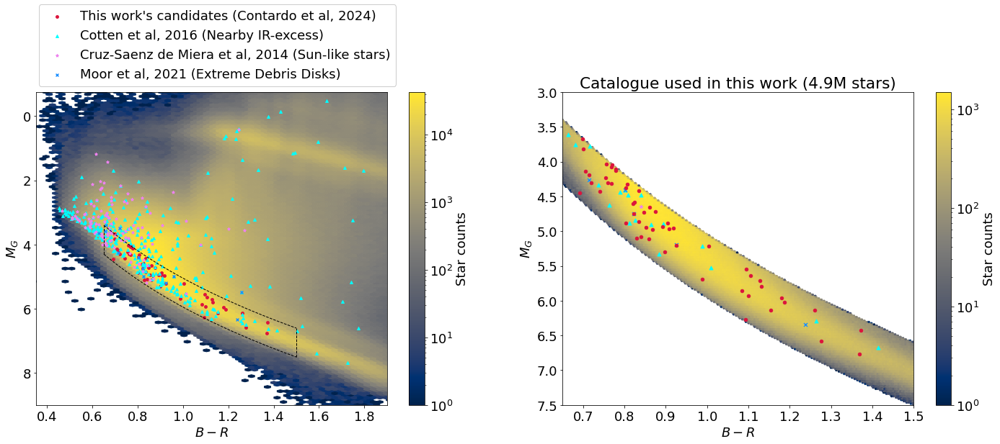

In [130]:




plt.rcParams.update({'font.size': 18})





fig, axs = plt.subplots(1,2, figsize=(12*2,8))
p = axs[0].hexbin(df_all['bp_rp'],
            df_all['M_G'],
            bins='log', gridsize=200, cmap=cm.cividis, rasterized=True)#    c= 'lightgrey', alpha=.3, s=.3)

# -0.3  4     0.3  6
slope = (3.9-6.2)/(-0.3-0.3)
b = (slope *-0.3 - 3.9)*-1

x = np.linspace(np.log(.65), np.log(1.5))
y = slope * x +b
y_under = y +.9

col_box, ls_box = 'k', '--'
axs[0].plot(np.exp(x),y, c=col_box, ls=ls_box, lw=1)
axs[0].plot(np.exp(x),y_under, c=col_box, ls='--', lw=1)
axs[0].plot([.65,.65], [y_under[0], y[0]], c=col_box, ls=ls_box, lw=1)
axs[0].plot([1.5,1.5], [y_under[-1], y[-1]], c=col_box,  ls=ls_box, lw=1)#,label='Our Sample')

axs[0].scatter(df_unwise_merge['bp_rp'].iloc[idc_candidates], 
                 df_unwise_merge['M_G'].iloc[idc_candidates], 
               s=15,
            c='crimson', marker='o',
            alpha=1, label='This work\'s candidates (Contardo et al, 2024)')


axs[0].scatter(df_all['bp_rp'][mask_cotten_all], 
            df_all['M_G'][mask_cotten_all], 
            s=15, c='cyan', marker='^', alpha=1, label='Cotten et al, 2016 (Nearby IR-excess)')

axs[0].scatter(df_all['bp_rp'][mask_sunlike_all], 
            df_all['M_G'][mask_sunlike_all], 
            s=15, c='violet', marker='*', alpha=1,
               label='Cruz-Saenz de Miera et al, 2014 (Sun-like stars)')


axs[0].scatter(df_all['bp_rp'][mask_edd_all], 
            df_all['M_G'][mask_edd_all], 
            s=15, c='dodgerblue', marker='x', alpha=1, label='Moor et al, 2021 (Extreme Debris Disks)')

# axs[0].scatter(df_all['bp_rp'][mask_mainseq_all], 
#             df_all['M_G'][mask_mainseq_all], 
#             s=12, c='lime', marker='v', alpha=1, label='Main-Sequence IR (Da Costa et al, 2017)')



axs[0].legend(facecolor='white', framealpha=1, bbox_to_anchor=(-.01, 1.3),#,ncol=2,
                   loc="upper left")
plt.colorbar(p, ax=axs[0], label='Star counts')

axs[0].set_xlabel(r"$B-R$")
#plt.gca().invert_xaxis()
axs[0].set_ylim(9,-.75)
#plt.gca().invert_yaxis()
axs[0].set_ylabel(r"$M_G$")
axs[0].set_xlim(0.35, 1.9)
#plt.xlim(np.log(0.5),np.log(2.5))




p = axs[1].hexbin(df_unwise_merge['bp_rp'],
            df_unwise_merge['M_G'],
            bins='log', gridsize=200, cmap=cm.cividis, rasterized=True)#    c= 'lightgrey', alpha=.3, s=.3)


axs[1].scatter(df_unwise_merge['bp_rp'][mask_sunlike_49], 
            df_unwise_merge['M_G'][mask_sunlike_49], 
            s=25, c='violet', marker='*', alpha=1)#, label='IR in Sun-Like stars (Cruz-Saenz de Miera et al, 2014)')


axs[1].scatter(df_unwise_merge['bp_rp'][mask_cotten_49], 
            df_unwise_merge['M_G'][mask_cotten_49], 
            s=25, c='cyan', marker='^', alpha=1)#, label='Census of IR-Nearby - prime (Cotten et al, 2016)')


axs[1].scatter(df_unwise_merge['bp_rp'][mask_edd_49], 
            df_unwise_merge['M_G'][mask_edd_49], 
            s=25, c='dodgerblue', marker='x', alpha=1)#, label='Previously identified EDD-excess (Moor et al, 2021)')

# axs[1].scatter(df_unwise_merge['bp_rp'][mask_mainseq_49], 
#             df_unwise_merge['M_G'][mask_mainseq_49], 
#             s=25, c='lime', marker='v', alpha=1)#, label='Main-Sequence IR (Da Costa et al, 2017)')




axs[1].scatter(df_unwise_merge['bp_rp'].iloc[idc_candidates], 
                 df_unwise_merge['M_G'].iloc[idc_candidates], 
               s=20,
            c='crimson', marker='o',
            alpha=1, label='This work\'s candidates')
axs[1].set_title('Catalogue used in this work (4.9M stars)')
plt.colorbar(p, ax=axs[1], label='Star counts')

axs[1].set_xlabel(r"$B-R$")
#plt.gca().invert_xaxis()
axs[1].set_ylim(7.5,3)
#plt.gca().invert_yaxis()
axs[1].set_ylabel(r"$M_G$")
axs[1].set_xlim(0.65, 1.5)
plt.savefig(f'{folder_figs}hexbin_candidates_lit.pdf',
            bbox_inches="tight", dpi=70)

In [373]:
del df_all, mask_edd_all, mask_cotten_all, mask_sunlike_all, mask_mainseq_all

In [351]:
df_unwise_merge[['source_id','cc_flags','ext_flag','ph_qual']].iloc[idc_candidates]

,source_id,cc_flags,ext_flag,ph_qual
219864,5085509597958589184,0,0,AABU
368011,3462639162734302464,0,0,AAUU
368708,6502798709139275136,0,0,AAUU
503270,6836154657401562112,0,0,AAAU
619181,2886776063720502144,0,0,AAAC
651479,6705842630930258816,0,0,AAUU
789805,387557473467906432,0,0,AABB
790296,3889059420143391744,0,0,AACU
804637,2144442781092733952,0,0,AAAB
810552,1406113335695903872,0,0,AAUU


In [134]:
10**-1

0.1

In [143]:
for c in df_unwise_merge['source_id'].iloc[idc_candidates]:
    print(f"Gaia DR3 {c}")

Gaia DR3 5085509597958589184
Gaia DR3 3462639162734302464
Gaia DR3 6502798709139275136
Gaia DR3 6836154657401562112
Gaia DR3 2886776063720502144
Gaia DR3 6705842630930258816
Gaia DR3 387557473467906432
Gaia DR3 3889059420143391744
Gaia DR3 2144442781092733952
Gaia DR3 1406113335695903872
Gaia DR3 1815157499757887488
Gaia DR3 1704765570250298496
Gaia DR3 4710409831751731712
Gaia DR3 3772493492333504768
Gaia DR3 1245496161713883904
Gaia DR3 3017430205815280384
Gaia DR3 302802517288053632
Gaia DR3 3221650540619783040
Gaia DR3 4420716452299884288
Gaia DR3 6830573291565067648
Gaia DR3 907249585730646016
Gaia DR3 1800491354668025344
Gaia DR3 1813144053445574784
Gaia DR3 1673109634053612416
Gaia DR3 6578449850774068224
Gaia DR3 5260430146906778624
Gaia DR3 709086185604311552
Gaia DR3 6809873615078147456
Gaia DR3 6359523376149191936
Gaia DR3 6770961795500483200
Gaia DR3 6405864801961715968
Gaia DR3 352632796577124992
Gaia DR3 3004530769758177280
Gaia DR3 6877999557398569600
Gaia DR3 2916199883

In [146]:
from cde.density_estimator import KernelMixtureNetwork


ModuleNotFoundError: No module named 'cde.utils'